# this will analyze the TCGA RNA-Seq DEG between BCAT1 hi vs low, and their association with methylation

# import packages

In [ ]:
library(data.table)
library(XML)
library(ggplot2)
library(gridExtra)
library(forestplot)
library(clusterProfiler)
library(IRdisplay)
library(pbapply)
library(TCGAbiolinks) 
library(edgeR)
library(survminer)
library(ChIPseeker)
library(ggpubr)
library(kableExtra)
library(tidyverse)
library(readxl)
library(corrplot)
library(TCGAbiolinks) 
library(ggrepel)
library(minfi)
library(org.Hs.eg.db)
library(sp)
#library(pathwayPCA)
library(minfi)
library(ggraph)
library(tidygraph)
library(ComplexHeatmap)
library(org.Hs.eg.db)
library(GSVA)
library(GEOquery)
library(survival)
library(survminer)
library(tidyverse)

library(DT)
library(ComplexHeatmap)
library(tools)
library(sesameData)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)


In [4]:
library(IlluminaHumanMethylation450kprobe)
library(IlluminaHumanMethylation450kmanifest)

In [6]:
library(TCGAbiolinks) 
library(data.table)
library(tidyverse)
library(org.Hs.eg.db)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(ChIPpeakAnno)


In [6]:
hs <- org.Hs.eg.db


In [7]:
options(width = 188)

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/'
source('~/script/utils.r')
setwd(base_dir)

path = '/usr/NX/bin:/cm/local/apps/environment-modules/4.5.3//bin:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/etc:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/bin:/usr/lpp/mmfs/bin:/usr/lpp/mmfs/lib:/usr/local/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/sbin:/usr/sbin:/cm/local/apps/environment-modules/4.5.3/bin:/usr/sbin:/sbin:/bin:/usr/bin:/etc:/usr/ucb:/usr/local/bin:/usr/local/local_dfs/bin:/usr/bin/X11:/usr/local/sas:/home/whu78/edirect:/home/whu78/.local/bin:/home/whu78/bin'
path = paste0(Sys.getenv('PATH'), ':', path)
Sys.setenv(PATH = path)


In [8]:
library(TxDb.Hsapiens.UCSC.hg38.knownGene)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene


# TCGA

## based on cbioportal 

In [9]:
meth = fread('~/WenhuoHu/cbioportal/laml_tcga_pub/data_methylation_hm450.txt')
meth = meth[!is.na(Hugo_Symbol), ]
meth = meth[Hugo_Symbol!= '', ]
meth = meth[!duplicated(Hugo_Symbol), ]
meth_df = setDF(meth[, 3:ncol(meth)], rownames = meth$Hugo_Symbol)
meth_t = as.data.table(t(meth_df), keep.rownames = T)
setkey(meth_t, 'rn')
dim(meth_t)
head2(meth_t)



[1]   194 15257

rn,MAN1B1,TSEN34,LRFN1,MUSTN1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2802-03,0.8432052,0.3720340,0.9758914,0.9053935
TCGA-AB-2803-03,0.7971931,0.2905080,0.9787533,0.9198333
TCGA-AB-2804-03,0.8051250,0.1555014,0.9607320,0.8923758


In [10]:
exp = fread('~/WenhuoHu/cbioportal/laml_tcga_pub/data_mrna_seq_v2_rsem.txt')
exp = exp[!is.na(Hugo_Symbol), ]
exp = exp[Hugo_Symbol!= '', ]
exp = exp[!duplicated(Hugo_Symbol), ]
exp_df = setDF(exp[, 3:ncol(exp)], rownames = exp$Hugo_Symbol)
exp_t = as.data.table(t(exp_df), keep.rownames = T)
setkey(exp_t, 'rn')
dim(exp_t)
head2(exp_t)


[1]   173 20512

rn,UBE2Q2P2,HMGB1P1,RNU12-2P,SSX9P
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2803-03,0.0000,92.5926,9.2593,0
TCGA-AB-2805-03,0.0000,92.6305,9.3708,0
TCGA-AB-2806-03,16.3654,119.5990,4.4558,0


In [11]:
ov = length(intersect(exp_t$rn, meth_t$rn))
plotdat = exp_t[, .(rn, BCAT1) ]
setnames(plotdat, 2, 'BCAT1_exp')
ov

[1] 170

## import gene expression and dna methylation data by TCGAbiolinks

In [ ]:
query.met <- GDCquery(
    project = "TCGA-LAML", 
    data.category = "DNA Methylation", 
    data.type = "Methylation Beta Value",
    platform = "Illumina Human Methylation 450"
)

GDCdownload(
    query = query.met, 
    files.per.chunk = 20
)

aml.met <- GDCprepare(
    query = query.met,
    save = FALSE
)


In [ ]:
normalized_data <- preprocessSWAN(aml.met)


In [22]:
aml.met

class: RangedSummarizedExperiment 
dim: 485577 194 
metadata(1): data_release
assays(1): ''
rownames(485577): cg13869341 cg14008030 ... cg11478607 cg08417382
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(65): barcode patient ... median_meth BCAT1

In [ ]:
tcga_meth_row_meta = as.data.frame(aml.met@rowRanges)
saveRDS(tcga_meth_row_meta, file = 'tcga_meth_row_meta.rds')


In [ ]:
query.exp <- GDCquery(
    project = "TCGA-LAML", 
    data.category = "Transcriptome Profiling",
    data.type = "Gene Expression Quantification", 
    workflow.type = "STAR - Counts"
)

GDCdownload( 
    query = query.exp,
    files.per.chunk = 20
)

aml.exp <- GDCprepare(
    query = query.exp, 
    save = FALSE,
    summarizedExperiment = TRUE
)


In [143]:
aml.exp

class: RangedSummarizedExperiment 
dim: 60660 151 
metadata(1): data_release
assays(6): unstranded stranded_first ... fpkm_unstrand fpkm_uq_unstrand
rownames(60660): ENSG00000000003.15 ENSG00000000005.6 ... ENSG00000288674.1 ENSG00000288675.1
rowData names(10): source type ... hgnc_id havana_gene
colnames: NULL
colData names(55): barcode patient ... idd bcat1_grp4

In [ ]:
clinical <- GDCquery_clinic(project = "TCGA-LAML", type = "clinical")


In [ ]:
clinical$vital_status
clinical$days_to_death


In [ ]:
query <- GDCquery(
    project = "TCGA-LAML", 
    data.category = "Simple Nucleotide Variation", 
    access = "open",
    data.type = "Masked Somatic Mutation", 
    workflow.type = "Aliquot Ensemble Somatic Variant Merging and Masking"
)
GDCdownload(query)
maf <- GDCprepare(query)


In [ ]:
maf <- getMC3MAF()


In [ ]:
query <- GDCquery(
    project = "TCGA-LAML", 
    data.category = "Clinical",
    data.type = "Clinical Supplement", 
    data.format = "BCR Biotab"
)
GDCdownload(query)
clin_aml <- GDCprepare(query)
names(clin_aml)


In [366]:
options(width = 166)

In [28]:
dsn_row = as.data.frame(aml.exp@rowRanges)
dsn_col = as.data.frame(aml.exp@colData)

In [29]:
mtx_tpm = log2(aml.exp@assays@data$tpm_unstrand + 1)
colnames(mtx_tpm) = dsn_col$patient
rownames(mtx_tpm) = dsn_row$gene_name
mtx_tpm = mtx_tpm[!is.na(rownames(mtx_tpm)), ]
mtx_tpm = mtx_tpm[!duplicated(rownames(mtx_tpm)), ]
mtx_tpm_t = as.data.table(t(mtx_tpm), keep.rownames = T)
head2(mtx_tpm_t)
                              

rn,TSPAN6,TNMD,DPM1,SCYL3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2987,0.7154541,0.19017234,6.240793,3.089193
TCGA-AB-2857,1.5067543,0.09976649,6.494840,3.677948
TCGA-AB-2847,0.7831633,0.09653174,6.290834,3.688348


In [31]:
mtx_tpm_t_clin = merge(mtx_tpm_t, dsn_col, by.x = 'rn', by.y = 'patient')

In [748]:
mtx_tpm_t_clin$bcat1_grp4 = cut_quantile(mtx_tpm_t_clin$BCAT1, n = 4)


In [747]:
dim(mtx_tpm_t_clin$bcat1_grp4)

NULL

In [912]:
head2(mtx_tpm_t_clin_genetics)

rn,TSPAN6,TNMD,DPM1,SCYL3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2805,0.00000000,0.09909318,6.491656,3.913052
TCGA-AB-2806,0.05658353,0.16722945,6.273447,3.870562
TCGA-AB-2808,0.24074173,0.00000000,5.932012,3.543991


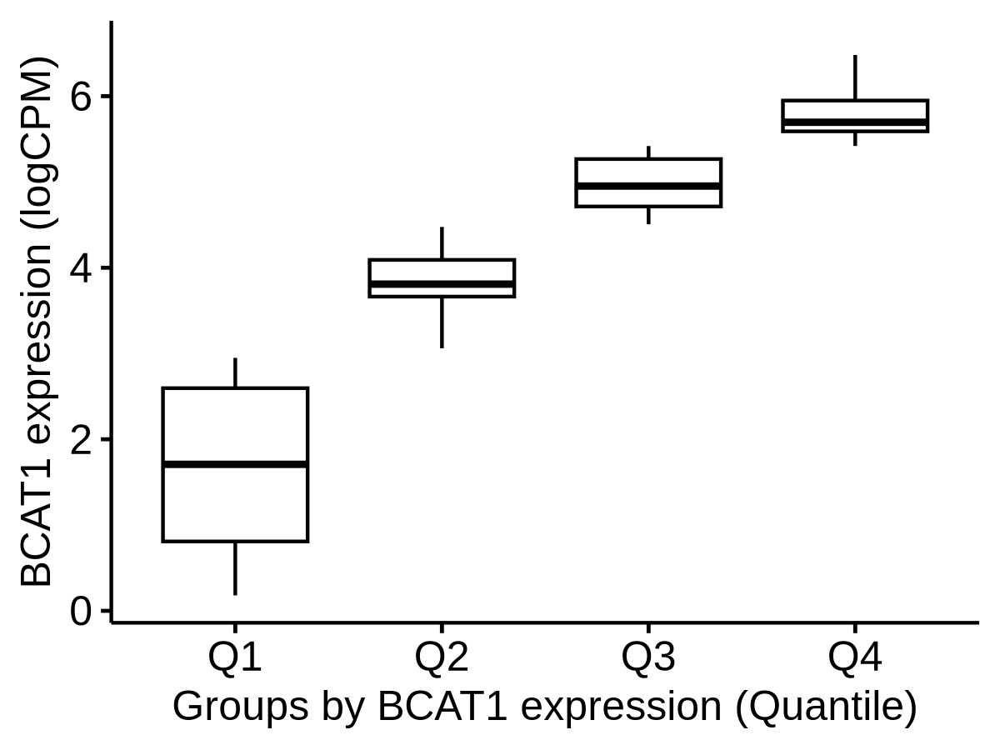

In [965]:
##### mar
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
gg = ggboxplot(mtx_tpm_t_clin_genetics, x = 'bcat1_grp4', y = 'BCAT1', outlier.shape = NA) + xlab('Groups by BCAT1 expression (Quantile)') +
ylab('BCAT1 expression (logCPM)')
ggsave(gg, file = '~/WenhuoHu/plot/mar/BCAT1_expression_quantile_TCGA.pdf', width = 4, height = 3)
gg
fwrite(mtx_tpm_t_clin_genetics[, c('rn', 'BCAT1', 'bcat1_grp4'), with = F], file = '~/WenhuoHu/plot/BCAT1_expression_quantile_TCGA.xls', sep = '\t')


In [117]:
# add mutation and cytogenetics

In [36]:
logcpm_3cohort = fread('../collab_Junhua/logcpm_t_9Jul.tsv')

In [37]:
mtx_tpm_t_clin_genetics = merge(mtx_tpm_t_clin, logcpm_3cohort[grep('TCGA', sample_name), .(sample_name, FLT3ITD, AML1ETO, MLL_re, DNMT3A_mut, TET2_mut, IDH1_mut, IDH2_mut)], by.x = 'rn', by.y = 'sample_name', all.x = T)


In [180]:
dim(mtx_tpm_t_clin_genetics)
head2(mtx_tpm_t_clin_genetics)

[1]   151 59489

rn,TSPAN6,TNMD,DPM1,SCYL3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2805,0.00000000,0.09909318,6.491656,3.913052
TCGA-AB-2806,0.05658353,0.16722945,6.273447,3.870562
TCGA-AB-2808,0.24074173,0.00000000,5.932012,3.543991


In [39]:
tmp = as.data.table(aml.met@colData)
tmp[, idd := 1:nrow(tmp) ]

tmp = merge(tmp, logcpm_3cohort[grep('TCGA', sample_name), .(sample_name, FLT3ITD, AML1ETO, MLL_re, DNMT3A_mut, TET2_mut, IDH1_mut, IDH2_mut)], by.x = 'patient', by.y = 'sample_name', all.x = T)
tmp = tmp[order(idd), ]
tmp = relocate(tmp, 'barcode')
aml.met@colData = DataFrame(tmp)
head2(aml.met@colData)


DataFrame with 3 rows and 5 columns
                 barcode      patient           sample shortLetterCode             definition
             <character>  <character>      <character>     <character>            <character>
1 TCGA-AB-2820-03A-01D.. TCGA-AB-2820 TCGA-AB-2820-03A              TB Primary Blood Derive..
2 TCGA-AB-2834-03A-01D.. TCGA-AB-2834 TCGA-AB-2834-03A              TB Primary Blood Derive..
3 TCGA-AB-2907-03A-01D.. TCGA-AB-2907 TCGA-AB-2907-03A              TB Primary Blood Derive..

In [184]:
tmp = as.data.table(aml.met@colData)
tmp[, idd := 1:nrow(tmp) ]
tmp = merge(tmp, mtx_tpm_t_clin_genetics[, .(rn, BCAT1)], by.x = 'patient', by.y = 'rn', all.x = T)
tmp = tmp[order(idd), ]
tmp = relocate(tmp, 'barcode')
aml.met@colData = DataFrame(tmp)
head2(aml.met@colData)



[1] 194  65

IDH1_mut,IDH2_mut,bcat1_grp4,mean_meth,median_meth,BCAT1
<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>
WT,WT,Q4,0.5370681,0.7114184,6.105181
WT,WT,NA,0.5288461,0.6713248,NA
WT,WT,NA,0.5414029,0.6990770,NA
WT,WT,Q3,0.5147809,0.5890534,5.394651


barcode,patient,sample,shortLetterCode,definition
<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-AB-2820-03A-01D-0741-05,TCGA-AB-2820,TCGA-AB-2820-03A,TB,Primary Blood Derived Cancer - Peripheral Blood
TCGA-AB-2834-03A-01D-0741-05,TCGA-AB-2834,TCGA-AB-2834-03A,TB,Primary Blood Derived Cancer - Peripheral Blood
TCGA-AB-2907-03A-01D-0742-05,TCGA-AB-2907,TCGA-AB-2907-03A,TB,Primary Blood Derived Cancer - Peripheral Blood


DataFrame with 3 rows and 5 columns
                 barcode      patient           sample shortLetterCode             definition
             <character>  <character>      <character>     <character>            <character>
1 TCGA-AB-2820-03A-01D.. TCGA-AB-2820 TCGA-AB-2820-03A              TB Primary Blood Derive..
2 TCGA-AB-2834-03A-01D.. TCGA-AB-2834 TCGA-AB-2834-03A              TB Primary Blood Derive..
3 TCGA-AB-2907-03A-01D.. TCGA-AB-2907 TCGA-AB-2907-03A              TB Primary Blood Derive..

In [185]:
aml.met

class: RangedSummarizedExperiment 
dim: 485577 194 
metadata(1): data_release
assays(1): ''
rownames(485577): cg13869341 cg14008030 ... cg11478607 cg08417382
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(65): barcode patient ... median_meth BCAT1

## logcpm

In [324]:
mtx = aml.exp@assays@data$unstrand
rownames(mtx) = aml.exp@rowRanges$gene_name
colnames(mtx) = aml.exp@colData$patient
head(mtx)

,TCGA-AB-2987,TCGA-AB-2857,TCGA-AB-2847,TCGA-AB-3000,TCGA-AB-2870,TCGA-AB-2826,TCGA-AB-2919,TCGA-AB-2940,TCGA-AB-2818,TCGA-AB-2990,⋯,TCGA-AB-2846,TCGA-AB-2808,TCGA-AB-2973,TCGA-AB-2984,TCGA-AB-2890,TCGA-AB-2897,TCGA-AB-2853,TCGA-AB-2885,TCGA-AB-2925,TCGA-AB-2815
TSPAN6,28,79,32,6,3,0,5,7,6,1,⋯,13,9,4,1,24,5,3,129,6,5
TNMD,2,1,1,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
DPM1,866,1018,913,632,549,795,717,683,742,841,⋯,824,792,578,1069,506,528,927,486,789,840
SCYL3,497,768,801,850,890,742,917,741,954,882,⋯,783,802,643,246,763,387,1224,761,628,927
C1orf112,249,1012,1257,934,1062,423,1040,715,574,761,⋯,795,798,319,277,476,314,730,828,566,1230
FGR,12247,2721,3082,2516,8239,16362,446,4077,15756,1951,⋯,7982,5538,18920,66,6803,807,2626,536,12509,9256


In [ ]:
mtx = aml.exp@assays@data$unstranded
rownames(aml_exp_q14_mtx) = aml_exp_q14@rowRanges$gene_name
colnames(aml_exp_q14_mtx) = aml_exp_q14@colData$patient

## DEG

In [733]:
tmp = as.data.table(aml.exp@colData)
tmp[, idd := 1:nrow(tmp) ]
tmp = merge(tmp, mtx_tpm_t_clin_genetics[, .(rn, bcat1_grp4)], by.x = 'patient', by.y = 'rn', all.x = T)
tmp = tmp[order(idd), ]
tmp = relocate(tmp, 'barcode')
dim(tmp)
aml.exp@colData = DataFrame(tmp)



[1] 151  57

In [738]:
aml_exp_q14

class: RangedSummarizedExperiment 
dim: 60660 76 
metadata(1): data_release
assays(6): unstranded stranded_first ... fpkm_unstrand fpkm_uq_unstrand
rownames(60660): ENSG00000000003.15 ENSG00000000005.6 ... ENSG00000288674.1 ENSG00000288675.1
rowData names(10): source type ... hgnc_id havana_gene
colnames: NULL
colData names(57): barcode patient ... bcat1_grp4.y bcat1_grp4

In [27]:
source('~/script/utils.r')

In [32]:
aml_exp_q14 = subset(aml.exp, select = aml.exp$bcat1_grp4 %in% c('Q1', 'Q4'))
dsn_col = data.frame(group = aml_exp_q14$bcat1_grp4, row.names = aml_exp_q14$patient)

In [34]:
aml_exp_q14_mtx = aml_exp_q14@assays@data$unstranded
rownames(aml_exp_q14_mtx) = aml_exp_q14@rowRanges$gene_name
colnames(aml_exp_q14_mtx) = aml_exp_q14@colData$patient

In [35]:
head(aml_exp_q14_mtx)

,TCGA-AB-2847,TCGA-AB-2826,TCGA-AB-2818,TCGA-AB-2943,TCGA-AB-2928,TCGA-AB-2939,TCGA-AB-2959,TCGA-AB-2970,TCGA-AB-2935,TCGA-AB-2835,⋯,TCGA-AB-2910,TCGA-AB-2896,TCGA-AB-2912,TCGA-AB-2938,TCGA-AB-2973,TCGA-AB-2984,TCGA-AB-2890,TCGA-AB-2897,TCGA-AB-2885,TCGA-AB-2925
TSPAN6,32,0,6,36,22,3,7,10,52,4,⋯,8,32,4,227,4,1,24,5,129,6
TNMD,1,0,0,0,0,0,1,0,0,0,⋯,0,0,0,4,0,0,0,0,0,0
DPM1,913,795,742,923,703,654,603,905,931,886,⋯,1280,845,879,587,578,1069,506,528,486,789
SCYL3,801,742,954,1804,1316,899,879,1171,883,422,⋯,832,760,678,754,643,246,763,387,761,628
C1orf112,1257,423,574,1240,1017,690,659,877,762,556,⋯,885,617,836,769,319,277,476,314,828,566
FGR,3082,16362,15756,3363,715,2745,659,4307,7526,19883,⋯,8528,2454,3871,1652,18920,66,6803,807,536,12509


In [146]:
dsn_col$group

[1] Q4 Q1 Q1 Q4 Q4 Q1 Q4 Q4 Q4 Q1 Q4 Q1 Q1 Q4 Q1 Q1 Q4 Q4 Q4 Q1 Q4 Q1 Q1 Q4 Q4 Q1 Q4 Q1 Q1 Q1 Q1 Q1 Q1 Q4 Q4 Q4 Q4 Q1 Q4 Q1 Q4 Q4 Q1 Q1 Q4 Q4 Q1 Q1 Q4 Q4 Q4 Q4 Q1 Q1 Q1 Q1 Q4 Q1 Q4 Q4 Q1
[62] Q4 Q1 Q4 Q1 Q1 Q1 Q4 Q4 Q4 Q1 Q1 Q4 Q1 Q4 Q1
Levels: Q1 Q2 Q3 Q4

In [83]:
deg_bcat1 = deg_fun(group1 = 'Q4', group2 = 'Q1', mtx = aml_exp_q14_mtx, dsn = dsn_col)

In [91]:
dge = DGEList(counts = aml_exp_q14_mtx, group = dsn_col$group)
dge <- calcNormFactors(dge)
dge = normLibSizes(dge)
logcpm_bcat1 = cpm(dge, normalized.lib.sizes = T, log = T)


In [84]:
#deg_bcat1[, logFC := - logFC]
deg_bcat1[, logFDR := -log(FDR, 10) ]
deg_bcat1[, sig := 'Not. Sig' ]
deg_bcat1[logFC > 1 & FDR < 0.01, sig := 'Up' ]
deg_bcat1[logFC < -1 & FDR < 0.01, sig := 'Dn' ]

In [145]:
head(deg_bcat1)

rn,logFC,logCPM,PValue,FDR,logFDR,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AC026310.2,3.764057,-0.06868897,7.344881e-50,2.838576e-45,44.54690,Up
BCAT1,3.918946,6.56555500,2.473737e-47,4.780126e-43,42.32056,Up
AC023796.2,3.797221,-1.61654828,2.578134e-40,3.321238e-36,35.47870,Up
RBPMS,2.442166,5.35733245,4.179731e-24,4.038351e-20,19.39380,Up
SRGN,-2.726758,11.09418539,1.381253e-23,1.067626e-19,18.97158,Dn
CLTCL1,-3.858870,6.03772039,2.310273e-22,1.488085e-18,17.82737,Dn


In [87]:
### mar
fwrite(deg_bcat1, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/deg_tcga_bcat1_q4_vs_q1.xls', sep = '\t')


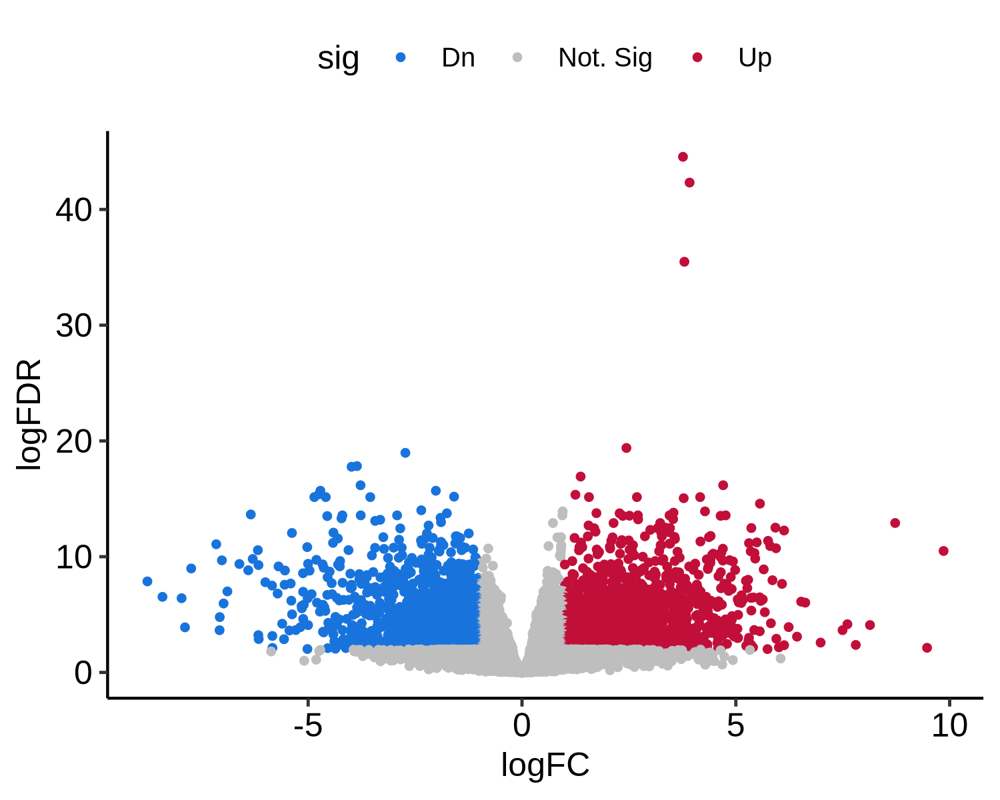

In [89]:
### mar

options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
gg = ggplot(deg_bcat1, aes(x = logFC, y = logFDR, color = sig)) + geom_point(size = 1) + 
theme_pubr() + scale_color_manual(values = c('#1874DC', 'grey', '#C10F3A'))
ggsave(gg, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/deg_tcga_bcat1_q4_vs_volcano.pdf', width = 5, height = 4)
gg


In [153]:
head(deg_bcat1)

rn,logFC,logCPM,PValue,FDR,logFDR,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AC026310.2,3.764057,-0.06868897,7.344881e-50,2.838576e-45,44.54690,Up
BCAT1,3.918946,6.56555500,2.473737e-47,4.780126e-43,42.32056,Up
AC023796.2,3.797221,-1.61654828,2.578134e-40,3.321238e-36,35.47870,Up
RBPMS,2.442166,5.35733245,4.179731e-24,4.038351e-20,19.39380,Up
SRGN,-2.726758,11.09418539,1.381253e-23,1.067626e-19,18.97158,Dn
CLTCL1,-3.858870,6.03772039,2.310273e-22,1.488085e-18,17.82737,Dn


In [40]:
ggboxplot(aml.exp, x = 'bcat1_grp4', y = 'BCAT1') + xlab('Groups by BCAT1 expression (quantile)') + ylab('BCAT1 expression (logCPM)')

## DEG pathway analysis

In [148]:
library(fgsea)
library(msigdbr)

In [149]:
pathwaysDF <- msigdbr("human", category="H")
pathways1 <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathwaysDF <- msigdbr(species = "Homo sapiens", category = "C2", subcategory = "CP:KEGG")
pathways2 <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)

pathways = c(pathways1, pathways2)


In [150]:
pathwaysDF <- msigdbr("human")
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)

plotdat = deg_bcat1$logFC
names(plotdat) = deg_bcat1$rn

fgsea_res <- fgsea(pathways = pathways,  stats = plotdat, minSize  = 15, maxSize  = 500)

tmp = as.data.table(pathwaysDF[, c('gs_cat', 'gs_subcat', 'gs_name')])
tmp = unique(tmp)

fgsea_res = merge(fgsea_res, tmp, by.x = 'pathway', by.y = 'gs_name', all.x = T) 

dim(fgsea_res)
head(fgsea_res)


Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“For some pathways, in reality P-values are less than 1e-50. You can set the `eps` argument to zero for better estimation.”


[1] 23132    10

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,gs_cat,gs_subcat
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>,<chr>
AAACCAC_MIR140,0.4526316,0.8015827,0.10027911,-0.2739889,-1.0108628,109,TP53INP2....,C3,MIR:MIR_Legacy
AAAGACA_MIR511,0.2574103,0.6331496,0.10282184,0.2961817,1.1030582,195,"ROBO2, G....",C3,MIR:MIR_Legacy
AAAGGAT_MIR501,0.2277070,0.6019105,0.11191832,0.3181381,1.1226800,124,"ADCYAP1,....",C3,MIR:MIR_Legacy
AAAGGGA_MIR204_MIR211,0.4754601,0.8176599,0.06815134,0.2632370,0.9911156,222,"FREM1, H....",C3,MIR:MIR_Legacy
AAANWWTGC_UNKNOWN,0.2804314,0.6543872,0.09688777,0.2937588,1.0942283,186,"POU4F1, ....",C3,TFT:TFT_Legacy
AAAYRNCTG_UNKNOWN,0.2047354,0.5741972,0.11012226,0.2784453,1.1040209,352,"HPSE2, P....",C3,TFT:TFT_Legacy


In [151]:
fgsea_res[pval < 0.05 & gs_subcat == 'CGP', ][order(pval), ]

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,gs_cat,gs_subcat
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>,<chr>
MULLIGHAN_MLL_SIGNATURE_2_UP,7.555376e-44,8.738548e-40,1.7268308,-0.6509233,-2.812059,418,"HOXB9, C....",C2,CGP
MULLIGHAN_MLL_SIGNATURE_1_UP,2.013376e-40,1.552447e-36,1.6533146,-0.6543733,-2.799664,381,"HOXB9, C....",C2,CGP
MULLIGHAN_MLL_SIGNATURE_2_DN,5.180449e-24,9.218012e-21,1.2709130,0.6485197,2.509351,274,"RUNX1T1,....",C2,CGP
VERHAAK_AML_WITH_NPM1_MUTATED_UP,6.336299e-24,1.046938e-20,1.2709130,-0.6947891,-2.739258,185,"DEFB1, C....",C2,CGP
MULLIGHAN_MLL_SIGNATURE_1_DN,1.433194e-21,1.950156e-18,1.2039752,0.6504026,2.471362,234,"RUNX1T1,....",C2,CGP
JAATINEN_HEMATOPOIETIC_STEM_CELL_UP,1.340711e-20,1.476825e-17,1.1778933,0.6039456,2.363389,318,"CYYR1, P....",C2,CGP
ROSS_AML_WITH_MLL_FUSIONS,6.748596e-19,6.004174e-16,1.1239150,-0.7883813,-2.810354,80,"CES1, CC....",C2,CGP
ROSS_AML_WITH_PML_RARA_FUSION,5.718395e-16,3.226291e-13,1.0276699,-0.7586632,-2.704417,80,"RASL12, ....",C2,CGP
GAL_LEUKEMIC_STEM_CELL_DN,1.375525e-15,7.231510e-13,1.0175448,-0.5725048,-2.318833,230,"ONECUT2,....",C2,CGP


In [152]:
plotdat1 = as.data.table(table(fgsea_res[padj < 0.05, gs_subcat]), keep.rownames = T)
setnames(plotdat1, c('gs_subcat', 'cnt_sig'))
tmp = as.data.table(pathwaysDF[, c('gs_cat', 'gs_subcat', 'gs_name')])
tmp = unique(tmp)
plotdat2 = as.data.table(table(tmp[, gs_subcat]), keep.rownames = T)
setnames(plotdat2, c('gs_subcat', 'cnt_all'))
plotdat = merge(plotdat1, plotdat2, by = 'gs_subcat')
plotdat[, per := cnt_sig / cnt_all ] 
plotdat = plotdat[order(per, decreasing = T), ]
plotdat = plotdat[!is.na(gs_subcat) & gs_subcat != '', ]
(plotdat)


gs_subcat,cnt_sig,cnt_all,per
<chr>,<int>,<int>,<dbl>
CGN,68,427,0.159250585
VAX,31,347,0.089337176
CP:KEGG,13,186,0.069892473
IMMUNESIGDB,286,4872,0.058702791
CGP,188,3384,0.055555556
MIR:MIRDB,129,2377,0.054270088
CM,22,431,0.051044084
GO:CC,42,1006,0.041749503
CP,1,29,0.034482759


[1] 383  12

Warning message:
"Removed 374 rows containing missing values or values outside the scale range (`geom_text_repel()`)."
Warning message:
"Removed 374 rows containing missing values or values outside the scale range (`geom_text_repel()`)."


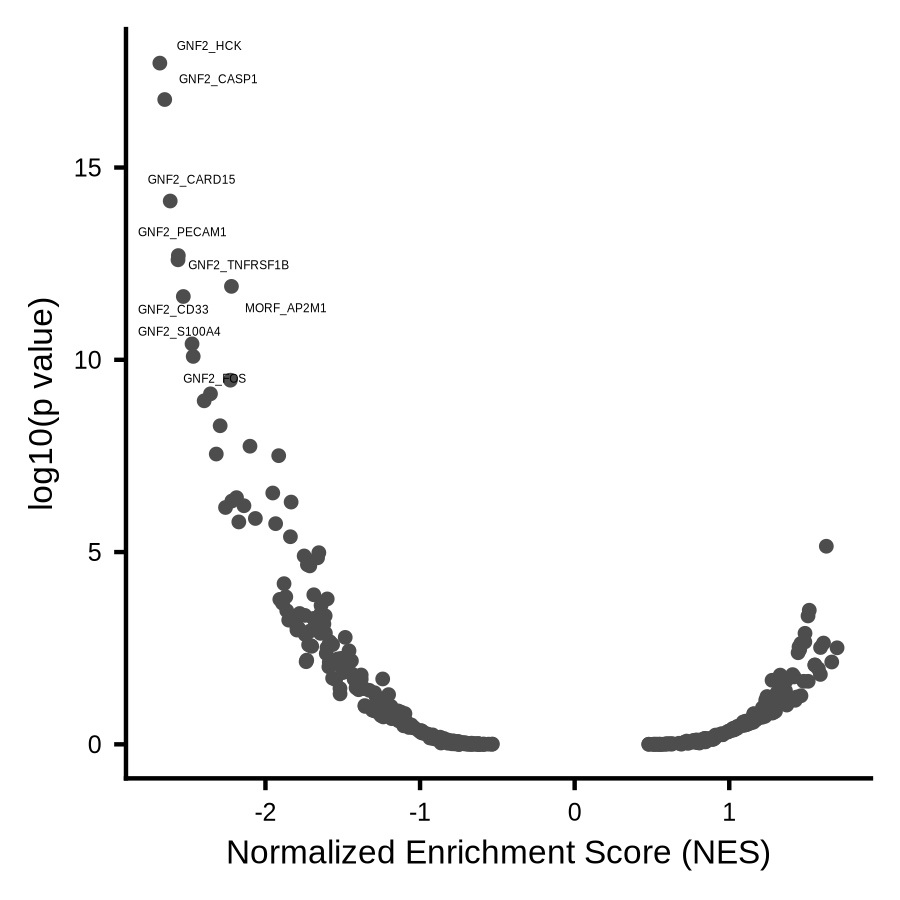

In [958]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)
plotdat = fgsea_res[gs_subcat == 'CGN', ][pval < 1,  ]
plotdat[, logFDR := -log(pval, 10) ]
plotdat[logFDR > 10, lbl := pathway ]
dim(plotdat)
gg = ggplot(plotdat, aes(x = NES, y = logFDR)) +
geom_point(color = 'grey30', size = 1) +
geom_text_repel(aes(label = lbl),  size = 1,  box.padding = 0.2,   point.padding = 0.2,
                  max.overlaps = 10,  min.segment.length = 0.5, force = 1) +  
xlab('Normalized Enrichment Score (NES)') + ylab('log10(p value)') +
theme_cowplot() +
theme(axis.title.x = element_text(size = 8), 
        axis.title.y = element_text(size = 8),
        axis.text.x = element_text(size = 6),  # Reduce x-axis tick label size
        axis.text.y = element_text(size = 6),  # Reduce y-axis tick label size
        axis.ticks.length = unit(1, "mm"))  # Reduce tick mark size
ggsave(gg, file = '~/WenhuoHu/plot/mar/tcga_bcat1_hi_vs_lo_gsea_CGN.pdf', width = 3, height = 3)
gg


[1] 2568   12

Warning message:
"Removed 2556 rows containing missing values or values outside the scale range (`geom_text_repel()`)."
Warning message:
"Removed 2556 rows containing missing values or values outside the scale range (`geom_text_repel()`)."


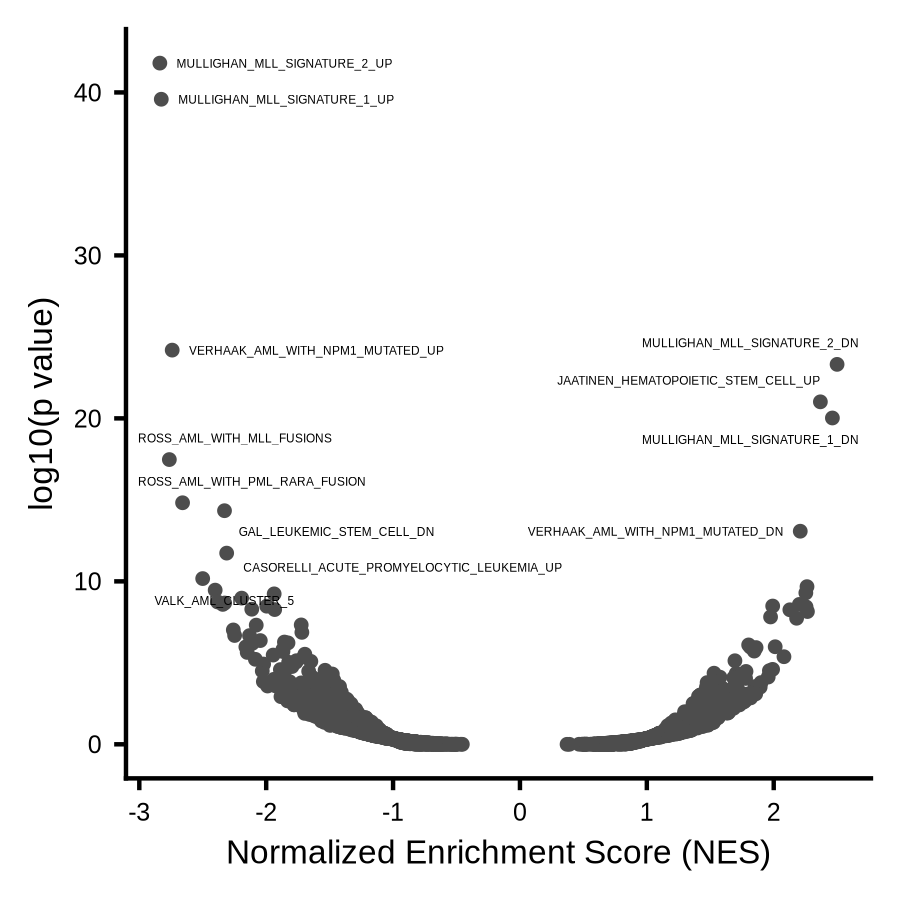

In [959]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)
plotdat = fgsea_res[gs_subcat == 'CGP', ][pval < 1,  ]
plotdat[, logFDR := -log(pval, 10) ]
plotdat[logFDR > 10, lbl := pathway ]
dim(plotdat)
gg = ggplot(plotdat, aes(x = NES, y = logFDR)) +
geom_point(color = 'grey30', size = 1) +
geom_text_repel(aes(label = lbl),  size = 1,  box.padding = 0.2,   point.padding = 0.2,
                  max.overlaps = 10,  min.segment.length = 0.5, force = 1) +  
xlab('Normalized Enrichment Score (NES)') + ylab('log10(p value)') +
theme_cowplot() +
theme(axis.title.x = element_text(size = 8), 
        axis.title.y = element_text(size = 8),
        axis.text.x = element_text(size = 6),  # Reduce x-axis tick label size
        axis.text.y = element_text(size = 6),  # Reduce y-axis tick label size
        axis.ticks.length = unit(1, "mm"))  # Reduce tick mark size
ggsave(gg, file = '~/WenhuoHu/plot/mar/tcga_bcat1_hi_vs_lo_gsea_CGP.pdf', width = 3, height = 3)
gg


In [75]:
##### mar
plotdat = fgsea_res[padj < 0.05, ][order(padj), ]
plotdat[, logFDR := -log(padj, 10) ]
plotdat[, updn := 'down-regulated' ]
plotdat[NES > 0, updn := 'up-regulated' ]
options(repr.plot.width = 9, repr.plot.height = 3, repr.plot.res = 300)
gg = ggplot(plotdat, aes(x = NES, y = pathway, fill = updn)) + geom_bar(stat = 'identity') + 
scale_fill_manual(values = c( c('#1874DC',  '#C10F3A'))) +
theme_pubr()
ggsave(gg, file = '~/WenhuoHu/plot/mar/tcga_bcat1_q4_vs_q1_gsea_barplot.pdf', width = 9, height = 3)
fwrite(plotdat, file = '~/WenhuoHu/plot/mar/tcga_bcat1_q4_vs_q1_gsea_barplot.xls', sep = '\t')
gg


ERROR: Error: object 'fgsea_res' not found


In [245]:
head(fgsea_res)

pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>


## methylation probes

In [183]:
met_assay = as.data.frame(assay(aml.met))
colnames(met_assay) = colData(aml.met)$patient
met_assay = met_assay[!is.na(met_assay[, 1]), ]
dim(met_assay)
head(met_assay)

[1] 419188    194

,TCGA-AB-2820,TCGA-AB-2834,TCGA-AB-2907,TCGA-AB-2860,TCGA-AB-2987,TCGA-AB-2802,TCGA-AB-2912,TCGA-AB-2937,TCGA-AB-3009,TCGA-AB-2822,⋯,TCGA-AB-2893,TCGA-AB-2991,TCGA-AB-2883,TCGA-AB-2868,TCGA-AB-2933,TCGA-AB-2815,TCGA-AB-2806,TCGA-AB-2803,TCGA-AB-2816,TCGA-AB-2858
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cg21870274,0.9468636,0.8917181,0.7279987,0.7142758,0.6254675,0.9422213,0.9076475,0.9321413,0.9434045,0.8910656,⋯,0.8643214,0.7672789,0.6292331,0.6047219,0.9199514,0.8075438,0.9383901,0.9561515,0.7167662,0.7819337
cg08258224,0.9341366,0.8625047,0.8866142,0.8111682,0.7640439,0.7741067,0.8155077,0.9513121,0.9328338,0.9481954,⋯,0.8425006,0.5549990,0.9078151,0.8850148,0.8478841,0.6457341,0.7690907,0.9227901,0.8957913,0.8753022
cg16619049,0.1759337,0.5853813,0.3973959,0.6689342,0.4779156,0.7952200,0.2380224,0.2362806,0.9282960,0.5750057,⋯,0.1229066,0.7444135,0.2618014,0.6840850,0.2461930,0.6182981,0.1320708,0.9801954,0.8217208,0.3043563
cg18147296,0.8646709,0.8298466,0.8074146,0.8075105,0.6797458,0.6152393,0.8561870,0.8891721,0.8827631,0.8941376,⋯,0.8041969,0.8429980,0.8205765,0.8052135,0.8550889,0.8423599,0.8707798,0.8662713,0.9108702,0.8649698
cg13938959,0.5630350,0.4943619,0.7319818,0.4261075,0.3460068,0.5409752,0.2182752,0.5029939,0.5255058,0.5336407,⋯,0.8676097,0.5002222,0.4997751,0.7599573,0.6315971,0.4723376,0.1888177,0.8236412,0.5066883,0.3380445
cg12445832,0.4059090,0.1395645,0.2508933,0.2931942,0.2761562,0.4867122,0.1015120,0.4580122,0.1984021,0.4615292,⋯,0.4304769,0.3141716,0.2818025,0.5076546,0.4667413,0.3080670,0.1009109,0.6856354,0.4617594,0.2574826


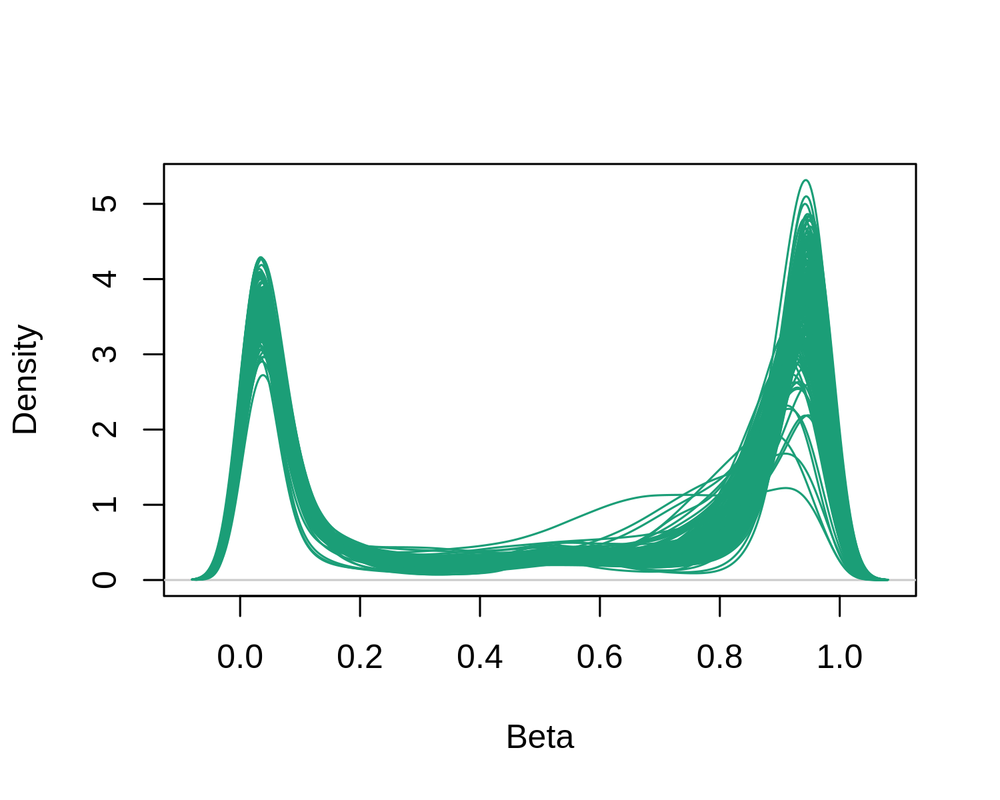

In [231]:
densityPlot(as.matrix(met_assay))

In [184]:
# how many probes main at low, intermediate and high levels
lvl_assay = met_assay
lvl_assay[,] = F

row_names = rownames(met_assay) 
for(ii in 1:ncol(met_assay)){
    lvl_assay[, ii] = met_assay[, ii] < .2 | is.na(met_assay[, ii])
}

bot_probes = row_names[rowSums(lvl_assay) > ncol(lvl_assay) * .8]

# how many probes main at low, intermediate and high levels
lvl_assay = met_assay
lvl_assay[,] = F

row_names = rownames(met_assay) 
for(ii in 1:ncol(met_assay)){
    lvl_assay[, ii] = met_assay[, ii] > .8 | is.na(met_assay[, ii])
}

top_probes = row_names[rowSums(lvl_assay) > ncol(lvl_assay) * .8]

# how many probes main at low, intermediate and high levels
lvl_assay = met_assay
lvl_assay[,] = F

row_names = rownames(met_assay) 
for(ii in 1:ncol(met_assay)){
    lvl_assay[, ii] = (met_assay[, ii] < .8 & met_assay[, ii] > .2) | is.na(met_assay[, ii])
}

int_probes = row_names[rowSums(lvl_assay) > ncol(lvl_assay) * .8]

rm(lvl_assay)


In [786]:
length(row_names)

[1] 419188

In [185]:
length(bot_probes)
length(int_probes)
length(top_probes)

[1] 133637

[1] 12834

[1] 159714

In [799]:
head(met_assay)

,TCGA-AB-2820,TCGA-AB-2834,TCGA-AB-2907,TCGA-AB-2860,TCGA-AB-2987,TCGA-AB-2802,TCGA-AB-2912,TCGA-AB-2937,TCGA-AB-3009,TCGA-AB-2822,⋯,TCGA-AB-2893,TCGA-AB-2991,TCGA-AB-2883,TCGA-AB-2868,TCGA-AB-2933,TCGA-AB-2815,TCGA-AB-2806,TCGA-AB-2803,TCGA-AB-2816,TCGA-AB-2858
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cg21870274,0.9468636,0.8917181,0.7279987,0.7142758,0.6254675,0.9422213,0.9076475,0.9321413,0.9434045,0.8910656,⋯,0.8643214,0.7672789,0.6292331,0.6047219,0.9199514,0.8075438,0.9383901,0.9561515,0.7167662,0.7819337
cg08258224,0.9341366,0.8625047,0.8866142,0.8111682,0.7640439,0.7741067,0.8155077,0.9513121,0.9328338,0.9481954,⋯,0.8425006,0.5549990,0.9078151,0.8850148,0.8478841,0.6457341,0.7690907,0.9227901,0.8957913,0.8753022
cg16619049,0.1759337,0.5853813,0.3973959,0.6689342,0.4779156,0.7952200,0.2380224,0.2362806,0.9282960,0.5750057,⋯,0.1229066,0.7444135,0.2618014,0.6840850,0.2461930,0.6182981,0.1320708,0.9801954,0.8217208,0.3043563
cg18147296,0.8646709,0.8298466,0.8074146,0.8075105,0.6797458,0.6152393,0.8561870,0.8891721,0.8827631,0.8941376,⋯,0.8041969,0.8429980,0.8205765,0.8052135,0.8550889,0.8423599,0.8707798,0.8662713,0.9108702,0.8649698
cg13938959,0.5630350,0.4943619,0.7319818,0.4261075,0.3460068,0.5409752,0.2182752,0.5029939,0.5255058,0.5336407,⋯,0.8676097,0.5002222,0.4997751,0.7599573,0.6315971,0.4723376,0.1888177,0.8236412,0.5066883,0.3380445
cg12445832,0.4059090,0.1395645,0.2508933,0.2931942,0.2761562,0.4867122,0.1015120,0.4580122,0.1984021,0.4615292,⋯,0.4304769,0.3141716,0.2818025,0.5076546,0.4667413,0.3080670,0.1009109,0.6856354,0.4617594,0.2574826


In [998]:
##### mar
pdf(file = '~/WenhuoHu/plot/mar/tcga_probes_3groups_denityplot.pdf', width = 5, height = 4)
densityPlot(t(as.matrix(met_assay[int_probes, ])))
densityPlot(t(as.matrix(met_assay[top_probes, ])))
densityPlot(t(as.matrix(met_assay[bot_probes, ])))
dev.off()


png 
  2

In [789]:
#densityPlot(as.matrix(met_assay[setdiff(row_names, c(bot_probes, int_probes, top_probes)), ]))
pdf(file = '~/plot/tcga_meth_probe_hist.pdf', width = 3, height = 3)
densityPlot(as.matrix(met_assay[c(bot_probes, top_probes, int_probes), ]))
densityPlot(as.matrix(met_assay[bot_probes, ]))
densityPlot(as.matrix(met_assay[top_probes, ]))
densityPlot(as.matrix(met_assay[int_probes, ]))
dev.off()


pdf 
  2

In [999]:
##### mar
pdf(file = '~/WenhuoHu/plot/mar/tcga_probes_all_denityplot.pdf', width = 5, height = 4)
densityPlot(as.matrix(met_assay[c(bot_probes, top_probes, int_probes), ]))
dev.off()


png 
  2

In [77]:
# means for each subset probes
aml.met$mean_bot_probe = colMeans(assay(aml.met)[bot_probes, ], na.rm = T) 
aml.met$mean_int_probe = colMeans(assay(aml.met)[int_probes, ], na.rm = T) 
aml.met$mean_top_probe = colMeans(assay(aml.met)[top_probes, ], na.rm = T) 

aml.met$median_bot_probe = apply(assay(aml.met)[bot_probes, ], 2, median, na.rm = T) 
aml.met$median_int_probe = apply(assay(aml.met)[int_probes, ], 2, median, na.rm = T) 
aml.met$median_top_probe = apply(assay(aml.met)[top_probes, ], 2, median, na.rm = T)  


## BCAT1 expression vs DNA methylation

In [61]:
xx = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/tcgaAML_logcpm_clin_151_cases_from_GDC_wide.xls')

In [62]:
setkey(xx, 'sampleName') 

In [63]:
aml.met$is_sel = F
aml.met$is_sel[aml.met$patient %in% xx$sampleName] = T


In [64]:
aml.met$karyotype = xx[aml.met$patient, karyotype]

In [65]:
aml.met$BCAT1_v2 = xx[aml.met$patient, BCAT1]
aml.met$BCAT2_v2 = xx[aml.met$patient, BCAT2]


In [66]:
aml.met


class: RangedSummarizedExperiment 
dim: 485577 194 
metadata(1): data_release
assays(1): ''
rownames(485577): cg13869341 cg14008030 ... cg11478607 cg08417382
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(69): barcode patient ... BCAT1_v2 BCAT2_v2

In [67]:
dim( aml.met[, aml.met$is_sel == T] )

[1] 485577    148

In [976]:
ov = intersect(colnames(aml_mut), colnames(xx)) 
for(ii in ov){
    colData(aml.met)[[ii]] = unlist(xx[aml.met$patient, ii, with = F])
}


In [68]:
table(aml.met$karyotype)


Altered  Normal 
     85      63 

In [977]:
plotdat = fread('~/WenhuoHu/plot/points')
setnames(plotdat, c('id', 'x', 'y'))
cor.test(plotdat$x, plotdat$y)


	Pearson's product-moment correlation

data:  plotdat$x and plotdat$y
t = 11.693, df = 113, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.6441034 0.8129114
sample estimates:
      cor 
0.7399434 


[1] 23 69

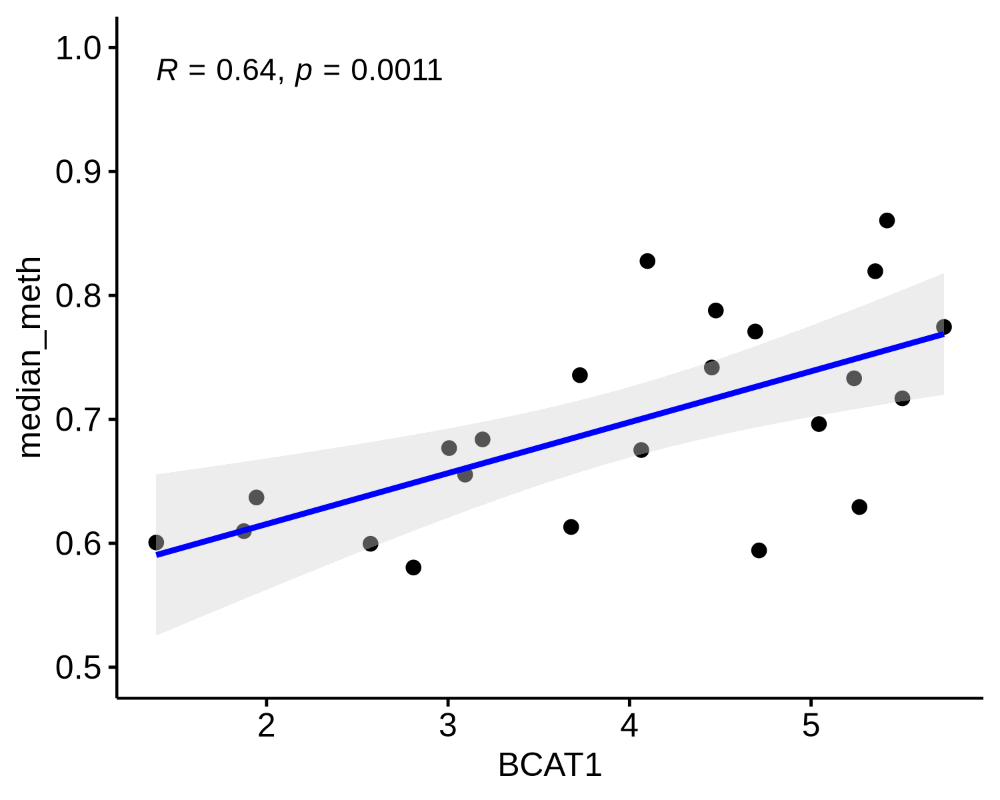

In [71]:
##### mar
plotdat = as.data.table(colData(aml.met))
plotdat = plotdat[is_sel == T, ]
plotdat = plotdat[!is.na(BCAT1), ] 
plotdat = plotdat[TET2_mut == 'WT' & IDH1_mut == 'WT' & IDH2_mut == 'WT', ]
plotdat = plotdat[DNMT3A_mut == 'WT', ] 
plotdat = plotdat[karyotype == 'Normal', ]
plotdat = plotdat[mean_meth > 0.48, ]
dim(plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
gg = ggscatter(plotdat, x = 'BCAT1', y = 'median_meth', add = 'reg.line',    
          add.params = list(color = "blue", fill = "lightgray"), 
          conf.int = TRUE ) + stat_cor(method = "pearson") + ylim(.5, 1)
gg
ggsave(gg, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_bcat1_expression_vs_dna_methylation.pdf', width = 4, height = 3)



[1] 23 70

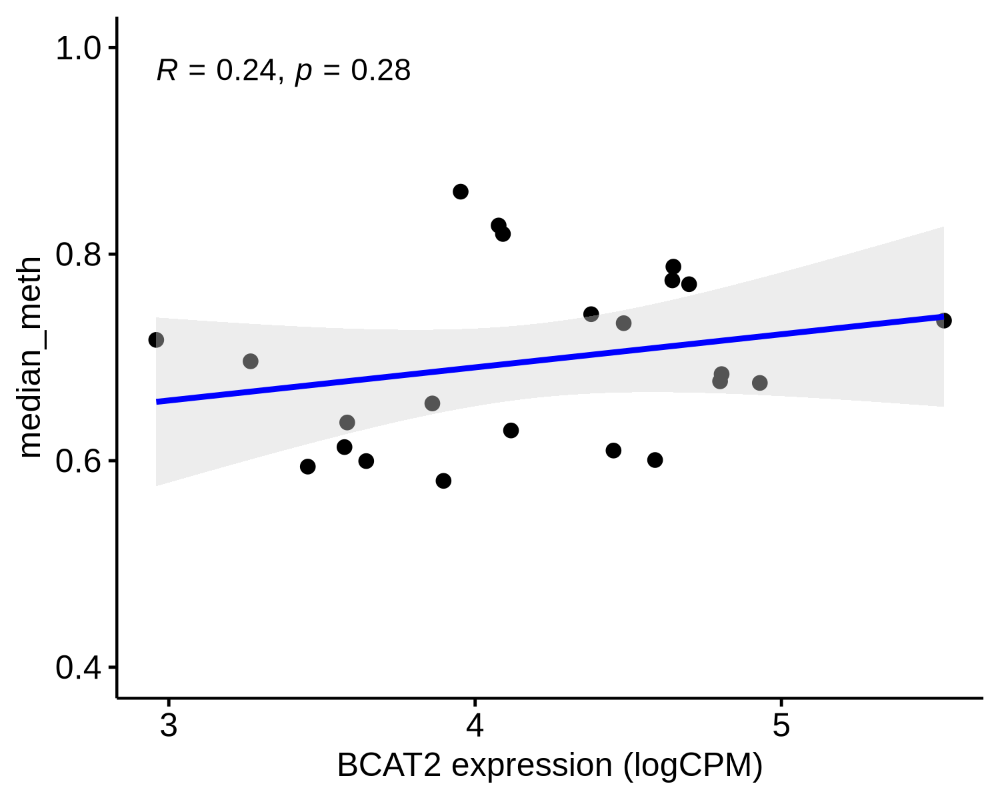

In [74]:
##### mar
plotdat = as.data.table(colData(aml.met))
plotdat = plotdat[is_sel == T, ]
plotdat = plotdat[!is.na(BCAT2_v2), ] 
plotdat = plotdat[TET2_mut == 'WT' & IDH1_mut == 'WT' & IDH2_mut == 'WT', ]
plotdat = plotdat[DNMT3A_mut == 'WT', ] 
plotdat = plotdat[karyotype == 'Normal', ]
plotdat = plotdat[mean_meth > 0.48, ]
plotdat[, BCAT2 := BCAT2_v2 ]
dim(plotdat)
#ggscatter(plotdat, x = 'BCAT1', y = 'median_int_probe', add = 'reg.line',    
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
gg = ggscatter(plotdat, x = 'BCAT2_v2', y = 'median_meth', add = 'reg.line',    
          add.params = list(color = "blue", fill = "lightgray"), 
          conf.int = TRUE ) + stat_cor(method = "pearson") + ylim(.5, 1) + xlab('BCAT2 expression (logCPM)')
gg

ggsave(gg, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_bcat2_expression_vs_dna_methylation.pdf', width = 4, height = 3)
fwrite(plotdat[, .(BCAT1, BCAT2, median_meth, TET2_mut, IDH1_mut, IDH2_mut, DNMT3A_mut,karyotype, mean_meth)], 
       file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_bcat_expression_vs_dna_methylation.xls', sep = '\t')



[1] 23 75

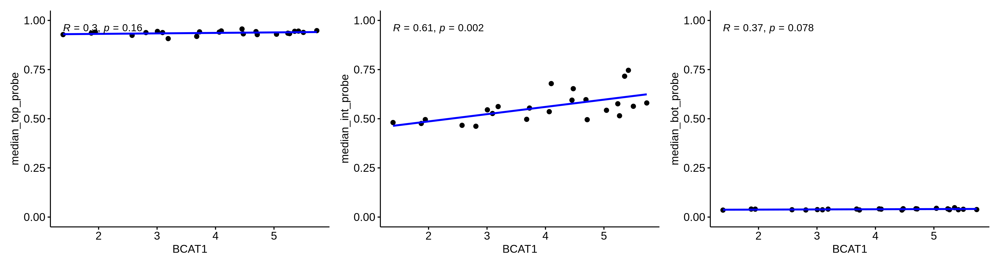

In [79]:
##### mar
plotdat = as.data.table(colData(aml.met))
plotdat = plotdat[is_sel == T, ]
plotdat = plotdat[!is.na(BCAT1), ] 
plotdat = plotdat[TET2_mut == 'WT' & IDH1_mut == 'WT' & IDH2_mut == 'WT', ]
plotdat = plotdat[DNMT3A_mut == 'WT', ] 
plotdat = plotdat[karyotype == 'Normal', ]
plotdat = plotdat[mean_meth > 0.48, ]
dim(plotdat)
#ggscatter(plotdat, x = 'BCAT1', y = 'median_int_probe', add = 'reg.line',    
options(repr.plot.width = 15, repr.plot.height = 4, repr.plot.res = 300)
gg1 = ggscatter(plotdat, x = 'BCAT1', y = 'median_top_probe', add = 'reg.line', add.params = list(color = "blue", fill = "lightgray"), conf.int = F) + stat_cor(method = "pearson") + ylim(0, 1)
gg2 = ggscatter(plotdat, x = 'BCAT1', y = 'median_int_probe', add = 'reg.line', add.params = list(color = "blue", fill = "lightgray"), conf.int = F) + stat_cor(method = "pearson") + ylim(0, 1)
gg3 = ggscatter(plotdat, x = 'BCAT1', y = 'median_bot_probe', add = 'reg.line', add.params = list(color = "blue", fill = "lightgray"), conf.int = F) + stat_cor(method = "pearson") + ylim(0, 1)
gg = gg1 | gg2 | gg3
gg
ggsave(gg, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_bcat1_expression_vs_dna_methylation_3lines.pdf', width = 15, height = 4)


In [80]:
aml.met$mean_meth = apply(assay(aml.met), 2, mean, na.rm = T) 
aml.met$median_meth = apply(assay(aml.met), 2, median, na.rm =  T) 


## where are these probes

In [178]:
tmp = fread('~/humanmethylation450_15017482_v1-2.csv', skip = 7)
dim(tmp)
head(tmp)
bead450 = copy(tmp)
setkey(bead450, 'IlmnID')

Warning message in fread("~/humanmethylation450_15017482_v1-2.csv", skip = 7):
“Stopped early on line 485586. Expected 33 fields but found 5. Consider fill=TRUE and comment.char=. First discarded non-empty line: <<[Controls],,,,>>”


[1] 485577     33

IlmnID,Name,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Infinium_Design_Type,Next_Base,Color_Channel,Forward_Sequence,⋯,UCSC_RefGene_Group,UCSC_CpG_Islands_Name,Relation_to_UCSC_CpG_Island,Phantom,DMR,Enhancer,HMM_Island,Regulatory_Feature_Name,Regulatory_Feature_Group,DHS
<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>,<chr>,<lgl>
cg00035864,cg00035864,31729416,AAAACACTAACAATCTTATCCACATAAACCCTTAAATTTATCTCAAATTC,NA,,II,,,AATCCAAAGATGATGGAGGAGTGCCCGCTCATGATGTGAAGTACCTGCTCAGCTGGAAAC[CG]AATTTGAGATAAATTCAAGGGTCTATGTGGACAAGACTGCTAGTGTCTCTCTCTGGATTG,⋯,TSS1500,,,,,NA,,,,NA
cg00050873,cg00050873,32735311,ACAAAAAAACAACACACAACTATAATAATTTTTAAAATAAATAAACCCCA,31717405,ACGAAAAAACAACGCACAACTATAATAATTTTTAAAATAAATAAACCCCG,I,A,Red,TATCTCTGTCTGGCGAGGAGGCAACGCACAACTGTGGTGGTTTTTGGAGTGGGTGGACCC[CG]GCCAAGACGGCCTGGGCTGACCAGAGACGGGAGGCAGAAAAAGTGGGCAGGTGGTTGCAG,⋯,Body;TSS1500,chrY:9363680-9363943,N_Shore,,,NA,Y:9973136-9976273,,,NA
cg00061679,cg00061679,28780415,AAAACATTAAAAAACTAATTCACTACTATTTAATTACTTTATTTTCCATC,NA,,II,,,TCAACAAATGAGAGACATTGAAGAACTAATTCACTACTATTTGGTTACTTTATTTTCCAT[CG]AAGAAAACCTCTTTTTAAAAACTAACACATAAATAAAATGAACGAAGAACAAACTAAACG,⋯,Body;Body;Body,,,,,NA,,,,NA
cg00063477,cg00063477,16712347,TATTCTTCCACACAAAATACTAAACRTATATTTACAAAAATACTTCCATC,NA,,II,,,CTCCTGTACTTGTTCATTAAATAATGATTCCTTGGATATACCAAGTCTGGATAGCGGATT[CG]ATGGAAGCATTTTTGTAAATATACGTTCAGTATTTTGTGTGGAAGAACACAATCTAGCTG,⋯,Body,chrY:22737825-22738052,S_Shelf,,,NA,,,,NA
cg00121626,cg00121626,19779393,AAAACTAATAAAAATAACTTACAAACCAAATACTATACCCTACAACTCTC,NA,,II,,,AGGTGAATGAAGAGACTAATGGGAGTGGCTTGCAAGCCAGGTACTGTGCCCTACAACTCT[CG]CGCTGCCACAAAAAGCCAATTAACGAAGCAAACTGTTTTATCTTTTCCTCTCCCCAGAAG,⋯,Body,chrY:21664481-21665063,N_Shore,,,NA,,,,NA
cg00212031,cg00212031,29674443,CCCAATTAACCACAAAAACTAAACAAATTATACAATCAAAAAAACATACA,38703326,CCCAATTAACCGCAAAAACTAAACAAATTATACGATCGAAAAAACGTACG,I,T,Red,CCATTGGCCCGCCCCAGTTGGCCGCAGGGACTGAGCAAGTTATGCGGTCGGGAAGACGTG[CG]TTAAAGGGCTGAAGGGGAGGGACGGAACTGACAGTCTCTGTGACAGCTCTGAGGTGGGAG,⋯,TSS200,chrY:21238448-21240005,Island,,,NA,Y:19697854-19699393,,,NA


In [199]:
bead450[, chr := paste0('chr', CHR)]
bead450[, start :=  MAPINFO]
bead450[, end :=  MAPINFO + 1]

In [191]:
colnames(bead450)

[1] "IlmnID"                      "Name"                        "AddressA_ID"                 "AlleleA_ProbeSeq"            "AddressB_ID"                 "AlleleB_ProbeSeq"           
 [7] "Infinium_Design_Type"        "Next_Base"                   "Color_Channel"               "Forward_Sequence"            "Genome_Build"                "CHR"                        
[13] "MAPINFO"                     "SourceSeq"                   "Chromosome_36"               "Coordinate_36"               "Strand"                      "Probe_SNPs"                 
[19] "Probe_SNPs_10"               "Random_Loci"                 "Methyl27_Loci"               "UCSC_RefGene_Name"           "UCSC_RefGene_Accession"      "UCSC_RefGene_Group"         
[25] "UCSC_CpG_Islands_Name"       "Relation_to_UCSC_CpG_Island" "Phantom"                     "DMR"                         "Enhancer"                    "HMM_Island"                 
[31] "Regulatory_Feature_Name"     "Regulatory_Feature_Group"    "DHS"

In [210]:
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg19.knownGene) # Reference for hg19
library(org.Hs.eg.db)                     # For gene annotation (optional)
txdb <- TxDb.Hsapiens.UCSC.hg19.knownGene
library(clusterProfiler)


In [189]:
int_probes_gr = as.data.table(bead450[int_probes, ])


In [200]:
int_probes_gr = as.data.table(bead450[int_probes, .(chr, start, end)])
head(int_probes_gr)
int_probes_gr = makeGRangesFromDataFrame(int_probes_gr)


chr,start,end
<chr>,<int>,<dbl>
chr1,845810,845811
chr1,846155,846156
chr1,846637,846638
chr1,846742,846743
chr1,856914,856915
chr1,860022,860023


chr,start,end
<chr>,<int>,<dbl>
chr1,845810,845811
chr1,846155,846156
chr1,846637,846638
chr1,846742,846743
chr1,856914,856915
chr1,860022,860023


>> preparing features information...		 2025-02-27 02:39:19 PM 
>> identifying nearest features...		 2025-02-27 02:39:19 PM 
>> calculating distance from peak to TSS...	 2025-02-27 02:39:19 PM 
>> assigning genomic annotation...		 2025-02-27 02:39:19 PM 
>> adding gene annotation...			 2025-02-27 02:39:21 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-02-27 02:39:21 PM 
>> done...					 2025-02-27 02:39:21 PM 


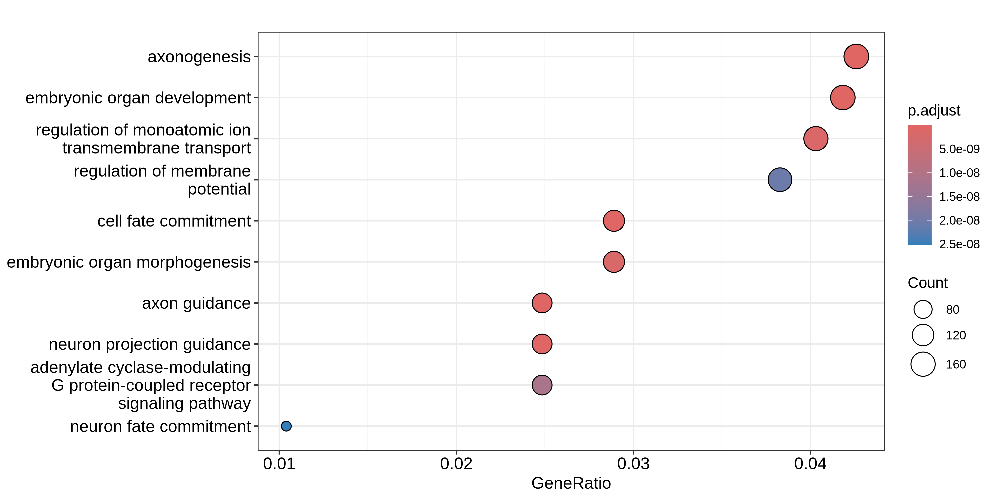

In [213]:
int_probes_gr = as.data.table(bead450[int_probes, .(chr, start, end)])

head(int_probes_gr)
int_probes_gr = makeGRangesFromDataFrame(int_probes_gr)
int_probes_ann = annotatePeak(peak = int_probes_gr, tssRegion = c(-3000, 3000),  TxDb = txdb, annoDb = "org.Hs.eg.db")
#plotAnnoPie(int_probes_ann)
#plotAnnoBar(int_probes_ann)
#plotDistToTSS(int_probes_ann)

# Perform GO enrichment analysis
goEnrichment <- enrichGO( gene =int_probes_ann@anno[abs(int_probes_ann@anno$distanceToTSS) < 3000,]$geneId, 
                         OrgDb = org.Hs.eg.db,  keyType = "ENTREZID", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
dotplot(goEnrichment, showCategory = 10)



chr,start,end
<chr>,<int>,<dbl>
chr1,838379,838380
chr1,838486,838487
chr1,841289,841290
chr1,843581,843582
chr1,849540,849541
chr1,853925,853926


>> preparing features information...		 2025-02-27 02:39:39 PM 
>> identifying nearest features...		 2025-02-27 02:39:39 PM 
>> calculating distance from peak to TSS...	 2025-02-27 02:39:41 PM 
>> assigning genomic annotation...		 2025-02-27 02:39:41 PM 
>> adding gene annotation...			 2025-02-27 02:39:44 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-02-27 02:39:44 PM 
>> done...					 2025-02-27 02:39:44 PM 


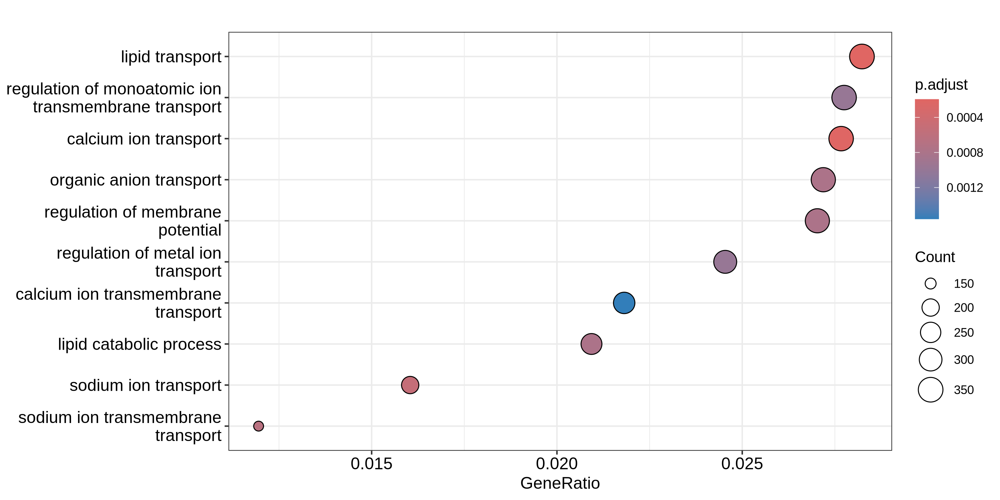

In [214]:
int_probes_gr = as.data.table(bead450[top_probes, .(chr, start, end)])

head(int_probes_gr)
int_probes_gr = makeGRangesFromDataFrame(int_probes_gr)
int_probes_ann = annotatePeak(peak = int_probes_gr, tssRegion = c(-3000, 3000),  TxDb = txdb, annoDb = "org.Hs.eg.db")
#plotAnnoPie(int_probes_ann)
#plotAnnoBar(int_probes_ann)
#plotDistToTSS(int_probes_ann)

# Perform GO enrichment analysis
goEnrichment <- enrichGO( gene =int_probes_ann@anno[abs(int_probes_ann@anno$distanceToTSS) < 3000,]$geneId, 
                         OrgDb = org.Hs.eg.db,  keyType = "ENTREZID", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
dotplot(goEnrichment, showCategory = 10)



chr,start,end
<chr>,<int>,<dbl>
chr1,840274,840275
chr1,840618,840619
chr1,848379,848380
chr1,856685,856686
chr1,856693,856694
chr1,859173,859174


>> preparing features information...		 2025-02-27 02:40:08 PM 
>> identifying nearest features...		 2025-02-27 02:40:08 PM 
>> calculating distance from peak to TSS...	 2025-02-27 02:40:10 PM 
>> assigning genomic annotation...		 2025-02-27 02:40:10 PM 
>> adding gene annotation...			 2025-02-27 02:40:12 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-02-27 02:40:12 PM 
>> done...					 2025-02-27 02:40:12 PM 


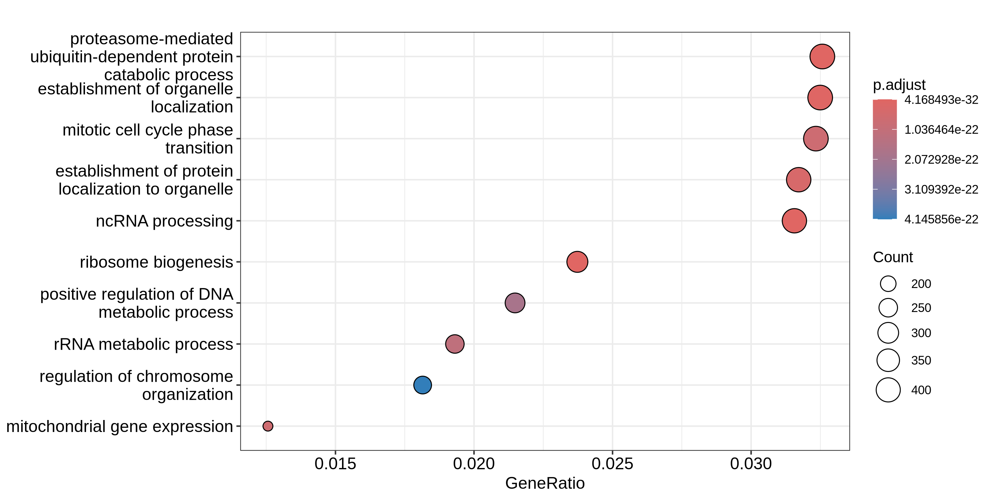

In [215]:
int_probes_gr = as.data.table(bead450[bot_probes, .(chr, start, end)])

head(int_probes_gr)
int_probes_gr = makeGRangesFromDataFrame(int_probes_gr)
int_probes_ann = annotatePeak(peak = int_probes_gr, tssRegion = c(-3000, 3000),  TxDb = txdb, annoDb = "org.Hs.eg.db")
#plotAnnoPie(int_probes_ann)
#plotAnnoBar(int_probes_ann)
#plotDistToTSS(int_probes_ann)

# Perform GO enrichment analysis
goEnrichment <- enrichGO( gene =int_probes_ann@anno[abs(int_probes_ann@anno$distanceToTSS) < 3000,]$geneId, 
                         OrgDb = org.Hs.eg.db,  keyType = "ENTREZID", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
options(repr.plot.width = 10, repr.plot.height = 5, repr.plot.res = 300)
dotplot(goEnrichment, showCategory = 10)



In [216]:
head(int_probes)

[1] "cg04364728" "cg05151709" "cg01782097" "cg20825023" "cg06931612" "cg25215298"

In [217]:
logcpm_t = fread(file = '~/WenhuoHu/collab_JinWang/bcat/data/batch_corrected_normalized_3cohort_with_basic_clinical_info_Nov26.tsv')


In [218]:
plotdat = logcpm_t[grep('TCGA', rn), ]
table(plotdat$karyotype) 



Altered  Normal 
     93      80 

[1]    76 17641

Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_cor()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_point()`).”


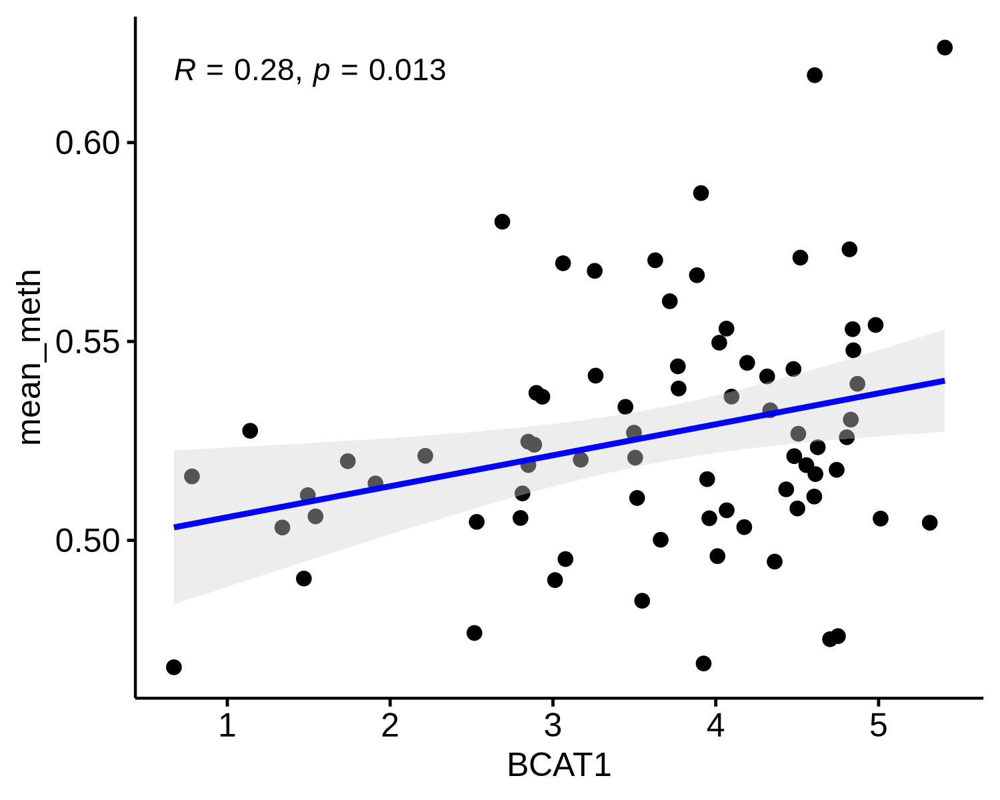

In [123]:
plotdat = logcpm_t[grep('TCGA', rn), ]
plotdat = merge(plotdat, as.data.table(colData(aml.met))[, .(patient, mean_meth, median_meth)], by.x = 'rn2', by.y = 'patient', all.x = T) 
plotdat = plotdat[TET2_mut == 'WT' & IDH1_mut == 'WT' & IDH2_mut == 'WT' & karyotype == 'Normal' & DNMT3A_mut == 'WT', ]
dim(plotdat)
ggscatter(plotdat, x = 'BCAT1', y = 'mean_meth', add = 'reg.line',    
          add.params = list(color = "blue", fill = "lightgray"), 
          conf.int = TRUE ) + stat_cor(method = "pearson")


[1]   107 59491

Warning message:
“Removed 2 rows containing missing values or values outside the scale range (`geom_point()`).”


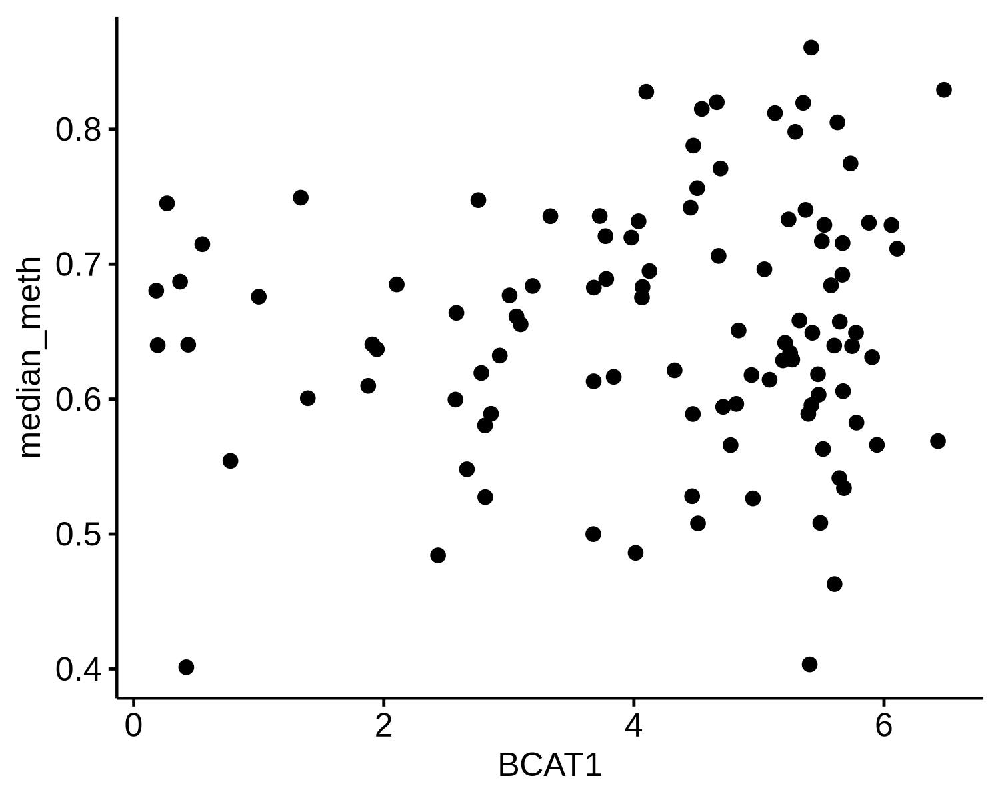

In [90]:
plotdat = merge(mtx_tpm_t_clin_genetics, as.data.table(colData(aml.met))[, .(patient, mean_meth, median_meth)], by.x = 'rn', by.y = 'patient', all.x = T) 
plotdat = plotdat[TET2_mut == 'WT' & IDH1_mut == 'WT' & IDH2_mut == 'WT', ]
dim(plotdat)
ggscatter(plotdat, x = 'BCAT1', y = 'median_meth')

## Sei

### run Sei for each subset of CpGs

In [ ]:
#top_probes_gr = as.data.table(IlluminaHumanMethylation450kprobe[top_probes, ])
#top_probes_gr[, chr := paste0('chr', chr)]
#head(top_probes_gr)
#fwrite(top_probes_gr[, .(chr, start, end)], file = 'top.bed', sep = '\t', col.names = F)

#/home/whu78/script/ai/sei-framework
#bash 1_sequence_prediction.sh ~/WenhuoHu/collab_JinWang/int.bed hg19 int_sei --cuda
#bash 1_sequence_prediction.sh ~/WenhuoHu/collab_JinWang/bot.bed hg19 bot_sei --cuda
#bash 1_sequence_prediction.sh ~/WenhuoHu/collab_JinWang/top.bed hg19 top_sei --cuda
#bash 2_raw_sc_score.sh int_sei/chromatin-profiles-hdf5/int_predictions.h5 int_sei
#bash 2_raw_sc_score.sh top_sei/chromatin-profiles-hdf5/top_predictions.h5 top_sei
#bash 2_raw_sc_score.sh bot_sei/chromatin-profiles-hdf5/bot_predictions.h5 bot_sei

In [146]:
seqclass_names = fread('~/script/ai/sei-framework/model/seqclass.names', sep = '\t', header = F)
length(seqclass_names)
seqclass_names[, id := 1:nrow(seqclass_names) ]
setkey(seqclass_names, 'id')
head(seqclass_names)

[1] 1

V1,id
<chr>,<int>
PC1 Polycomb / Heterochromatin,1
L1 Low signal,2
TN1 Transcription,3
TN2 Transcription,4
L2 Low signal,5
E1 Stem cell,6


In [166]:
library(minfi)
library(IlluminaHumanMethylation450kanno.ilmn12.hg19)

In [173]:
tmp = fread('~/script/ai/sei-framework/int_sei/int.raw_sequence_class_scores.txt')
head(tmp)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
6.840312,4.324433,1.116690,1.759981,1.776384,5.007123,5.058698,4.750381,3.268280,4.668005,⋯,0.058214,0.880097,1.783575,4.835938,2.845352,1.508127,1.401906,1.972786,4.868415,1.254516
8.289777,5.503189,1.659413,2.485104,2.216412,6.574240,8.088708,6.313642,4.076846,8.486375,⋯,0.163327,0.919667,2.440079,5.235174,3.207319,2.474984,1.485269,2.567473,4.832326,1.952335
6.634946,4.929560,1.657635,2.409174,2.175320,6.650227,7.812137,6.132209,3.340277,10.225509,⋯,0.252551,0.615658,1.629560,3.874282,2.572639,2.086526,0.829750,2.232647,3.838461,1.540189
6.410657,5.080762,1.635875,2.379781,2.217431,6.676437,6.924578,5.894410,3.272327,11.259332,⋯,0.337258,0.594133,1.429641,3.719959,2.578872,2.216461,0.785377,2.292440,3.811803,1.424633
5.177690,3.260723,1.857710,2.215546,1.157385,3.968156,4.285344,3.793299,2.281661,3.868248,⋯,0.057556,0.724359,1.903206,3.203988,2.047981,2.728449,0.796592,2.202860,2.877525,1.513818
8.485717,5.345230,2.538680,3.044951,2.556579,9.099682,12.781314,7.611260,4.109167,17.300545,⋯,0.451859,2.515715,2.753189,5.578586,4.941370,1.869779,1.330638,2.654569,4.565275,2.548634


In [220]:
head(bead450)

IlmnID,Name,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Infinium_Design_Type,Next_Base,Color_Channel,Forward_Sequence,⋯,Phantom,DMR,Enhancer,HMM_Island,Regulatory_Feature_Name,Regulatory_Feature_Group,DHS,chr,start,end
<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<lgl>,<chr>,<chr>,<chr>,<lgl>,<chr>,<int>,<dbl>
cg00000029,cg00000029,14782418,AACTATACTAACRAAAAAATATCCAAAAAACACTAACRTATAAAAATTTC,NA,,II,,,TTTTTTAGATAAGGATATCCAGGCGATGAGGAAGTTTTACTTCTGGGAACAGCCTGGATA[CG]AAACCTTCACACGTCAGTGTCTTTTGGACATTTTCTCGTCAGTACAGCCCTGTTGAATGT,⋯,,,NA,,16:53467838-53469685,Promoter_Associated,TRUE,chr16,53468112,53468113
cg00000108,cg00000108,12709357,ATACAATAAAACAAACCTAAAATAATCCTAACTCCRCTATCATCCTAACC,NA,,II,,,TCCATTTTGAAGGAAAAAAATGAAGGCTCTGAAAGTGTAAATCGCTTACTGAAGGGCACA[CG]GCCAGGATGACAGCGGAGCCAGGATCACCCCAGGTCTGTCTCATTGCATATGTCATGGCT,⋯,,,NA,,,,NA,chr3,37459206,37459207
cg00000109,cg00000109,59755374,CAATACTAACAAACACATATACCCCCCCACAAATCTTAACTTCTAAATAC,NA,,II,,,GCCTTAGTCCTGAATGAGCCATTTCTCTAAGAAGTCCTGGCTTCTTTTTTAATAGAGAAT[CG]TATTTAGAAGCCAAGATCTGTGGGGGGGTACATGTGCCTGTTAGTATTGCAGTTGTGCCT,⋯,low-CpG:173398671-173398760,,NA,,,,NA,chr3,171916037,171916038
cg00000165,cg00000165,12637463,CAAAATCTATTAATACAATAACTTTTAATAAAACAACTAAAACACACATC,NA,,II,,,CTAAGTGCAGTCAGGATCTGTTAGTACAGTGGCTTTTGATGGAACAGCTGAGGCACACAT[CG]CCCGTGGCATGGACTCCGGGGCCGAACGCTCACGACCAAGACTTTTGCCCTTTTGAAATG,⋯,,CDMR,TRUE,1:90967262-90967361,,,NA,chr1,91194674,91194675
cg00000236,cg00000236,12649348,TATAACRTCATATTAAAAAAAACRATCTAACCCACCAATTTATACATCAC,NA,,II,,,CTCAGCGACAGTGTAGCGTCATGTTAGAGGAGACGATCTGACCCACCAGTTTGTACATCA[CG]TCCTGCATGTCCCACACCATTTTTTCATGACCTTGTAATATACTGGTCTCTGTGCTATAG,⋯,,,NA,,,,NA,chr8,42263294,42263295
cg00000289,cg00000289,18766346,ATCTACTATATTCATTTCTCCAATCTCATATCCATTTTAATATAAAAATC,NA,,II,,,CAAGTGAGCTAGCAAACACACATGCACCAATGTGCCTTTTGACAAGAGTACCCCCTACCC[CG]ACTCCCACACCAAAATGGACATGAGATTGGAGAAATGAATACAGCAGATGGAACAGATAG,⋯,,,NA,,,,NA,chr14,69341139,69341140


Warning message:
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(mtx$seqclass_name)). In the next version, this warning will become an error."


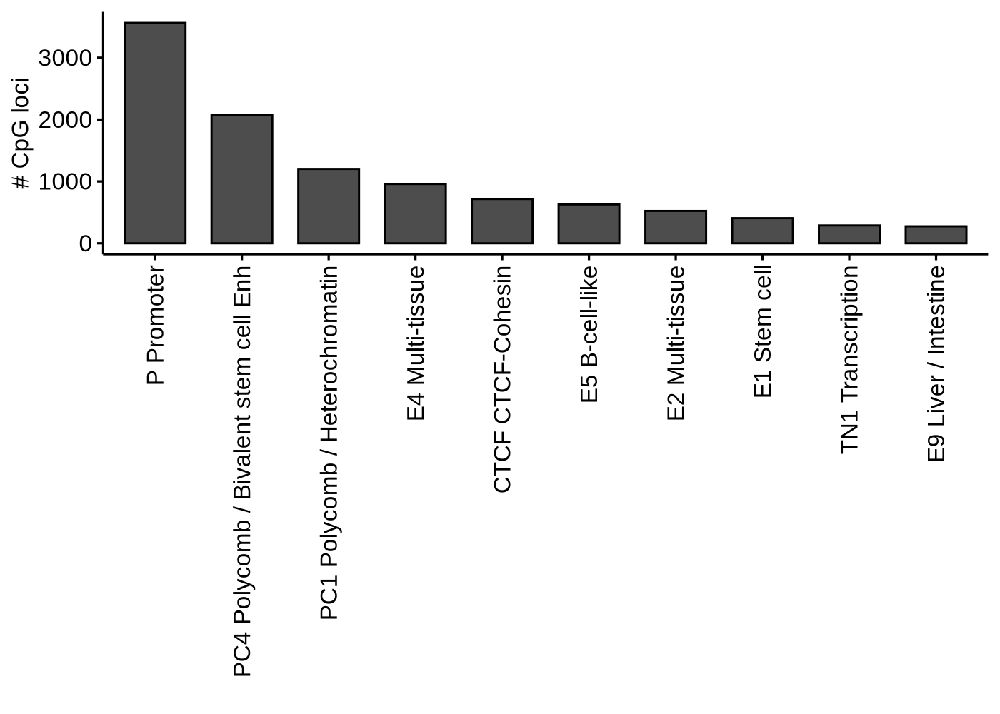

In [1000]:
##### mar

mtx = as.data.table(bead450[int_probes, ])
mtx[, chr := paste0('chr', chr)]
fwrite(mtx[, .(chr, start, end)], file = 'int.bed', sep = '\t', col.names = F)
#/home/whu78/script/ai/sei-framework
#bash 1_sequence_prediction.sh ~/WenhuoHu/collab_JinWang/int.bed hg19 int_sei --cuda
#bash 2_raw_sc_score.sh int_sei/chromatin-profiles-hdf5/int_predictions.h5 int_sei
int_probe_mtx = fread('~/script/ai/sei-framework/int_sei/int.raw_sequence_class_scores.txt')
mtx$seqclass = apply(int_probe_mtx, 1, which.max)
mtx$seqclass_name = seqclass_names[mtx$seqclass, V1]
mtx1 = copy(mtx) 
plotdat = as.data.table(melt(table(mtx$seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab('# CpG loci') + xlab('')
gg1
ggsave(gg1, file = '~/WenhuoHu/plot/mar/tcga_int_probes_sequenceType.pdf', width = 5, height = 4)


Warning message:
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(mtx$seqclass_name)). In the next version, this warning will become an error."


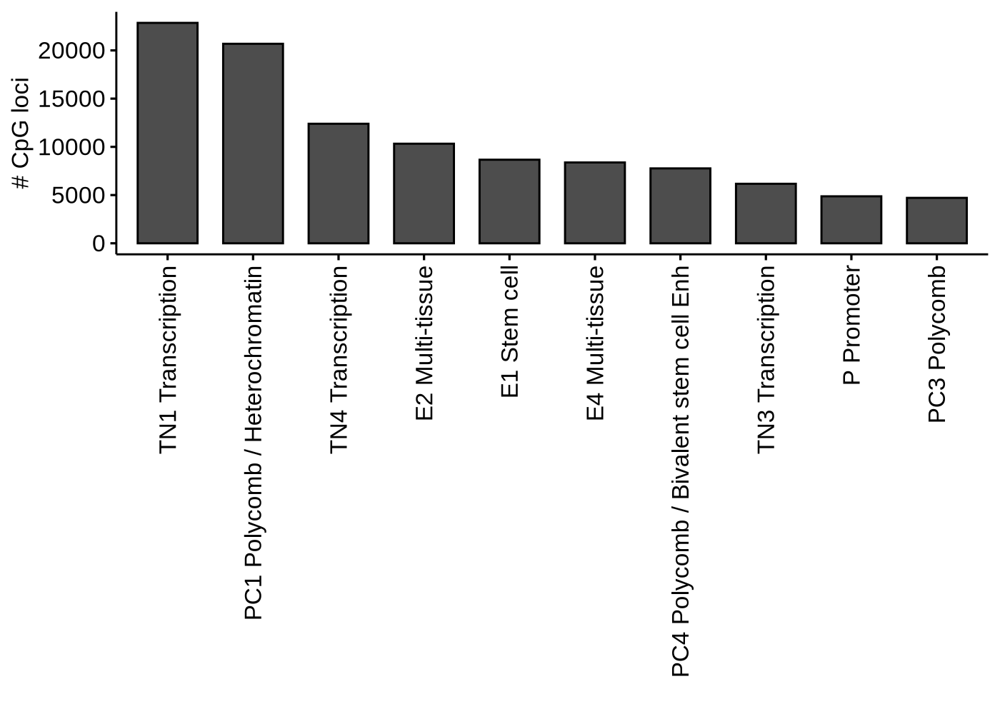

In [1001]:
##### mar

mtx = as.data.table(bead450[top_probes, ])
mtx[, chr := paste0('chr', chr)]
fwrite(mtx[, .(chr, start, end)], file = 'top.bed', sep = '\t', col.names = F)
#/home/whu78/script/ai/sei-framework
#bash 1_sequence_prediction.sh ~/WenhuoHu/collab_JinWang/top.bed hg19 top_sei --cuda
#bash 2_raw_sc_score.sh top_sei/chromatin-profiles-hdf5/top_predictions.h5 top_sei
tmp = fread('~/script/ai/sei-framework/top_sei/top.raw_sequence_class_scores.txt')
mtx$seqclass = apply(tmp, 1, which.max)
mtx$seqclass_name = seqclass_names[mtx$seqclass, V1]
mtx2 = copy(mtx) 
plotdat = as.data.table(melt(table(mtx$seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg2 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab('# CpG loci') + xlab('')
gg2
ggsave(gg2, file = '~/WenhuoHu/plot/mar/tcga_top_probes_sequenceType.pdf', width = 5, height = 4)


Warning message:
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(mtx$seqclass_name)). In the next version, this warning will become an error."


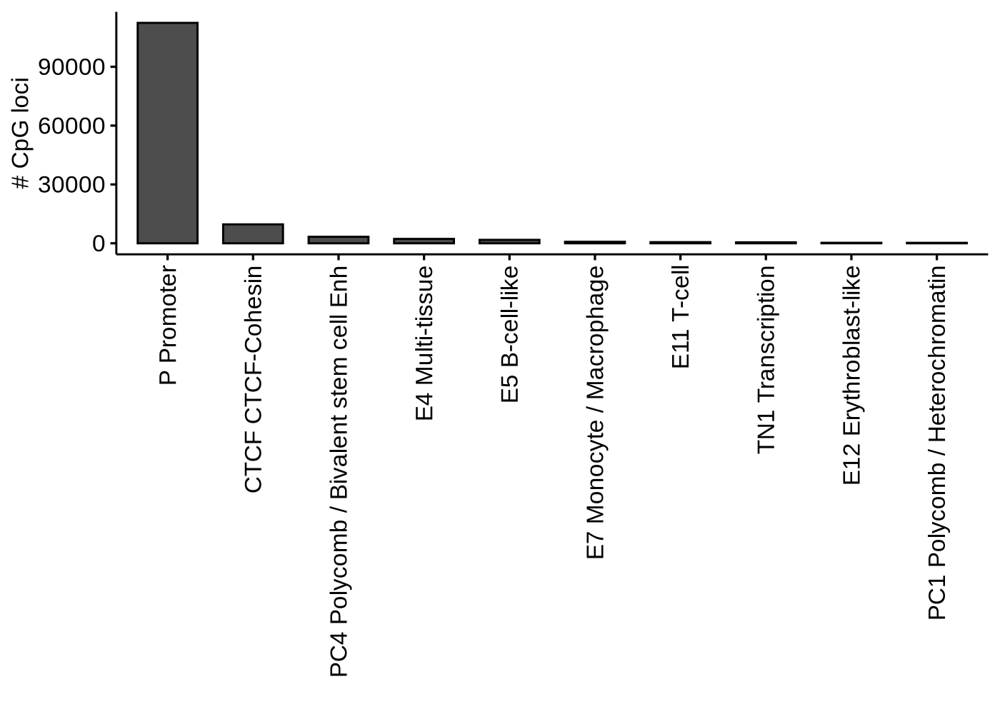

In [1002]:
##### mar
mtx = as.data.table(bead450[bot_probes, ])
mtx[, chr := paste0('chr', chr)]
fwrite(mtx[, .(chr, start, end)], file = 'bot.bed', sep = '\t', col.names = F)
#/home/whu78/script/ai/sei-framework
#bash 1_sequence_prediction.sh ~/WenhuoHu/collab_JinWang/bot.bed hg19 bot_sei --cuda
#bash 2_raw_sc_score.sh bot_sei/chromatin-profiles-hdf5/bot_predictions.h5 bot_sei
tmp = fread('~/script/ai/sei-framework/bot_sei/bot.raw_sequence_class_scores.txt')
mtx$seqclass = apply(tmp, 1, which.max)
mtx$seqclass_name = seqclass_names[mtx$seqclass, V1]
mtx3 = copy(mtx) 
plotdat = as.data.table(melt(table(mtx$seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg3 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab('# CpG loci') + xlab('')
gg3
gg = gg3 | gg1 | gg2
ggsave(gg, file = '~/WenhuoHu/plot/mar/tcga_3group_probes_sequenceType.pdf', width = 10, height = 5)


### summary 3 groups of CpG loci

In [233]:
mtx1$group = 'int'
mtx2$group = 'top'
mtx3$group = 'bot'
mtx = rbindlist(list(mtx1, mtx2, mtx3)) 
dim(mtx)
head(mtx)
mtx[, chr := sub('chrchr', 'chr', chr)]

[1] 306185     39

IlmnID,Name,AddressA_ID,AlleleA_ProbeSeq,AddressB_ID,AlleleB_ProbeSeq,Infinium_Design_Type,Next_Base,Color_Channel,Forward_Sequence,⋯,HMM_Island,Regulatory_Feature_Name,Regulatory_Feature_Group,DHS,chr,start,end,seqclass,seqclass_name,group
<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<lgl>,<chr>,<int>,<dbl>,<int>,<chr>,<chr>
cg04364728,cg04364728,71661430,CCTACCTAATCCCTAAAACTAAAATAAAAATCRTACTTTAATCAATCACC,NA,,II,,,GTCGGTCCCGACCTGCCTGGTCCCTGGAGCTGGGGTGGGAGTCGTGCTTTGATCAGTCAC[CG]GGGGCGGGGAGACTGGTCGACCACCCCTGAGGGCCCGGGACTTGTTTGCCACACCTGGGG,⋯,1:834201-835746,1:845645-846106,Unclassified_Cell_type_specific,TRUE,chrchr1,845810,845811,35,PC4 Polycomb / Bivalent stem cell Enh,int
cg05151709,cg05151709,20779372,ATACAACTACRCTACCCACAATAACAAAAAAAACTTTATCTACTAACCAC,NA,,II,,,CTGAGCAGGCCACAGTGTGGAAGAGGCTCCAGAAAACCCAGCCCTGCCGCTGCACACGTG[CG]TGGCCAGCAGATAAAGTCTTCCTTGTTATTGTGGGCAGCGTAGCTGCACCTGCGGTGAGG,⋯,1:836005-836059,,,TRUE,chrchr1,846155,846156,35,PC4 Polycomb / Bivalent stem cell Enh,int
cg01782097,cg01782097,33659399,CAAACAAAAATCTTCCTTCCAACCTCCCTCTAAAACAAACAAACAACACA,43756378,CAAACAAAAATCTTCCTTCCAACCTCCCTCTAAAACGAACAAACAACACG,I,A,Red,TCCCGTTATAAACAGGCAGGAGTCTTCCTTCCAGCCTCCCTCTGGGGCGGGCAGGCAGCA[CG]GCGATCACCTGCCCCCACTCCCTCATCTATCACCCTGAACTGTGTTCACGGTAAAATTAC,⋯,,,,TRUE,chrchr1,846637,846638,39,E12 Erythroblast-like,int
cg20825023,cg20825023,74672473,AATTACTCATCCTCAACCAATAATAAATAACATCAATCTAAAACCAACCC,NA,,II,,,GTTCACGGTAAAATTACTCATCCTCAGCCAGTGATAAATGGCATCAGTCTAGAGCCAGCC[CG]CGGCAGGGGGTGGGGCTCCCTGCTCAGGGTTCCCAGGCCTGGGCCAGATAAACCTGGTGA,⋯,,,,TRUE,chrchr1,846742,846743,39,E12 Erythroblast-like,int
cg06931612,cg06931612,13766341,CAATCCCATATTCACTAACACACCTATATCCCATATCTTATATCTACTCA,35719342,CAATCCCGTATTCACTAACGCACCTATATCCCATATCTTATATCTACTCG,I,C,Grn,GGGACACAGGTGTGGTAGTGGAGGACACGTGTGAGCAAGTGAACACATCACACAGATGTG[CG]AGCAGACACAAGACATGGGACACAGGTGCGCCAGTGAACACGGGACTGGTGTAAGCCAGC,⋯,1:846386-846879,1:856041-856983,Unclassified,NA,chrchr1,856914,856915,46,NA,int
cg25215298,cg25215298,47622493,CTAAACAAATAAAAATACAAAACAACCTCATACAAACTAAAATAAACACA,13683340,CTAAACAAATAAAAATACGAAACGACCTCGTACAAACTAAAATAAACGCG,I,C,Grn,TCGCTGCCCGCCTCGGCCGCCGGTTACGAGGCTCTGCTGGCCCCGCCGCTCCGCCCCCCG[CG]CGCCTACCTCAGCCTGCACGAGGCCGCCCCGCACCTCCACCTGCCCAGGGACCCGCTGGC,⋯,1:848737-851466,,,NA,chrchr1,860022,860023,26,P Promoter,int


In [237]:
probes_gr = mtx[, .(chr, start, end, IlmnID, group) ]
probes_gr = makeGRangesFromDataFrame(probes_gr, keep.extra.columns = T)
(probes_gr)
probes_ann = annotatePeak(peak = probes_gr, tssRegion = c(-3000, 3000),  TxDb = txdb, annoDb = "org.Hs.eg.db")


GRanges object with 306185 ranges and 2 metadata columns:
           seqnames            ranges strand |      IlmnID       group
              <Rle>         <IRanges>  <Rle> | <character> <character>
       [1]     chr1     845810-845811      * |  cg04364728         int
       [2]     chr1     846155-846156      * |  cg05151709         int
       [3]     chr1     846637-846638      * |  cg01782097         int
       [4]     chr1     846742-846743      * |  cg20825023         int
       [5]     chr1     856914-856915      * |  cg06931612         int
       ...      ...               ...    ... .         ...         ...
  [306181]     chrY 22737594-22737595      * |  cg26983535         bot
  [306182]     chrY 22737663-22737664      * |  cg11225091         bot
  [306183]     chrY 22737896-22737897      * |  cg03750315         bot
  [306184]     chrY 22737946-22737947      * |  cg02884332         bot
  [306185]     chrY 22738029-22738030      * |  cg08820785         bot
  -------
  seqinfo

>> preparing features information...		 2025-02-27 02:49:52 PM 
>> identifying nearest features...		 2025-02-27 02:49:52 PM 
>> calculating distance from peak to TSS...	 2025-02-27 02:49:56 PM 
>> assigning genomic annotation...		 2025-02-27 02:49:56 PM 
>> adding gene annotation...			 2025-02-27 02:49:59 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-02-27 02:50:00 PM 
>> done...					 2025-02-27 02:50:00 PM 


In [238]:
probes_ann_dt = as.data.table(probes_ann@anno)
datatable(head(probes_ann_dt))

HTML widgets cannot be represented in plain text (need html)

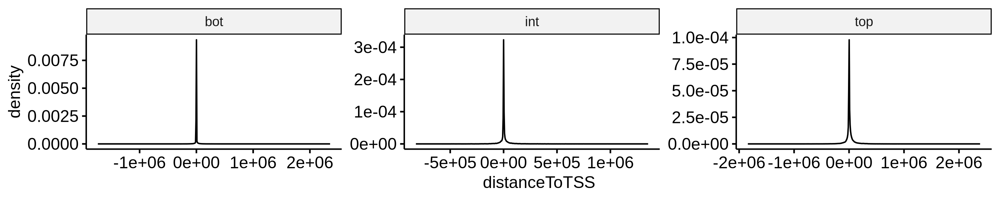

In [240]:
options(repr.plot.width = 10, repr.plot.height = 2, repr.plot.res = 300)
ggdensity(data = probes_ann_dt, x = 'distanceToTSS') + facet_wrap(~ group, scale = 'free')

In [558]:
install.packages('eulerr')

also installing the dependencies ‘GenSA’, ‘polylabelr’




In [241]:
library(eulerr)

Registered S3 method overwritten by 'eulerr':
  method    from  
  plot.venn gplots



,h,k,a,b,phi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Promoter,-15.93052,0.000000e+00,28.97760,28.97760,4.265009
Enhancer,19.88909,3.552714e-15,19.82707,19.82707,4.265009


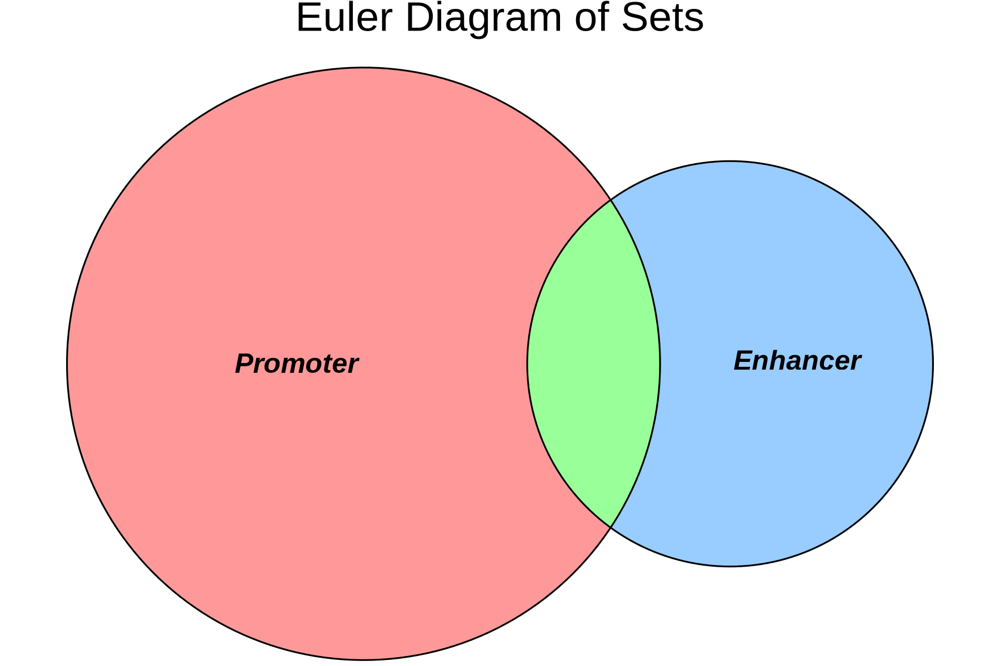

In [581]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
fit = euler(list(Promoter = sel1, Enhancer = sel2))
gg = plot(fit, 
     fills = c("#FF9999", "#99CCFF", "#99FF99"),  # Fill colors for sets
     labels = list(font = 4),                    # Label customization
     main = "Euler Diagram of Sets")             # Add a title
fit
gg
ggsave(gg, filename = '~/WenhuoHu/plot/a.pdf', width = 6, height = 4)

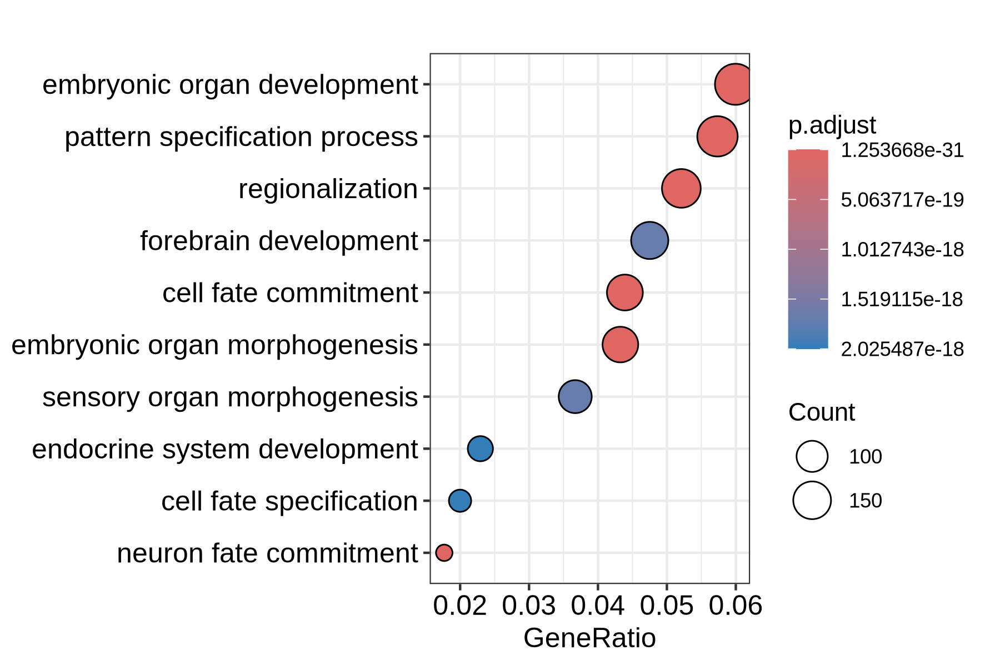

In [579]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
goEnrichment <- enrichGO( gene = c(sel1, sel2),
                         OrgDb = org.Hs.eg.db,  keyType = "SYMBOL", ont = "BP",  pvalueCutoff = 0.05 )

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
dotplot(goEnrichment, showCategory = 10)

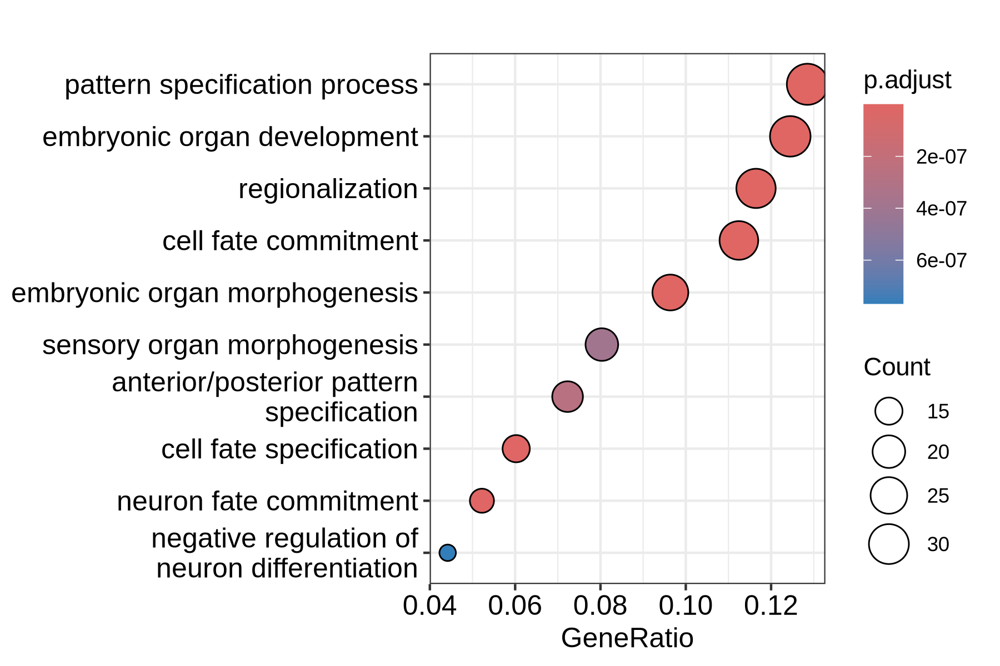

In [580]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
goEnrichment <- enrichGO( gene = intersect(sel1, sel2),
                         OrgDb = org.Hs.eg.db,  keyType = "SYMBOL", ont = "BP",  pvalueCutoff = 0.05 )

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
dotplot(goEnrichment, showCategory = 10)

In [755]:
goEnrichment[grep('hema', goEnrichment$Description), ]
#goEnrichment[grep('fate', goEnrichment$Description), ]

,ID,Description,GeneRatio,BgRatio,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0048534,GO:0048534,hematopoietic or lymphoid organ development,13/1033,102/18986,0.127451,2.342482,3.260984,0.003540453,0.02039,0.01535157,NKX3-2/PITX2/HAND2/NKX2-5/SHH/BARX1/NKX2-3/SIX1/BCL11B/ONECUT1/FOXL1/MAFB/TBX1,13


In [ ]:
gghistogram(probes_ann_dt$distanceToTSS, facet.by = 

In [ ]:
#plotAnnoPie(probes_ann)
#plotAnnoBar(probes_ann)
#plotDistToTSS(probes_ann)

# Perform GO enrichment analysis
goEnrichment <- enrichGO( gene =probes_ann@anno$geneId, 
                         OrgDb = org.Hs.eg.db,  keyType = "ENTREZID", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
dotplot(goEnrichment, showCategory = 10)

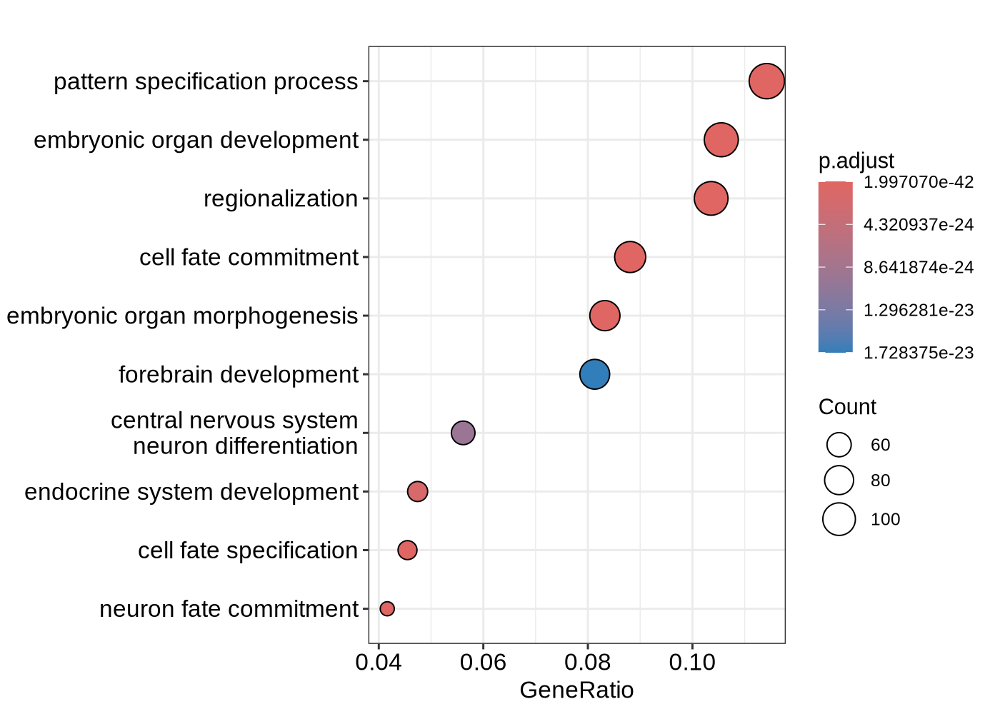

In [531]:
goEnrichment <- enrichGO( gene =probes_ann@anno[abs(probes_ann@anno$distanceToTSS) < 3000,]$geneId, 
                         OrgDb = org.Hs.eg.db,  keyType = "ENTREZID", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
dotplot(goEnrichment, showCategory = 10)


### cross validate with BCAT1 KO in K562 cells

In [596]:
library(UpSetR)

In [582]:
hsa_deg_dt = fread(file = '~/WenhuoHu/collab_Junhua/rnaseq/human/output/deg_dt_genotype.tsv') 
head(hsa_deg_dt) 


rn,.id,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,chr,start,end,strand,updn
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<chr>,<chr>
LOC102724908,KO__WT,5491.416,5.775858,0.1751951,32.96814,2.325567e-238,3.785558e-234,chr19,28606687,28615229,+,up
LOC102724908,DKO__WT,5491.416,5.691842,0.1752001,32.48767,1.592226e-231,2.591826e-227,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1SxxS__WT,5491.416,5.587917,0.1752265,31.88969,3.711288e-223,5.745073e-219,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1K222A__WT,5491.416,5.368348,0.1752416,30.63398,4.319204e-206,6.858464e-202,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1__WT,5491.416,5.168412,0.1752678,29.48866,4.024318e-191,6.550785e-187,chr19,28606687,28615229,+,up
LOC102724908,DKO_B1M__WT,5491.416,5.013759,0.1753017,28.60074,6.577697e-180,9.920482e-176,chr19,28606687,28615229,+,up


In [782]:
intersect(sel1, bcat1_KO_dn)
intersect(sel1, bcat1_KO_up)


[1] "SAMD11"        "KLHL17"        "PLEKHN1"       "VWA1"          "MIB2"          "PRKCZ"         "ARHGEF16"      "HES2"          "PLEKHG5"       "GPR157"        "H6PD"         
  [12] "FBLIM1"        "IFFO2"         "NBL1"          "CAMK2N1"       "RAP1GAP"       "ID3"           "MAN1C1"        "PAQR7"         "UBXN11"        "SYTL1"         "FAM229A"      
  [23] "FNDC5"         "TMEM54"        "EVA1B"         "MRPS15"        "BMP8B"         "KCNQ4"         "CITED4"        "DMBX1"         "GNG12"         "F3"            "S1PR1"        
  [34] "STXBP3"        "WDR47"         "PSRC1"         "SORT1"         "CYB561D1"      "AMPD2"         "GSTM3"         "AHCYL1"        "RAP1A"         "RHOC"          "ATP1A1"       
  [45] "PTGFRN"        "TRIM45"        "TBX15"         "POLR3GL"       "PLEKHO1"       "ADAMTSL4"      "SEMA6C"        "S100A13"       "SLC27A3"       "TPM3"          "ADAM15"       
  [56] "EFNA3"         "EFNA1"         "SSR2"          "TMEM79"        "PEA15"         "VANGL2"        "F11R"          "NDUFS2"        "MPZL1"         "ATP1B1"        "KIAA0040"     
  [67] "RALGPS2"       "QSOX1"         "ACBD6"         "IER5"          "SWT1"          "KIF21B"        "CSRP1"         "NAV1"          "ELF3"          "SYT2"          "PPFIA4"       
  [78] "TMCC2"         "BATF3"         "CAPN2"         "EPHX1"         "LEFTY2"        "SNAP47"        "JMJD4"         "OBSCN"         "LINC01132"     "GNG4"          "RYR2"         
  [89] "SMYD3"         "SCCPDH"        "ZNF670-ZNF695" "ZNF692"        "ADI1"          "COLEC11"       "ASAP2"         "PDIA6"         "GREB1"         "SDC1"          "HS1BP3"       
 [100] "DNMT3A"        "MAPRE3"        "SLC30A3"       "GPN1"          "MRPL33"        "FEZ2"          "CDC42EP3"      "PKDCC"         "ZFP36L2"       "THADA"         "EPAS1"        
 [111] "EPCAM"         "ASB3"          "MTIF2"         "EFEMP1"        "BCL11A"        "LGALSL"        "ARHGAP25"      "DYSF"          "FBXO41"        "HK2"           "TMSB10"       
 [122] "CAPG"          "RNF181"        "MERTK"         "DBI"           "RALB"          "GYPC"          "ERMN"          "TANC1"         "CD302"         "SCN9A"         "PDK1"         
 [133] "SP9"           "WIPF1"         "HOXD4"         "DNAJC10"       "FAM171B"       "HECW2"         "FAM117B"       "ZDBF2"         "TMBIM1"        "DNPEP"         "DES"          
 [144] "SPEG"          "GMPPA"         "CHPF"          "EPHA4"         "PAX3"          "AP1S3"         "IRS1"          "FBXO36"        "SP100"         "CAB39"         "EFHD1"        
 [155] "GBX2"          "RAMP1"         "UBE2F"         "KLHL30"        "HES6"          "RNPEPL1"       "KIF1A"         "BOK"           "PDCD1"         "CRBN"          "OGG1"         
 [166] "TTLL3"         "VGLL4"         "RPL32"         "UBE2E1"        "TGFBR2"        "OSBPL10"       "GPD1L"         "CMTM8"         "CMTM7"         "CRTAP"         "PLCD1"        
 [177] "CSRNP1"        "SLC25A38"      "ENTPD3"        "CTNNB1"        "ULK4"          "VIPR1"         "ZBTB47"        "ANO10"         "TMEM158"       "ALS2CL"        "CCDC12"       
 [188] "SCAP"          "CSPG5"         "DALRD3"        "LAMB2P1"       "AMT"           "APEH"          "CAMKV"         "SEMA3F"        "SEMA3B"        "ZMYND10"       "NPRL2"        
 [199] "CACNA2D2"      "C3orf18"       "HEMK1"         "CISH"          "MAPKAPK3"      "ABHD14B"       "RPL29"         "POC1A"         "PPM1M"         "TKT"           "IL17RB"       
 [210] "ARHGEF3"       "HESX1"         "PXK"           "LRIG1"         "FRMD4B"        "EIF4E3"        "VGLL3"         "CCDC80"        "IGSF11"        "MYLK"          "KALRN"        
 [221] "KLF15"         "CHCHD6"        "RPN1"          "COPG1"         "HMCES"         "ZIC1"          "GYG1"          "ARHGEF26"      "PLCH1"         "LINC00881"     "LINC00880"    
 [232] "SHOX2"         "B3GALNT1"      "SERPINI1"      "RPL22L1"       "KLHL24"        "PARL"          "AP2M1"         "FAM131A"       "THPO"          "CHRD"   

[1] "C1orf159"     "DVL1"         "ATAD3B"       "ATAD3A"       "NADK"         "GNB1"         "SKI"          "DFFB"         "NPHP4"        "KCNAB2"       "ZBTB48"       "PHF13"       
 [13] "DNAJC11"      "RERE"         "CLSTN1"       "DFFA"         "UBIAD1"       "TNFRSF1B"     "PRDM2"        "KAZN"         "ARHGEF19"     "FBXO42"       "SZRD1"        "RCC2"        
 [25] "ACTL8"        "ALDH4A1"      "UBR4"         "NIPAL3"       "CLIC4"        "CEP85"        "HMGN2"        "RPS6KA1"      "ARID1A"       "ZDHHC18"      "GPATCH3"      "SLC9A1"      
 [37] "GPR3"         "WASF2"        "AHDC1"        "IFI6"         "RCC1"         "TRNAU1AP"     "GMEB1"        "MATN1-AS1"    "LAPTM5"       "SDC3"         "TMEM39B"      "TXLNA"       
 [49] "RNF19B"       "PHC2"         "ZMYM6"        "AGO1"         "MAP7D1"       "STK40"        "SNIP1"        "SF3A3"        "FHL3"         "RRAGC"        "PABPC4"       "RLF"         
 [61] "CTPS1"        "SCMH1"        "SZT2"         "DPH2"         "SLC6A9"       "ERI3"         "KIF2C"        "PIK3R3"       "RAD54L"       "LRRC41"       "NSUN4"        "EFCAB14"     
 [73] "FOXD2"        "ZYG11A"       "SSBP3"        "MYSM1"        "NFIA"         "DNAJC6"       "DIRAS3"       "FUBP1"        "BCL10"        "ODF2L"        "PKN2"         "ZNF644"      
 [85] "CDC7"         "RPL5"         "AGL"          "PRMT6"        "GSTM2"        "CD53"         "MTMR11"       "VPS45"        "CERS2"        "THEM4"        "S100A6"       "UBAP2L"      
 [97] "CLK2"         "ARHGEF2"      "PEAR1"        "USP21"        "FCGR3A"       "DDR2"         "POU2F1"       "IPO9"         "PLXNA2"       "G0S2"         "C1orf74"      "ANGEL2"      
[109] "CENPF"        "TP53BP2"      "LBR"          "TMEM63A"      "RAB4A"        "TAF5L"        "URB2"         "TRIM67"       "LGALS8"       "DESI2"        "ID2"          "KLF11"       
[121] "RRM2"         "ODC1"         "E2F6"         "LPIN1"        "RHOB"         "ATAD2B"       "NCOA1"        "RAB10"        "CCDC88A"      "PELI1"        "SPRED2"       "SFXN5"       
[133] "TET3"         "LBX2-AS1"     "TMEM127"      "DDX18"        "EN1"          "TFCP2L1"      "ZEB2"         "ACVR2A"       "NEB"          "GPD2"         "GALNT5"       "PKP4"        
[145] "DLX1"         "DLX2"         "SP3"          "PDE11A"       "SATB2"        "INO80D"       "TNS1"         "ZNF142"       "NHEJ1"        "CNPPD1"       "AGFG1"        "INPP5D"      
[157] "AGAP1"        "COL6A3"       "FARP2"        "OXTR"         "BRPF1"        "IL17RC"       "SLC6A6"       "CCR4"         "EXOG"         "ZNF620"       "KRBOX1"       "ZNF445"      
[169] "CDC25A"       "WDR6"         "LAMB2"        "TCTA"         "AMIGO3"       "MON1A"        "ALAS1"        "WDR82"        "SFMBT1"       "KCTD6"        "MAGI1"        "ROBO2"       
[181] "ZNF148"       "TPRA1"        "TOPBP1"       "KCNMB3"       "EIF2B5"       "EIF4G1"       "LSG1"         "XXYLT1"       "ACAP2"        "PCYT1A"       "PAK2"         "DLG1"        
[193] "ZNF718"       "PIGG"         "PCGF3"        "MAEA"         "FGFR3"        "LETM1"        "RNF4"         "TADA2B"       "AFAP1-AS1"    "WDR1"         "ZNF518B"      "LINC01097"   
[205] "CC2D2A"       "RBPJ"         "STIM2"        "UBE2K"        "PDS5A"        "TMEM33"       "TEC"          "SLC10A4"      "DCUN1D4"      "FIP1L1"       "YTHDC1"       "ANXA3"       
[217] "RASGEF1B"     "COQ2"         "NAP1L5"       "DAPP1"        "UBE2D3"       "FGF2"         "JADE1"        "ELF2"         "GAB1"         "DCHS2"        "TRIM61"       "HMGB2"       
[229] "HAND2"        "CEP44"        "GLRA3"        "MTNR1A"       "FAT1"         "SLC6A19"      "DAP"          "ZFR"          "NNT-AS1"      "IPO11"        "ZFYVE16"      "RFESD"       
[241] "APC"          "LMNB1"        "SHROOM1"      "JADE2"        "PITX1"        "KDM3B"        "CXXC5"        "FCHSD1"       "ARAP3"        "PCDH12"       "GNPDA1"       "RBM27"       
[253] "ABLIM3"       "PPARGC1B"     "NDST1"        "ZNF300"       "ZNF300P1"     "LARP1"        

,h,k,a,b,phi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Promoter,-5.654565,-16.59696,19.82707,19.82707,3.637971
bcat1_KO_dn,40.153499,-16.59696,34.95244,34.95244,3.637971
bcat1_KO_up,-40.560592,16.81744,34.48948,34.48948,3.637971


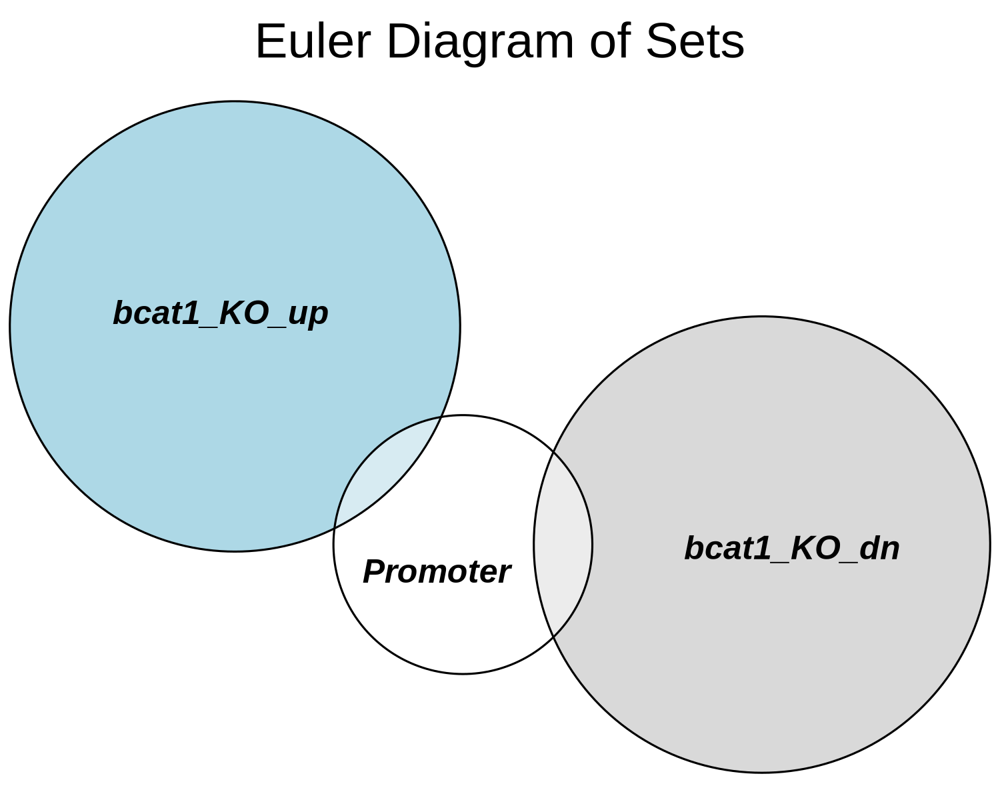

In [784]:
sel1 = unique(probes_ann_dt[group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
bcat1_KO_dn = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'dn', rn] 
bcat1_KO_up = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'up', rn]
fit = euler(list(Promoter = sel2, bcat1_KO_dn = bcat1_KO_dn, bcat1_KO_up = bcat1_KO_up))
gg = plot(fit,  labels = list(font = 4), main = "Euler Diagram of Sets") 
fit
gg
ggsave(gg, filename = '~/WenhuoHu/plot/a.pdf', width = 6, height = 4)


In [785]:
intersect(bcat1_KO_dn, sel2)
intersect(bcat1_KO_up, sel2)


[1] "BAIAP3"    "DLX4"      "PPIC"      "MAST1"     "MATK"      "DYSF"      "DES"       "ARHGEF1"   "KLF13"     "COBL"      "CACNA1I"   "TFAP2A"    "RGS20"     "GNAL"      "KIF1A"    
 [16] "CERS1"     "LMF1"      "CACNA1H"   "CPZ"       "CAB39"     "NXPH4"     "MNX1-AS1"  "ASIC3"     "SLC4A11"   "GAL"       "TBX15"     "NKX2-2"    "CYP26A1"   "SHISA8"    "MPP2"     
 [31] "ZIC1"      "CSPG5"     "TBX1"      "RABAC1"    "TMEM158"   "LHX1"      "TUBB6"     "CORO6"     "TLE2"      "DMBX1"     "WNT10B"    "CMTM8"     "VRK1"      "RAB2A"     "WIPI2"    
 [46] "FOSB"      "PAX6"      "GYPC"      "BEGAIN"    "RPA1"      "HES2"      "TBX3"      "NPW"       "NR2F1"     "VANGL2"    "NPTXR"     "SOX8"      "RASGEF1A"  "FAM83A"    "PRRT1"    
 [61] "S1PR5"     "MUC4"      "LINC00261" "CDHR1"     "C3"        "TSPAN4"    "FLT4"      "GADD45B"   "PTGDS"     "ACSL6"     "RGS10"     "SCRIB"     "CDKN3"     "PAPLN"     "RASGRP2"  
 [76] "MRPL23"    "LINC00963" "SEMA3F"    "SPRED3"    "GBX2"      "ZNF395"    "YPEL4"     "BNIP3L"    "GMPPA"     "SSR1"      "KDELR1"    "HOXD4"     "ADAM11"    "OLIG2"     "NDUFS6"   
 [91] "CRIP2"     "CELF5"     "TSLP"      "KAZALD1"   "DCTN3"     "BTF3"      "ARHGEF16"  "CCDC154"   "MNX1"      "OBSCN"     "NEURL1"    "ALX1"      "PNMT"      "HS3ST3B1"  "PDIA2"    
[106] "GRIN2C"    "PAX3"      "MYH6"      "GRTP1"     "JPH3"      "PLEKHG5"   "FXYD6"     "SOX21"     "SIX1"      "ADAP1"     "EMC10"     "COL9A3"    "OSR2"      "TSPAN9"    "SMARCD3"  
[121] "LHX5"      "FOXA2"     "IL11"      "ELFN1"     "PPP1R11"   "PPFIA4"    "LGI2"      "ZIC5"      "SHMT2"     "SYT2"      "RTN4RL1"   "ZDBF2"     "PIP5KL1"   "COL18A1"   "GATA4"    
[136] "CHP2"      "WNT11"     "GNG4"      "CLEC2L"    "DMTN"      "FAM86EP"   "SP6"       "ADAMTS7"   "IER5"      "UBE2F"     "RAP1GAP"   "CD7"       "SHOX2"     "EGFL7"     "CALCOCO1" 
[151] "TCF7"      "SP9"       "KIRREL2"   "OLFM2"     "NEUROG2"   "SLC22A17"  "AATK"      "ATP8B3"    "CYP27B1"   "PLEKHN1"   "SGCZ"      "RTN4RL2"   "ACSF3"     "TMEM74B"   "DLK2"     
[166] "EXD3"      "CYTH4"     "PTH2"      "GJA3"      "FAM53A"    "PLK5"      "DOC2A"     "ARX"       "SEMA3B"

[1] "NR2F2"     "GNAS"      "NCOA5"     "BCORL1"    "STAT5A"    "PLP2"      "HAND2"     "SOX6"      "MAGI1"     "VSIG10L"   "OSBPL5"    "DLX1"      "SCAND3"    "AACS"      "ZNF718"   
[16] "LINGO1"    "CBFA2T3"   "MOCS1"     "DNAJB6"    "ALDH1A2"   "ZBTB46"    "TMEM33"    "DLX2"      "TNXB"      "UPF1"      "C19orf25"  "KISS1R"    "AKT1"      "DGKZ"      "SDC3"     
[31] "TP53INP2"  "DVL1"      "SLC17A7"   "SIGIRR"    "ACTR3B"    "FOXP4"     "SYT10"     "HMX3"      "SMPD3"     "DCHS2"     "ZBED4"     "EN1"       "FOXA1"     "ATP9A"     "TRIM67"   
[46] "TPRA1"     "CHRNB1"    "ANK1"      "CUX1"      "GRIN2D"    "EIF5"      "NFIC"      "KCNC3"     "UTF1"      "TBX18"     "COL9A1"    "ALX4"      "GRIN1"     "PPM1N"     "ADAMTSL5" 
[61] "ATG9B"     "TRIM15"    "AGPAT2"    "SLC6A19"   "PCP2"      "TCF3"      "KIFC3"     "KCTD15"    "ASCL2"     "GRID1"     "NKAP"      "FOXD2"     "FGF11"     "VPS13C"    "LMTK3"    
[76] "KCTD17"    "LAPTM5"    "DLEU2"     "EXOC3L4"   "WT1"       "N4BP1"     "LINC00239" "FGFR3"     "GNAS-AS1"  "EBF1"      "MGAT5B"    "LINC01097" "PDGFB"     "THBD"      "TRIM10"   
[91] "NTSR1"     "ACHE"      "DENND5A"   "HOXC4"     "RASGEF1C"  "NOM1"

In [ ]:
UTF1 TCF3 SOX6 STAT5A FOXP4 WT1 ATK1 ALDH1A2 FOXA1 HOXC4 NOM1 HAND2 ZBTB46 GRID1 DVL1 EBF1 

,h,k,a,b,phi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Promoter,-14.274394,-0.8331051,28.85476,28.85476,0.5540626
Enhancer,22.052182,-0.8331051,19.70866,19.70866,0.5540626
bcat1_KO_dn,5.342272,-43.5828525,34.92627,34.92627,0.5540626
bcat1_KO_up,2.703889,43.8402469,34.43706,34.43706,0.5540626


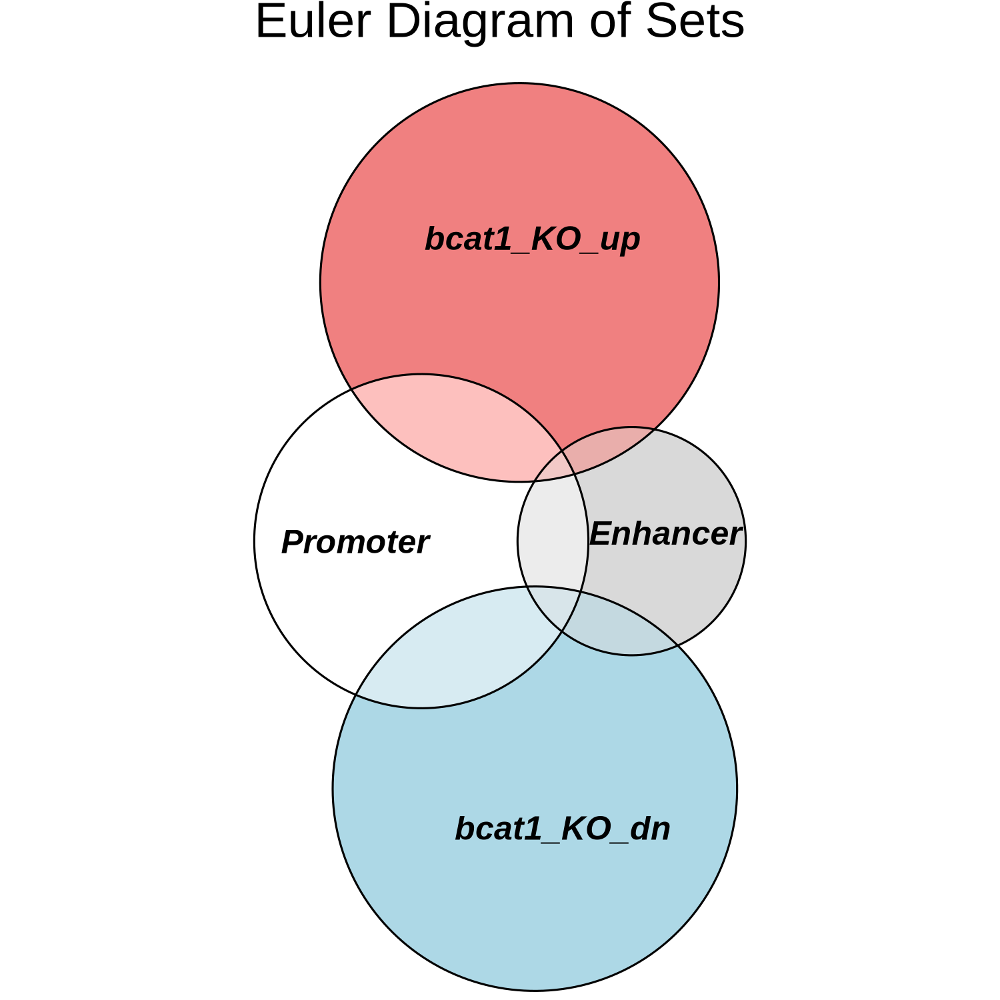

In [759]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
fit = euler(list(Promoter = sel1, Enhancer = sel2,
                 bcat1_KO_dn = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'dn', rn], 
                 bcat1_KO_up = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'up', rn]
           ))
gg = plot(fit, 
     labels = list(font = 4),                    # Label customization
     main = "Euler Diagram of Sets")             # Add a title
fit
gg
ggsave(gg, filename = '~/WenhuoHu/plot/a.pdf', width = 6, height = 4)


In [585]:
length(gene_sel)

[1] 2452

In [590]:
gene_sel = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 1 & padj < 0.05 & updn == 'dn', rn]
length(intersect(gene_sel, sel1))
length(intersect(gene_sel, sel2))

[1] 213

[1] 121

In [629]:
list_to_df_fun <- function(sets, weight = T) {
    # Combine all unique elements across sets
    all_elements <- unique(unlist(sets))

    # Remove any NA values from the elements
    all_elements <- all_elements[!is.na(all_elements)]

    # Create a binary membership matrix
    membership <- sapply(sets, function(x) all_elements %in% x)

    # Convert to data frame
    membership_df <- as.data.frame(membership)

    # Set row names as the unique elements
    if(weight == T){
        membership_df <- as.data.frame(lapply(membership_df, function(col) as.numeric(col)))
    }
    rownames(membership_df) <- all_elements

   return(membership_df)
}


pdf 
  2

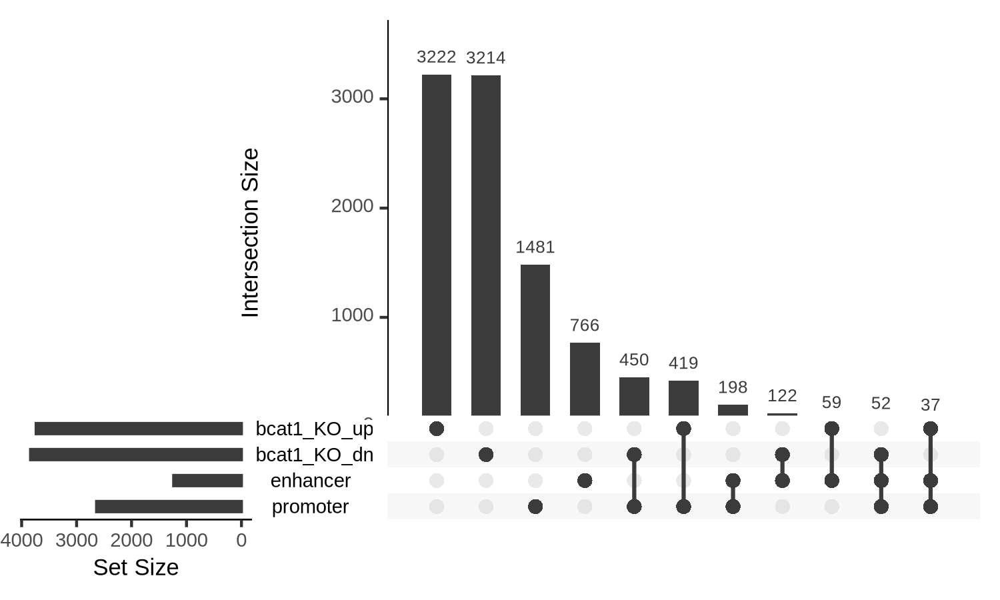

In [760]:
upset_list = list(promoter = sel1, 
                  enhancer = sel2, 
                  bcat1_KO_dn = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'dn', rn], 
                  bcat1_KO_up = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'up', rn]) 
upset_df = list_to_df_fun(upset_list)
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
gg = upset(upset_df, sets = colnames(upset_df), keep.order = T)
gg
pdf(file = '~/WenhuoHu/plot/a.pdf', width = 5, height = 3)
gg
dev.off()


pdf 
  2

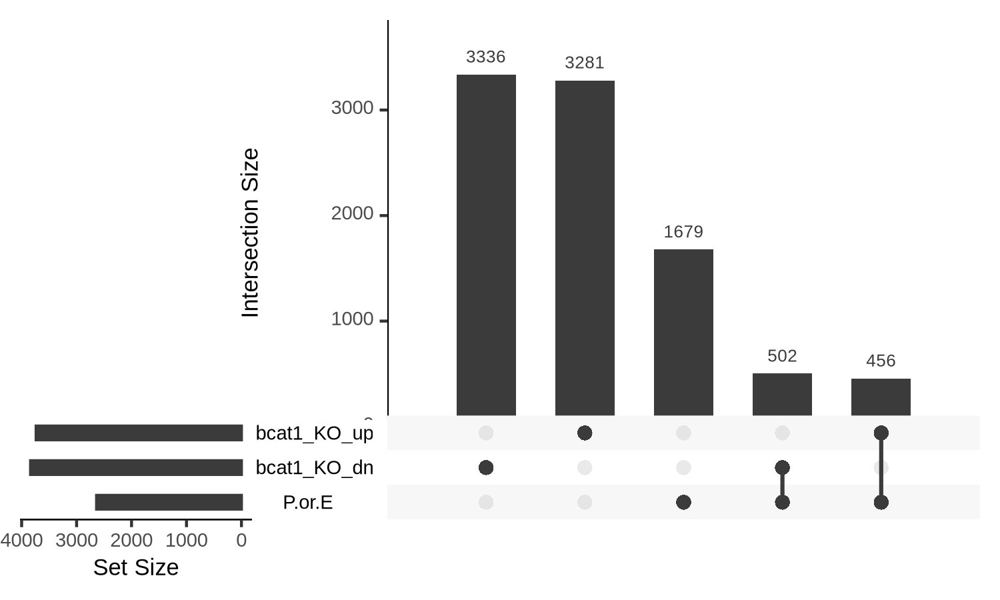

In [764]:
upset_list = list('P or E'= unique(sel1, sel2),
                  bcat1_KO_dn = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'dn', rn], 
                  bcat1_KO_up = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 0 & padj < 0.05 & updn == 'up', rn]) 
upset_df = list_to_df_fun(upset_list)
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
gg = upset(upset_df, sets = colnames(upset_df), keep.order = T)
gg
pdf(file = '~/WenhuoHu/plot/a.pdf', width = 5, height = 3)
gg
dev.off()


pdf 
  2

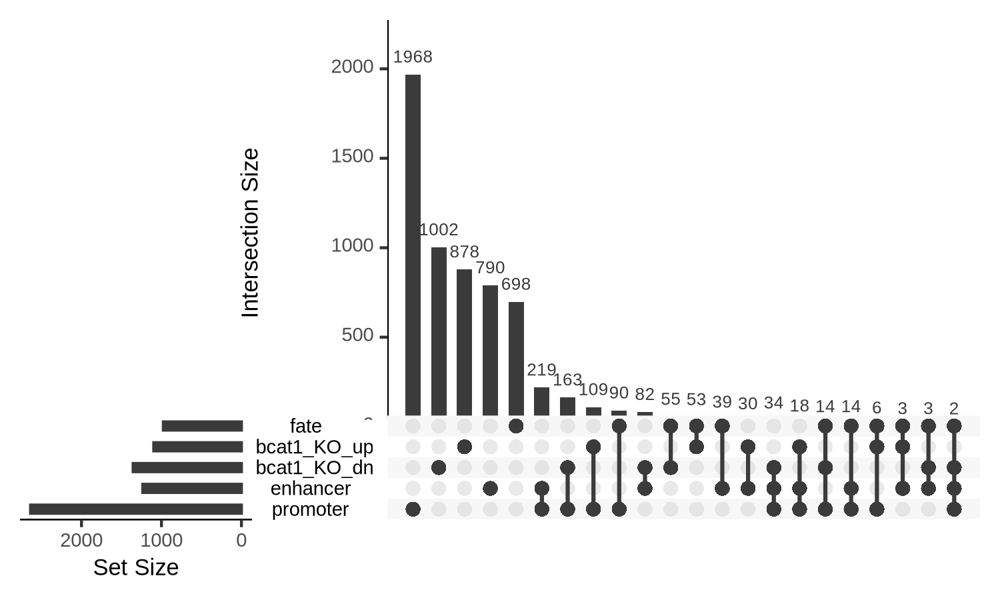

In [717]:
upset_list = list(promoter = sel1, 
                  enhancer = sel2, 
                  bcat1_KO_dn = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 1 & padj < 0.05 & updn == 'dn', rn], 
                  bcat1_KO_up = hsa_deg_dt[.id == 'KO__WT' & abs(log2FoldChange) > 1 & padj < 0.05 & updn == 'up', rn],
                 fate = go_dt$SYMBOL) 
upset_df = list_to_df_fun(upset_list)
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 300)
gg = upset(upset_df, sets = colnames(upset_df), keep.order = T)
gg
pdf(file = '~/WenhuoHu/plot/a.pdf', width = 5, height = 3)
gg
dev.off()


In [656]:
head(upset_df)

,promoter,enhancer,bcat1_KO_dn,bcat1_KO_up
,<dbl>,<dbl>,<dbl>,<dbl>
SAMD11,1,0,1,0
KLHL17,1,0,0,0
MIR200B,1,0,0,0
CPTP,1,0,0,0
AURKAIP1,1,0,0,0
TMEM88B,1,0,0,0


In [657]:
saveRDS(upset_df, file = '~/a.rds')

In [654]:
gene_sel = rownames(upset_df[upset_df$bcat1_KO_up == 1 & (upset_df$enhancer == 1 | upset_df$promoter == 1), ])
length(gene_sel)
gene_sel

[1] 166

[1] "ATAD3B"     "SKI"        "KAZN"       "GPR3"       "DIRAS3"     "ODF2L"      "ZNF644"     "PRMT6"      "GSTM2"      "MTMR11"     "PLXNA2"     "G0S2"       "TRIM67"     "EN1"       
 [15] "TFCP2L1"    "GALNT5"     "TNS1"       "KRBOX1"     "LAMB2"      "AMIGO3"     "MAGI1"      "ROBO2"      "KCNMB3"     "ZNF518B"    "CC2D2A"     "TEC"        "ANXA3"      "NAP1L5"    
 [29] "GAB1"       "TRIM61"     "MTNR1A"     "FAT1"       "PPARGC1B"   "ZNF300"     "ZNF300P1"   "EBF1"       "SCAND3"     "TRIM15"     "TRIM26"     "HLA-C"      "ZBTB12"     "TNXB"      
 [43] "PSMB8"      "TRAM2"      "COL9A1"     "PLAGL1"     "TYW1B"      "PEG10"      "MBLAC1"     "MEPCE"      "NYAP1"      "SLC12A9"    "FLNC"       "MEST"       "PAXIP1-AS2" "LYNX1"     
 [57] "CNTNAP3B"   "GRIN1"      "AKR1E2"     "LRRC37A6P"  "LINC00839"  "ZNF32"      "UTF1"       "VENTX"      "LRRC56"     "ASCL2"      "KCNQ1OT1"   "LMO2"       "CD82"       "CREB3L1"   
 [71] "CCDC87"     "PIWIL4"     "BIRC3"      "ROBO3"      "PTPN6"      "APOLD1"     "SYT10"      "HOXC4"      "GAS2L3"     "RILPL2"     "PRKD1"      "FOXA1"      "C14orf39"   "GALC"      
 [85] "PTPN21"     "TNFAIP2"    "GABRB3"     "GABRG3"     "DISP2"      "NR2F2"      "LINC00923"  "CREBBP"     "TGFB1I1"    "CCL2"       "PIEZO2"     "UHRF1"      "ZNF560"     "ACP5"      
 [99] "F2RL3"      "ZNF573"     "DLL3"       "PVR"        "ZNF331"     "NCR1"       "ZIK1"       "ZNF418"     "PLAGL2"     "DNMT3B"     "PHF20"      "SRC"        "ZHX3"       "LPIN3"     
[113] "L3MBTL1"    "ATP9A"      "GNAS-AS1"   "TAF4"       "SS18L1"     "DNAJC5"     "TUBA3FP"    "GUSBP11"    "NEFH"       "SEC14L6"    "SERHL"      "PCSK1N"     "MAGIX"      "IQSEC2"    
[127] "ARMCX1"     "DOCK11"     "BCORL1"     "AFF2"       "GABRE"      "GABRQ"      "FLNA"       "DLX1"       "DLX2"       "ZNF718"     "LINC01097"  "DCHS2"      "HAND2"      "SLC6A19"   
[141] "RASGEF1C"   "TRIM10"     "MOCS1"      "ATG9B"      "GRID1"      "OSBPL5"     "SOX6"       "ALX4"       "AACS"       "LINC00239"  "ALDH1A2"    "LINGO1"     "SMPD3"      "CBFA2T3"   
[155] "MGAT5B"     "KISS1R"     "C19orf25"   "PCP2"       "SLC17A7"    "VSIG10L"    "TP53INP2"   "NCOA5"      "NTSR1"      "ZBTB46"     "KCTD17"     "PDGFB"

In [757]:
gene_sel

[1] "ATAD3B"     "SKI"        "KAZN"       "GPR3"       "DIRAS3"     "ODF2L"      "ZNF644"     "PRMT6"      "GSTM2"      "MTMR11"     "PLXNA2"     "G0S2"       "TRIM67"     "EN1"       
 [15] "TFCP2L1"    "GALNT5"     "TNS1"       "KRBOX1"     "LAMB2"      "AMIGO3"     "MAGI1"      "ROBO2"      "KCNMB3"     "ZNF518B"    "CC2D2A"     "TEC"        "ANXA3"      "NAP1L5"    
 [29] "GAB1"       "TRIM61"     "MTNR1A"     "FAT1"       "PPARGC1B"   "ZNF300"     "ZNF300P1"   "EBF1"       "SCAND3"     "TRIM15"     "TRIM26"     "HLA-C"      "ZBTB12"     "TNXB"      
 [43] "PSMB8"      "TRAM2"      "COL9A1"     "PLAGL1"     "TYW1B"      "PEG10"      "MBLAC1"     "MEPCE"      "NYAP1"      "SLC12A9"    "FLNC"       "MEST"       "PAXIP1-AS2" "LYNX1"     
 [57] "CNTNAP3B"   "GRIN1"      "AKR1E2"     "LRRC37A6P"  "LINC00839"  "ZNF32"      "UTF1"       "VENTX"      "LRRC56"     "ASCL2"      "KCNQ1OT1"   "LMO2"       "CD82"       "CREB3L1"   
 [71] "CCDC87"     "PIWIL4"     "BIRC3"      "ROBO3"      "PTPN6"      "APOLD1"     "SYT10"      "HOXC4"      "GAS2L3"     "RILPL2"     "PRKD1"      "FOXA1"      "C14orf39"   "GALC"      
 [85] "PTPN21"     "TNFAIP2"    "GABRB3"     "GABRG3"     "DISP2"      "NR2F2"      "LINC00923"  "CREBBP"     "TGFB1I1"    "CCL2"       "PIEZO2"     "UHRF1"      "ZNF560"     "ACP5"      
 [99] "F2RL3"      "ZNF573"     "DLL3"       "PVR"        "ZNF331"     "NCR1"       "ZIK1"       "ZNF418"     "PLAGL2"     "DNMT3B"     "PHF20"      "SRC"        "ZHX3"       "LPIN3"     
[113] "L3MBTL1"    "ATP9A"      "GNAS-AS1"   "TAF4"       "SS18L1"     "DNAJC5"     "TUBA3FP"    "GUSBP11"    "NEFH"       "SEC14L6"    "SERHL"      "PCSK1N"     "MAGIX"      "IQSEC2"    
[127] "ARMCX1"     "DOCK11"     "BCORL1"     "AFF2"       "GABRE"      "GABRQ"      "FLNA"       "DLX1"       "DLX2"       "ZNF718"     "LINC01097"  "DCHS2"      "HAND2"      "SLC6A19"   
[141] "RASGEF1C"   "TRIM10"     "MOCS1"      "ATG9B"      "GRID1"      "OSBPL5"     "SOX6"       "ALX4"       "AACS"       "LINC00239"  "ALDH1A2"    "LINGO1"     "SMPD3"      "CBFA2T3"   
[155] "MGAT5B"     "KISS1R"     "C19orf25"   "PCP2"       "SLC17A7"    "VSIG10L"    "TP53INP2"   "NCOA5"      "NTSR1"      "ZBTB46"     "KCTD17"     "PDGFB"

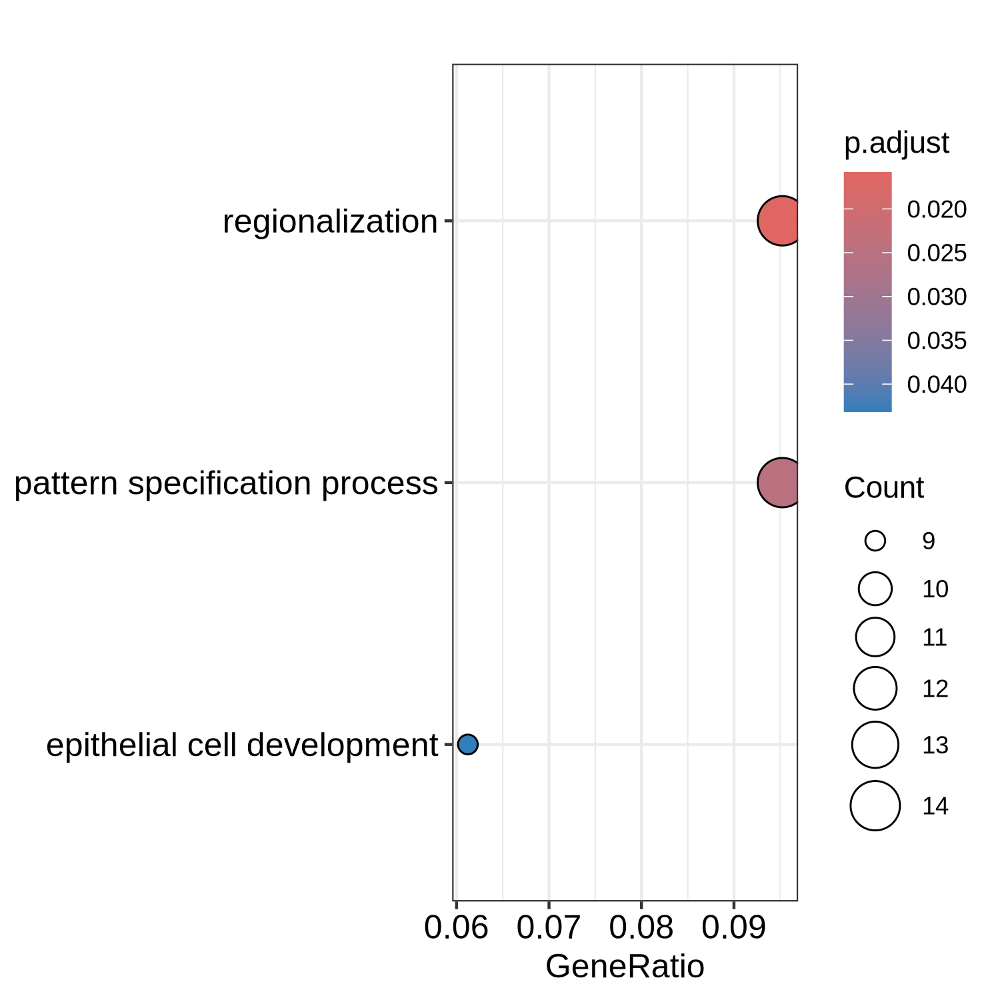

In [758]:
gene_sel = rownames(upset_df[upset_df$bcat1_KO_up == 1 & (upset_df$enhancer == 1 | upset_df$promoter == 1), ])
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)
goEnrichment <- enrichGO( gene = gene_sel,
                         OrgDb = org.Hs.eg.db,  keyType = "SYMBOL", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
dotplot(goEnrichment, showCategory = 10)

# Plot the enrichment results
#dotplot(goEnrichment, showCategory = 10)


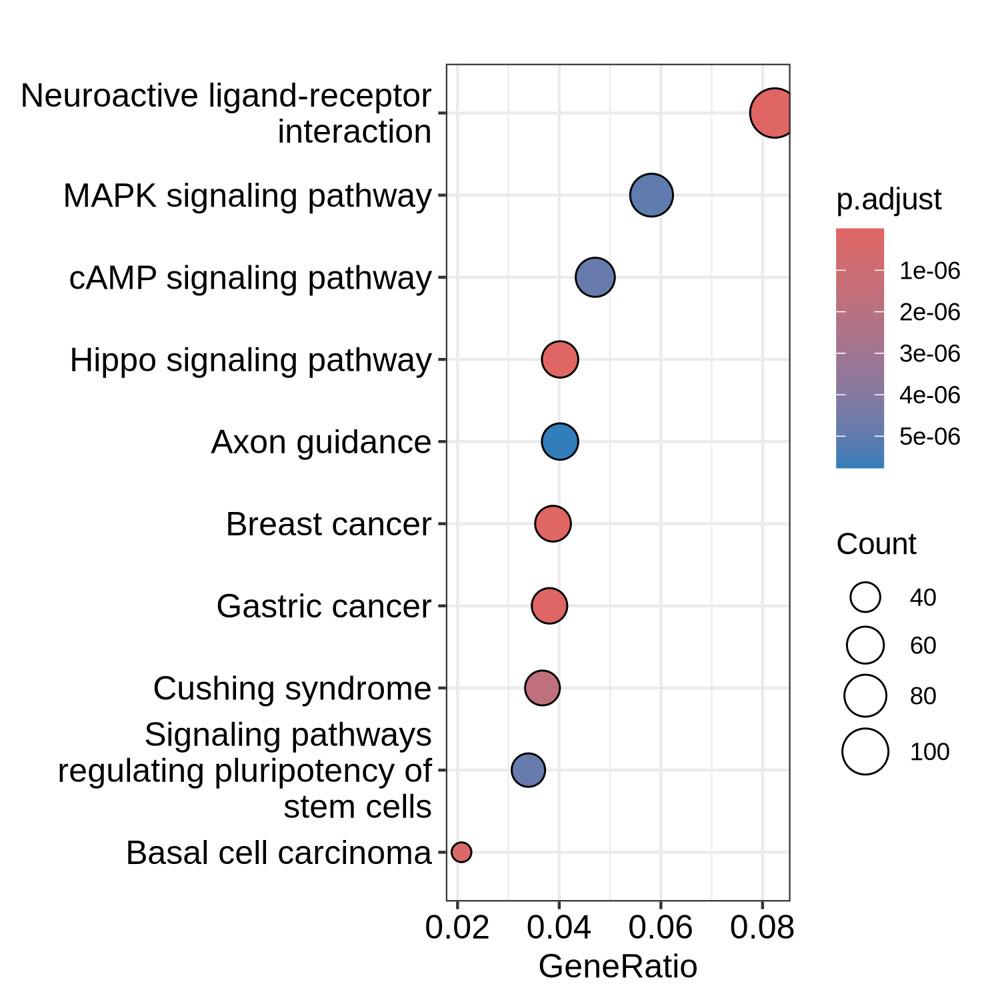

In [708]:
#goEnrichment <- enrichGO( gene = sel2, OrgDb = org.Hs.eg.db,  keyType = "SYMBOL", ont = "BP",  pvalueCutoff = 0.05 )
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', geneId] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', geneId] ) 

go = enrichKEGG(gene = unique(c(sel2, sel1) ))
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)
dotplot(go)

# Plot the enrichment results
#dotplot(goEnrichment, showCategory = 10)


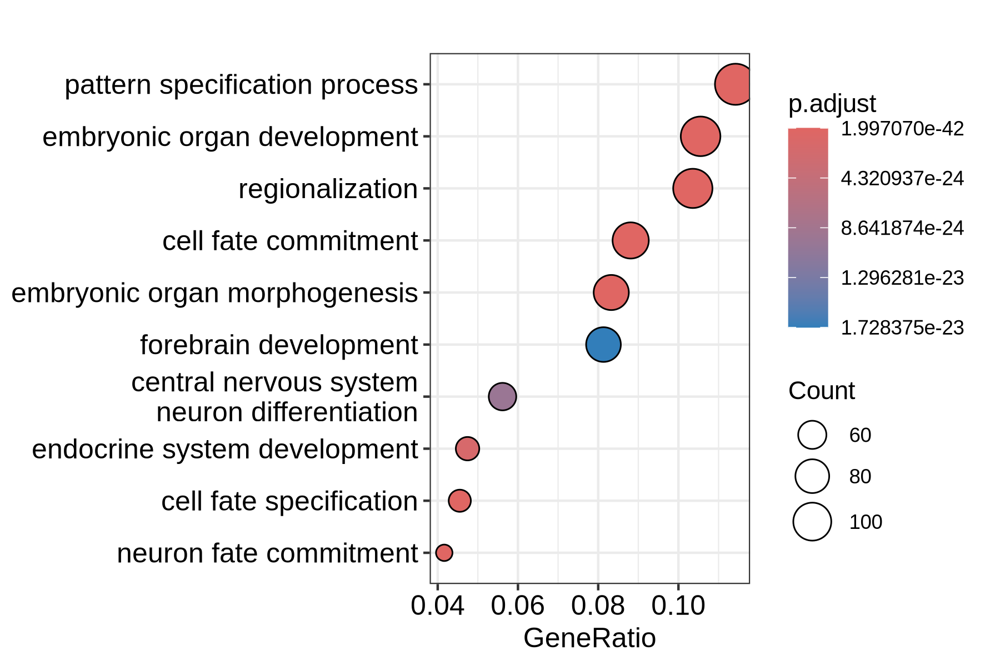

In [712]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 

goEnrichment <- enrichGO( gene = sel2, OrgDb = org.Hs.eg.db,  keyType = "SYMBOL", ont = "BP",  pvalueCutoff = 0.05 )
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
dotplot(goEnrichment)


In [679]:
entrez_genes <- AnnotationDbi::select(
  org.Hs.eg.db,
  keys = 'GO:0045165',
  keytype = "GO",
  columns = c("ENTREZID")
)

# Convert Entrez IDs to gene symbols
gene_symbols <- AnnotationDbi::select(
  org.Hs.eg.db,
  keys = unique(entrez_genes$ENTREZID),
  keytype = "ENTREZID",
  columns = c("SYMBOL")
)

length(gene_symbols$SYMBOL)


'select()' returned 1:many mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



[1] 55

In [692]:
dim(go_dt)
head(go_dt)

'select()' returned 1:many mapping between keys and columns



[1] 297   4

GOALL,EVIDENCEALL,ONTOLOGYALL,SYMBOL
<chr>,<chr>,<chr>,<chr>
GO:0045165,IMP,BP,ACVR1
GO:0045165,NAS,BP,JAG1
GO:0045165,IBA,BP,APC
GO:0045165,IEA,BP,RHOA
GO:0045165,IEA,BP,ASCL1
GO:0045165,IBA,BP,ATOH1


In [701]:
head(go_dt)

,GOALL,EVIDENCEALL,ONTOLOGYALL,SYMBOL
,<chr>,<chr>,<chr>,<chr>
1,GO:0071837,IEA,MF,DLX5
2,GO:0071837,IEA,MF,EGR2
3,GO:0071837,IPI,MF,GATA3
4,GO:0071837,IEA,MF,HOXA3
5,GO:0071837,IEA,MF,HOXC4
6,GO:0071837,IEA,MF,MEOX1


In [700]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
go_dt = bitr("GO:0071837", fromType="GOALL", toType="SYMBOL", OrgDb='org.Hs.eg.db') 


'select()' returned 1:many mapping between keys and columns



'select()' returned 1:many mapping between keys and columns



,h,k,a,b,phi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Promoter,-18.31418,0,28.97760,28.97760,1.784831
cellFate,20.72342,0,17.63487,17.63487,1.784831


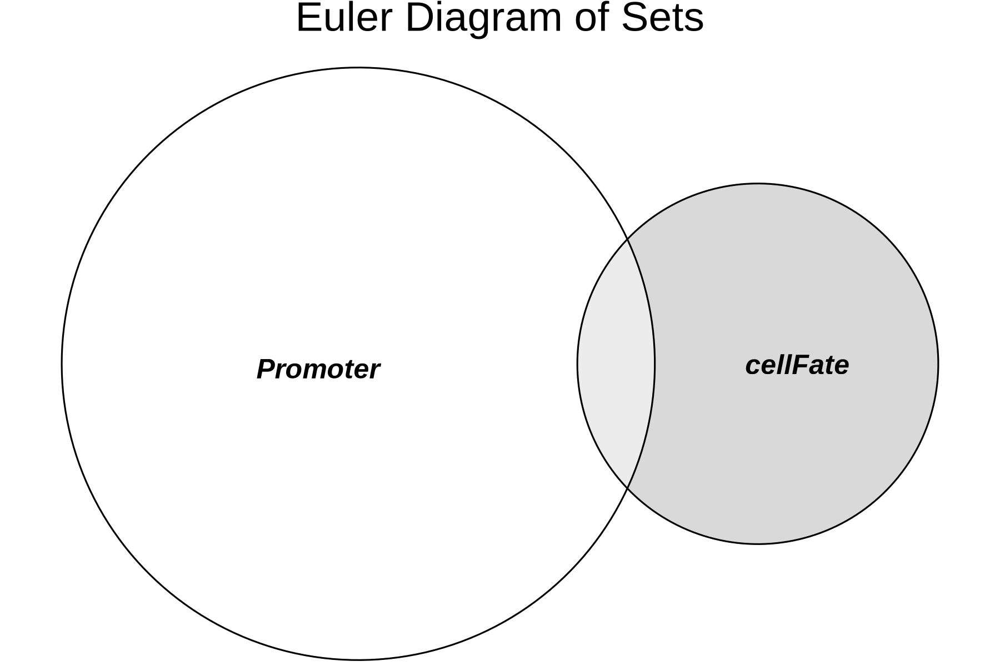

In [713]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
go_dt = bitr("GO:0034097", fromType="GOALL", toType="SYMBOL", OrgDb='org.Hs.eg.db') 
go_dt = as.data.table(go_dt)
go_dt = go_dt[!duplicated(SYMBOL), ]
fit = euler(list(Promoter = unique(sel1, sel2), cellFate = go_dt$SYMBOL)) 
gg = plot(fit, 
     labels = list(font = 4),                    # Label customization
     main = "Euler Diagram of Sets")             # Add a title
fit
gg
ggsave(gg, filename = '~/WenhuoHu/plot/a.pdf', width = 6, height = 4)

In [716]:
intersect(go_dt$SYMBOL, c(sel1, sel2))

[1] "ACP5"     "AKT1"     "ALAD"     "ALPL"     "BIRC3"    "AQP4"     "BBS2"     "CXCR5"    "ZFP36L1"  "CALCA"    "CAPN2"    "CD4"      "CD14"     "CD47"     "CDK4"     "CMKLR1"  
 [17] "CNTFR"    "COMT"     "CYP1B1"   "CYP27B1"  "DDOST"    "GSDME"    "DOK1"     "DPYSL3"   "DTX1"     "DUSP1"    "EDN2"     "ENDOG"    "ETV3"     "F3"       "FOXF1"    "FOXC1"   
 [33] "NR5A2"    "GAPDH"    "GATA3"    "CCR10"    "GPS2"     "HCK"      "HK2"      "FOXA2"    "HES1"     "HSPA1B"   "IL11"     "IL13"     "INHBB"    "PDX1"     "IRAK2"    "IRF7"    
 [49] "IRS1"     "JAK2"     "KRT8"     "AFF3"     "LSP1"     "SMAD7"    "MT2A"     "MYO1C"    "MYOD1"    "NCL"      "NEFH"     "NFATC1"   "NFKBIA"   "NKX6-1"   "NOS2"     "PAFAH1B1"
 [65] "PAX6"     "PCSK1"    "PDE2A"    "PDE1B"    "PDGFB"    "PFKP"     "PLP2"     "POU4F1"   "POU4F2"   "PPP2CB"   "MAPK1"    "MAP2K5"   "PTGS2"    "PTPN6"    "PTPRJ"    "UPF1"    
 [81] "CCL2"     "CX3CL1"   "SHMT2"    "SLIT3"    "SOX1"     "SOX9"     "SPP1"     "SRC"      "SRM"      "SSTR1"    "STAT5A"   "STAT6"    "TCF7"     "TIMP2"    "TIMP3"    "TIMP4"   
 [97] "TRAF1"    "TRAF2"    "TRAF3"    "TRAF5"    "SCGB1A1"  "VIM"      "WNT5A"    "LRP8"     "LAPTM5"   "FOSL1"    "SOCS1"    "HYAL2"    "FADD"     "TNFRSF18" "NRP2"     "ALDH1A2" 
[113] "RPS6KA4"  "NOL3"     "SOCS3"    "USP10"    "CNOT9"    "MSC"      "CRLF1"    "IL27RA"   "TRAIP"    "KLF2"     "UBD"      "AGPAT2"   "EDAR"     "ADAMTS13" "ADAMTS7"  "TREX1"   
[129] "SIRT1"    "RPL13A"   "CDC42EP4" "LSM14A"   "LDLRAP1"  "IL1RAPL2" "LAMP3"    "NKIRAS2"  "DUOX1"    "TOLLIP"   "XAF1"     "IL17RD"   "TRIM44"   "BSPRY"    "WBP1L"    "SHFL"    
[145] "SMPD3"    "IL17RB"   "SPPL2B"   "USP29"    "SIGIRR"   "ABCG4"    "SOX17"    "SLC26A6"  "TNIP2"    "RIPOR1"   "ARID5B"   "IL17RC"   "TSLP"     "C1QTNF4"  "OTOP1"    "MIB2"    
[161] "COMMD7"   "IFNLR1"   "UBXN2A"   "NLRP6"    "PELI3"    "NPNT"     "PYDC1"    "RUFY4"    "ILDR1"    "MIR138-1" "MIR152"

'select()' returned 1:many mapping between keys and columns



,h,k,a,b,phi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Promoter,-16.250212,0.00000,28.977388,28.977388,-1.941445
Enhancer,19.564640,0.00000,19.827062,19.827062,-1.941445
cellFate,8.003341,15.61176,2.036708,2.036708,-1.941445


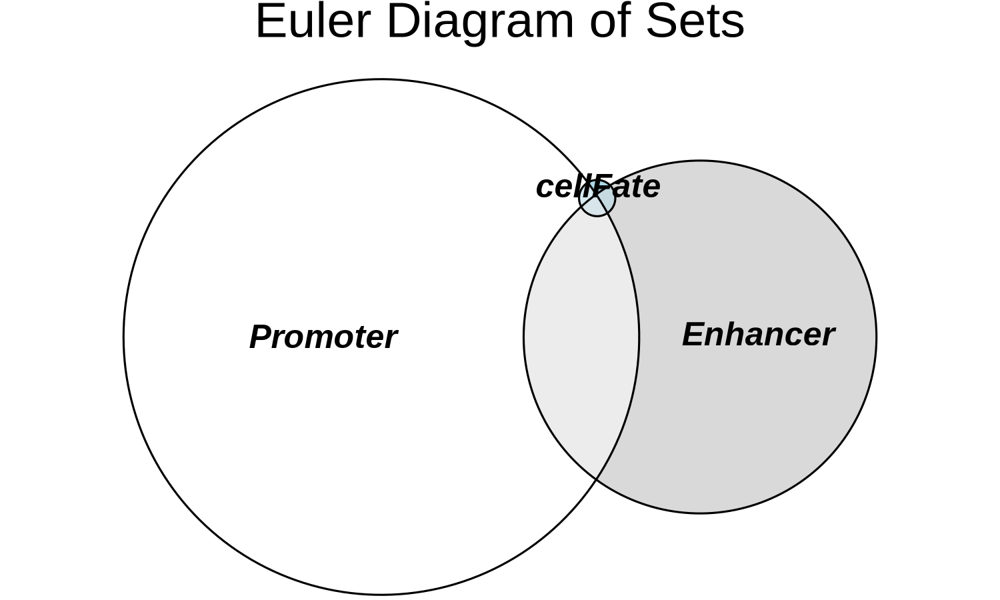

In [702]:
sel1 = unique(probes_ann_dt[seqclass %in% c(26) & group == 'int', SYMBOL] )
sel2 = unique(probes_ann_dt[seqclass %in% c(35) & group == 'int', SYMBOL] ) 
go_dt = bitr("GO:0034097", fromType="GOALL", toType="SYMBOL", OrgDb='org.Hs.eg.db') 
go_dt = as.data.table(go_dt)
go_dt = go_dt[!duplicated(SYMBOL), ]
fit = euler(list(Promoter = sel1, Enhancer = sel2, cellFate = go_dt$SYMBOL)) 
gg = plot(fit, 
     labels = list(font = 4),                    # Label customization
     main = "Euler Diagram of Sets")             # Add a title
fit
gg
ggsave(gg, filename = '~/WenhuoHu/plot/a.pdf', width = 6, height = 4)

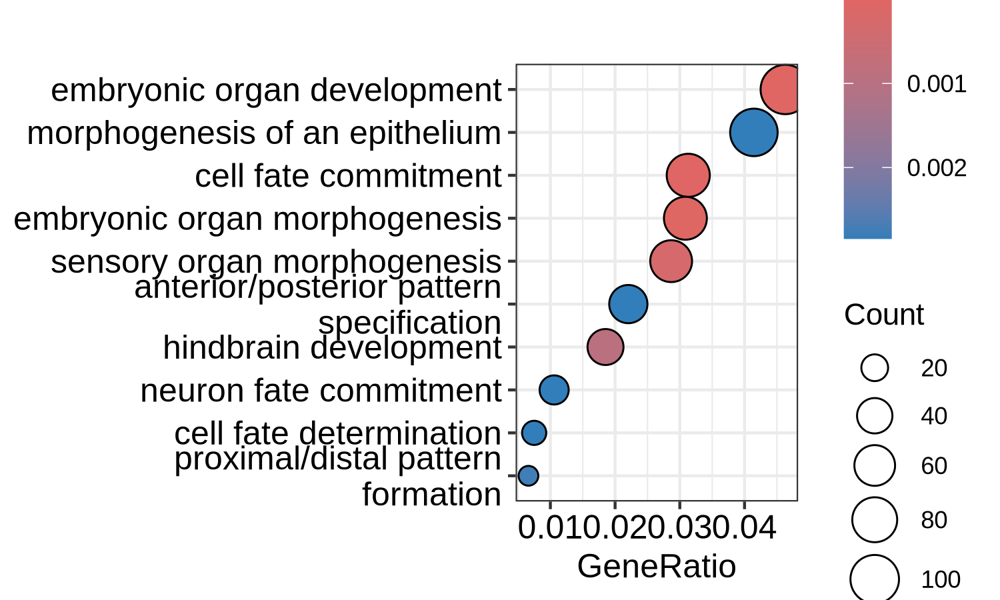

In [661]:
goEnrichment <- enrichGO( gene = sel1,
                         OrgDb = org.Hs.eg.db,  keyType = "SYMBOL", ont = "BP",  pvalueCutoff = 0.05 )

# Plot the enrichment results
dotplot(goEnrichment, showCategory = 10)


# Beataml

## data download

In [ ]:
wget -O "GSE159907_Beta_values.csv.gz" "https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE159907&format=file&file=GSE159907%5FBeta%5Fvalues%2Ecsv%2Egz" 
wget -O "GSE159907_GSM5134137-GSM5134152_Beta_values.csv.gz" "https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE159907&format=file&file=GSE159907%5FGSM5134137%2DGSM5134152%5FBeta%5Fvalues%2Ecsv%2Egz" 
wget -O "GSE159907_RAW.tar" "https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE159907&format=file" 


## load beta values

In [364]:
pat = as.data.table(read_xlsx('~/WenhuoHu/beataml_waves1to4_sample_mapping.xlsx') )

In [374]:
dim(pat)
head(pat)

[1] 979  12

patientId,dbgap_subject_id,labId,dbgap_rnaseq_sample,rna_seq_id,rna_control,rna_include_in_analysis,dbgap_dnaseq_sample,dna_seq_id,dna_capture_type,dna_include_in_analysis,analysisDrug
<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
0,2096,00-00002,BA2392R,00-00002,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00003,BA2611R,00-00003,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00004,BA2506R,00-00004,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00005,BA2430R,00-00005,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00006,BA2448R,00-00006,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00007,BA2730R,00-00007,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA


In [338]:
beat_meth = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/BeatAML/DNA_Methylation/GSE159907_Beta_values.csv')
tmp = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/BeatAML/DNA_Methylation/GSE159907_GSM5134137-GSM5134152_Beta_values.csv')
beat_meth = merge(beat_meth, tmp, by = 'V1')      

In [357]:
beat_meth_beta = beat_meth[, grep('Pval', colnames(beat_meth), invert = T), with = F]

In [367]:
length(intersect(pat$rna_seq_id, colnames(beat_meth_beta)))

[1] 0

In [361]:
setkey(pat, 'rna_seq_id')
colnames(beat_meth_beta)[2:317] = pat[colnames(beat_meth_beta)[2:317], dbgap_rnaseq_sample]

In [373]:
pat[grep('^00', rna_seq_id), ]

patientId,dbgap_subject_id,labId,dbgap_rnaseq_sample,rna_seq_id,rna_control,rna_include_in_analysis,dbgap_dnaseq_sample,dna_seq_id,dna_capture_type,dna_include_in_analysis,analysisDrug
<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
0,2096,00-00002,BA2392R,00-00002,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00003,BA2611R,00-00003,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00004,BA2506R,00-00004,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00005,BA2430R,00-00005,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00006,BA2448R,00-00006,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00007,BA2730R,00-00007,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA
0,2096,00-00008,BA2845R,00-00008,Healthy pooled CD34+,yes,NA,NA,NA,NA,NA


In [362]:
head(beat_meth_beta)
dim(beat_meth_beta)

V1,09-00705,10-00136,10-00507,10-00542,10-00669,10-00792,11-00295,BA2446R,BA2025R,⋯,CY14-3181,CY15-1539,CY15-2832,CY15-287,CY15-2911,CY15-3850,CY15-540,CY15-900,CY15-911,CY16-1734
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cg00000029,0.28431510,0.08742031,0.45149440,0.18710830,0.7587982,0.70916020,0.2867136,0.36052490,0.14087570,⋯,0.3476354,0.05957197,0.10421197,0.09879410,0.39334426,0.63022393,0.3662396,0.66639066,0.16872825,0.09346359
cg00000103,0.98734530,0.93321510,0.80039120,0.86822720,0.9287276,0.98103950,0.9122012,0.65304680,0.51506630,⋯,0.7392368,0.95130425,0.94171833,0.93339430,0.86666184,0.90958446,0.7701597,0.93110570,0.94164633,0.94878034
cg00000109,0.89535740,0.98376350,0.90062900,0.81515250,0.9582479,0.95966580,0.9415048,0.96621600,0.99696360,⋯,0.9558556,0.92741414,0.95154953,0.88794529,0.96184667,0.93982272,0.9171394,0.89096034,0.94335502,0.94223955
cg00000155,0.96936700,0.98977680,0.96272590,0.97742860,0.9562717,0.96114660,0.9614608,0.97862190,0.98160560,⋯,0.9565304,0.95600291,0.98666081,0.97309212,0.97101474,0.97713133,0.9474663,0.95167228,0.94187185,0.96120239
cg00000158,0.98722890,0.98500960,0.98487980,0.96041780,0.9762761,0.98539500,0.9844165,0.99501450,0.97089010,⋯,0.9789995,0.97960400,0.97418369,0.96445179,0.96327785,0.96703920,0.9843138,0.97421910,0.97448195,0.97738612
cg00000165,0.05852137,0.02621131,0.06704888,0.05060012,0.4447558,0.08279027,0.1245911,0.04398738,0.02339821,⋯,0.1246796,0.84517621,0.02533053,0.03480355,0.06676487,0.03879752,0.1260791,0.04908554,0.04666086,0.59164456


[1] 866895    317

# DMC high vs low

In [ ]:
aml_met_2q = subset(aml.met, select = !is.na(aml.met$bcat1_grp4) & aml.met$bcat1_grp4 %in% c('Q1', 'Q2', 'Q3', 'Q4'))
aml_met_2q$grp = 'low'
aml_met_2q$grp[aml_met_2q$bcat1_grp4 %in% c('Q3', 'Q4')] = 'high'
aml_met_2q$grp


In [297]:
tmp = aml_met_2q@assays@data[[1]]
na_rows = apply(tmp, 1, function(xx){sum(is.na(xx))})
tmp = tmp[na_rows < 60, ]
is.na(tmp) = 0
aml_met_2q = subset(aml_met_2q, subset = rownames(aml_met_2q@assays@data[[1]]) %in% rownames(tmp))
aml_met_2q


class: RangedSummarizedExperiment 
dim: 419317 148 
metadata(1): data_release
assays(1): ''
rownames(419317): cg21870274 cg08258224 ... cg13851368 cg14248084
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(66): barcode patient ... BCAT1 grp

In [50]:
# Volcano plot
aml_met_cpg_diff_grp2 <- TCGAanalyze_DMC(
    data = aml_met_2q, 
    groupCol = "grp",
    group1 = "low",
    group2="high",
    p.cut = 10^-5,
    diffmean.cut = 0.25,
    legend = "State",
    plot.filename = "bcat1_low_vs_hi.png"
)


Group1:low

Group2:high

Calculating the p-values of each probe...



|==============================================================================================                                                                  |59.05723% ~6 m remaining  ggg

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



|============================================================================================================================================                    |87.72361% ~2 m remaining  

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [302]:
aml_met_cpg_diff_grp2 = as.data.table(aml_met_cpg_diff_grp2[order(aml_met_cpg_diff_grp2$`p.value.adj.low.high`), ], keep.rownames = T)
aml_met_cpg_diff_grp2[, meth_diff := `mean.low.minus.mean.high` ]
aml_met_cpg_diff_grp2[, logFDR := -log(x = `p.value.adj.low.high`, 10) ]
aml_met_cpg_diff_grp2[, status2 :='Not Sig.' ]
aml_met_cpg_diff_grp2[logFDR > 3 & meth_diff > 0.25, status2 :='Hyper in BCAT1 low' ]
aml_met_cpg_diff_grp2[logFDR > 3 & meth_diff < -0.25, status2 :='Hypo in BCAT1 low' ]
head(aml_met_cpg_diff_grp2)


rn,mean.low,mean.high,mean.low.minus.mean.high,p.value.low.high,p.value.adj.low.high,status,meth_diff,logFDR,status2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
cg16998950,0.7121741,0.8920680,-0.1798939,4.631708e-12,9.710769e-07,Not Significant,-0.1798939,6.012746,Not Sig.
cg04682193,0.3979147,0.6686900,-0.2707753,3.728479e-12,9.710769e-07,Hypomethylated in low,-0.2707753,6.012746,Hypo in BCAT1 low
cg16346032,0.3542072,0.6421419,-0.2879348,1.393808e-11,1.948158e-06,Hypomethylated in low,-0.2879348,5.710376,Hypo in BCAT1 low
cg14014720,0.5134493,0.1542220,0.3592273,3.340987e-11,3.502331e-06,Hypermethylated in low,0.3592273,5.455643,Hyper in BCAT1 low
cg05868564,0.2348484,0.4706681,-0.2358197,6.449593e-11,5.408848e-06,Not Significant,-0.2358197,5.266895,Not Sig.
cg02893429,0.4070168,0.6685412,-0.2615243,1.783915e-10,1.036208e-05,Not Significant,-0.2615243,4.984553,Hypo in BCAT1 low


In [ ]:
tmp = aml_met_cpg_diff_grp2[status2 %in% c('Hyper in BCAT1 low', 'Hypo in BCAT1 low'), ]
ann_grp2 = aml.met@rowRanges
ann_grp2 = ann_grp2[tmp$rn, ]
ann_grp2 = annotatePeak(peak = ann_grp2, TxDb = txdb, annoDb = 'org.Hs.eg.db')
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)
plotAnnoBar(ann_grp2)


>> preparing features information...		 2025-02-27 06:04:53 PM 
>> identifying nearest features...		 2025-02-27 06:04:53 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': *
  - in 'y': chr1_gl000191_random, chr1_gl000192_random, chr4_ctg9_hap1, chr4_gl000193_random, chr4_gl000194_random, chr6_apd_hap1, chr6_cox_hap2, chr6_dbb_hap3, chr6_mann_hap4, chr6_mcf_hap5, chr6_qbl_hap6, chr6_ssto_hap7, chr7_gl000195_random, chr8_gl000196_random, chr8_gl000197_random, chr9_gl000198_random, chr9_gl000199_random, chr9_gl000200_random, chr9_gl000201_random, chr11_gl000202_random, chr17_ctg5_hap1, chr17_gl000203_random, chr17_gl000204_random, chr17_gl000205_random, chr17_gl000206_random, chr18_gl000207_random, chr19_gl000208_random, chr19_gl000209_random, chr21_gl000210_random, chrUn_gl000211, chrUn_gl000212, chrUn_gl000213, chrUn_gl000214, chrUn_gl000215, chrUn_gl000216, chrUn_gl000217, chrUn_gl000218, chrUn_gl000219, chrUn_gl000220, chrUn_gl000221, chrUn_gl000222, chrUn_gl000223, chrUn_gl000224, chrUn_gl000225, chrUn_gl000226, chrUn_

Warning message:
“Removed 11 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_bar()`).”
Warning message:
“Removed 11 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_bar()`).”


pdf 
  2

Warning message:
“Removed 11 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_bar()`).”


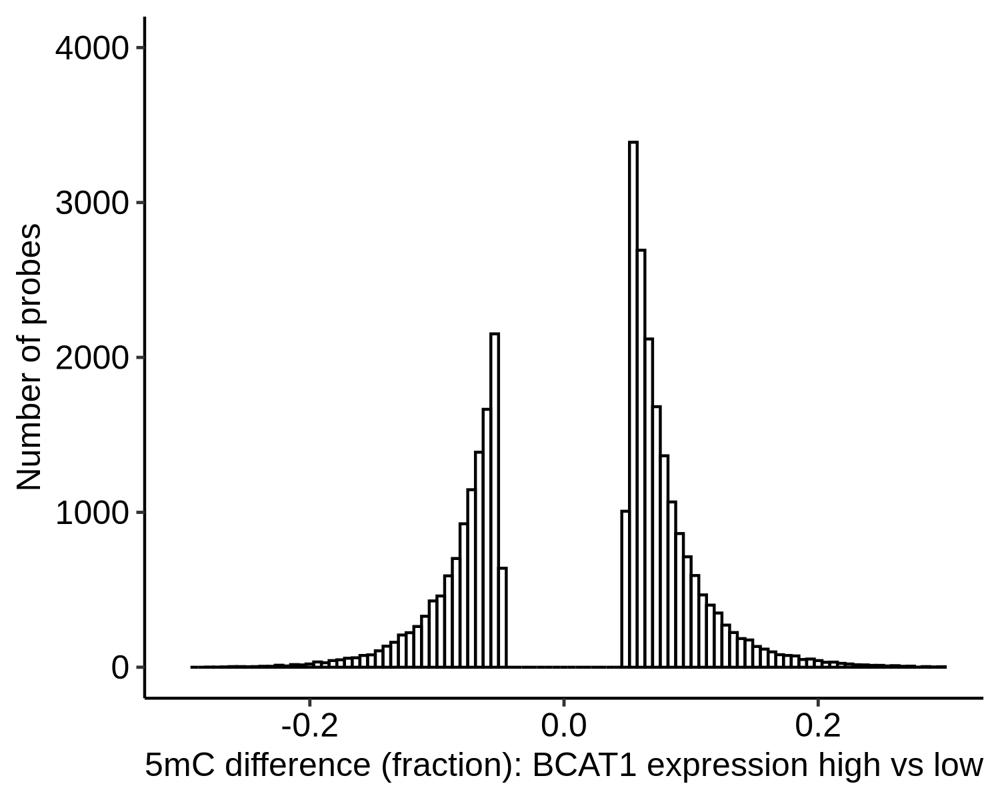

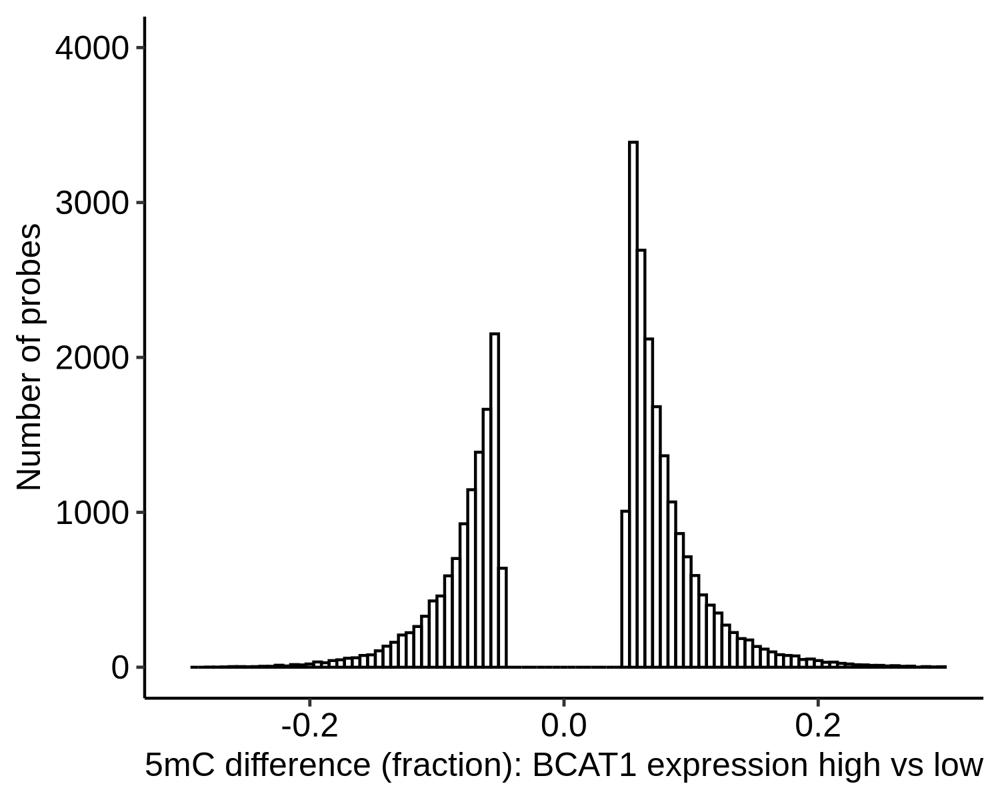

In [61]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
plotdat = copy(aml_met_cpg_diff_grp2 )
plotdat[, meth_diff := - meth_diff ]
gg = gghistogram(plotdat[abs(meth_diff) > .05, ], x = 'meth_diff', bins = 100) + ylim(0, 4000) +
theme_pubr() + scale_color_manual(values = c('#1874DC',  '#C10F3A', 'grey')) + xlab('5mC difference (fraction): BCAT1 expression high vs low') +
guides(color=guide_legend(title="Methylation status")) +
ylab('Number of probes') + xlim(-0.3, 0.3)
gg
pdf(file = '~/WenhuoHu/plot/DMC_histogram_bcat1_tcga.pdf', width = 5, height = 4)
gg
dev.off()
gg

# DMC q1 vs q4

In [118]:
aml_met_2q = subset(aml.met, select = !is.na(aml.met$bcat1_grp4) & aml.met$bcat1_grp4 %in% c('Q1', 'Q4'))
aml_met_2q

class: RangedSummarizedExperiment 
dim: 485577 73 
metadata(1): data_release
assays(1): ''
rownames(485577): cg13869341 cg14008030 ... cg11478607 cg08417382
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(75): barcode patient ... median_int_probe median_top_probe

In [119]:
tmp = aml_met_2q@assays@data[[1]]
na_rows = apply(tmp, 1, function(xx){sum(is.na(xx))})
tmp = tmp[na_rows < 60, ]
is.na(tmp) = 0
aml_met_2q = subset(aml_met_2q, subset = rownames(aml_met_2q@assays@data[[1]]) %in% rownames(tmp))
aml_met_2q


class: RangedSummarizedExperiment 
dim: 421076 73 
metadata(1): data_release
assays(1): ''
rownames(421076): cg21870274 cg08258224 ... cg08265308 cg14273923
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(75): barcode patient ... median_int_probe median_top_probe

In [120]:
head(aml_met_cpg_diff)

rn,mean.Q1,mean.Q4,mean.Q1.minus.mean.Q4,p.value.Q1.Q4,p.value.adj.Q1.Q4,status,logFDR,meth_diff,status2,⋯,MASK_rmsk15,MASK_sub40_copy,MASK_sub35_copy,MASK_sub30_copy,MASK_sub25_copy,MASK_snp5_common,MASK_snp5_GMAF1p,MASK_extBase,MASK_general,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<dbl>
cg00000029,0.5289976,0.4989434,0.0300541317,0.813603646,0.95973781,Not Significant,0.01784739,0.0300541317,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,0.95973781
cg00000108,0.9675394,0.9573850,0.0101544296,0.713292512,0.93293023,Not Significant,0.03015083,0.0101544296,Not Sig.,⋯,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,0.93293023
cg00000109,0.9364907,0.9366137,-0.0001230105,0.847815631,0.96807690,Not Significant,0.01409014,-0.0001230105,Not Sig.,⋯,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,0.96807690
cg00000165,0.3089880,0.4003944,-0.0914064367,0.207796815,0.67014576,Not Significant,0.17383072,-0.0914064367,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,0.67014576
cg00000236,0.6771189,0.8107313,-0.1336123986,0.002907675,0.09582468,Not Significant,1.01852261,-0.1336123986,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,0.09582468
cg00000289,0.8342639,0.8323212,0.0019427311,0.751255848,0.94417865,Not Significant,0.02494582,0.0019427311,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,0.94417865


In [163]:
# Volcano plot
aml_met_cpg_diff <- TCGAanalyze_DMC(
    data = aml_met_2q, 
    groupCol = "bcat1_grp4",
    group1 = "Q1",
    group2="Q4",
    p.cut = 10^-5,
    diffmean.cut = 0.25,
    legend = "State",
    plot.filename = "bcat1_low_vs_hi.png"
)


Group1:Q1

Group2:Q4

Calculating the p-values of each probe...



Completed after 11 m 
===========================================================================================================================================|100%                      ggg

Saving volcano plot as: bcat1_low_vs_hi.png

Saving file as: bcat1_low_vs_hi.png

Saving the results also in a csv file: ./DMR_results_bcat1.grp4_Q1_Q4_pcut_1e-05_meancut_0.25.csv



In [164]:
saveRDS(aml_met_cpg_diff, file = 'data/aml_met_cpg_diff_raw.rds')

In [167]:
aml_met_cpg_diff = as.data.table(aml_met_cpg_diff[order(aml_met_cpg_diff$`p.value.adj.Q1.Q4`), ], keep.rownames = T)
aml_met_cpg_diff[, meth_diff := `mean.Q1.minus.mean.Q4` ]
aml_met_cpg_diff[, FDR := `p.value.adj.Q1.Q4` ]
aml_met_cpg_diff[, logFDR := -log(x = `p.value.adj.Q1.Q4`, 10) ]
aml_met_cpg_diff[, status2 :='Not Sig.' ]
aml_met_cpg_diff[logFDR > -log(0.05, 10) & meth_diff > 0.20, status2 :='Hyper in Q1' ]
aml_met_cpg_diff[logFDR > -log(0.05, 10) & meth_diff < -0.20, status2 :='Hypo in Q1' ]
head(aml_met_cpg_diff)


rn,mean.Q1,mean.Q4,mean.Q1.minus.mean.Q4,p.value.Q1.Q4,p.value.adj.Q1.Q4,status,meth_diff,FDR,logFDR,status2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
cg03445287,0.4797924,0.1460815,0.3337109,1.103147e-14,4.645087e-09,Hypermethylated in Q1,0.3337109,4.645087e-09,8.333006,Hyper in Q1
cg02901136,0.3134446,0.7839432,-0.4704986,9.022870e-14,1.680409e-08,Hypomethylated in Q1,-0.4704986,1.680409e-08,7.774585,Hypo in Q1
cg16346032,0.2727447,0.7203349,-0.4475901,1.197225e-13,1.680409e-08,Hypomethylated in Q1,-0.4475901,1.680409e-08,7.774585,Hypo in Q1
cg04756491,0.3625336,0.8010608,-0.4385272,6.048765e-13,6.367475e-08,Hypomethylated in Q1,-0.4385272,6.367475e-08,7.196033,Hypo in Q1
cg07209244,0.5000023,0.1563843,0.3436180,1.010579e-12,8.047748e-08,Hypermethylated in Q1,0.3436180,8.047748e-08,7.094326,Hyper in Q1
cg02538681,0.3356138,0.8016501,-0.4660362,1.146740e-12,8.047748e-08,Hypomethylated in Q1,-0.4660362,8.047748e-08,7.094326,Hypo in Q1


In [168]:
table(aml_met_cpg_diff$status)
table(aml_met_cpg_diff$status2)


Hypermethylated in Q1  Hypomethylated in Q1       Not Significant 
                   25                   121                420930 


Hyper in Q1  Hypo in Q1    Not Sig. 
        599        1995      418482 

In [160]:
dim(aml_met_cpg_diff)
tmp = aml_met_cpg_diff[status2 %in% c('Hyper in Q1', 'Hypo in Q1'), ]
dim(tmp)

[1] 421076     68

[1] 3035   68

In [169]:
aml_met_cpg_diff = merge(aml_met_cpg_diff, as.data.table(as.data.frame(aml.met@rowRanges), keep.rownames = T), by = 'rn', all.x = T)

In [170]:
aml_met_cpg_diff_gr = makeGRangesFromDataFrame(aml_met_cpg_diff, keep.extra.columns = T)

In [171]:
ann = annotatePeak(peak = aml_met_cpg_diff_gr, TxDb = txdb, annoDb = 'org.Hs.eg.db')


>> preparing features information...		 2025-03-14 12:28:23 PM 
>> identifying nearest features...		 2025-03-14 12:28:23 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': *
  - in 'y': chr1_GL383518v1_alt, chr1_GL383519v1_alt, chr1_GL383520v2_alt, chr1_KI270759v1_alt, chr1_KI270760v1_alt, chr1_KI270761v1_alt, chr1_KI270762v1_alt, chr1_KI270763v1_alt, chr1_KI270764v1_alt, chr1_KI270765v1_alt, chr1_KI270766v1_alt, chr1_KI270892v1_alt, chr2_GL383521v1_alt, chr2_GL383522v1_alt, chr2_GL582966v2_alt, chr2_KI270767v1_alt, chr2_KI270768v1_alt, chr2_KI270769v1_alt, chr2_KI270770v1_alt, chr2_KI270771v1_alt, chr2_KI270772v1_alt, chr2_KI270773v1_alt, chr2_KI270774v1_alt, chr2_KI270775v1_alt, chr2_KI270776v1_alt, chr2_KI270893v1_alt, chr2_KI270894v1_alt, chr3_GL383526v1_alt, chr3_JH636055v2_alt, chr3_KI270777v1_alt, chr3_KI270778v1_alt, chr3_KI270779v1_alt, chr3_KI270780v1_alt, chr3_KI270781v1_alt, chr3_KI270782v1_alt, chr3_KI270783v1_alt, chr3_KI270784v1_alt, chr3_KI270895v1_alt, chr3_KI270924v1_alt, chr3_KI270934v1_alt, chr3_KI2709

>> calculating distance from peak to TSS...	 2025-03-14 12:28:27 PM 
>> assigning genomic annotation...		 2025-03-14 12:28:27 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': *
  - in 'y': chr1_GL383518v1_alt, chr1_GL383519v1_alt, chr1_GL383520v2_alt, chr1_KI270759v1_alt, chr1_KI270760v1_alt, chr1_KI270761v1_alt, chr1_KI270762v1_alt, chr1_KI270763v1_alt, chr1_KI270764v1_alt, chr1_KI270765v1_alt, chr1_KI270766v1_alt, chr1_KI270892v1_alt, chr2_GL383521v1_alt, chr2_GL383522v1_alt, chr2_GL582966v2_alt, chr2_KI270767v1_alt, chr2_KI270768v1_alt, chr2_KI270769v1_alt, chr2_KI270770v1_alt, chr2_KI270771v1_alt, chr2_KI270772v1_alt, chr2_KI270773v1_alt, chr2_KI270774v1_alt, chr2_KI270775v1_alt, chr2_KI270776v1_alt, chr2_KI270893v1_alt, chr2_KI270894v1_alt, chr3_GL383526v1_alt, chr3_JH636055v2_alt, chr3_KI270777v1_alt, chr3_KI270778v1_alt, chr3_KI270779v1_alt, chr3_KI270780v1_alt, chr3_KI270781v1_alt, chr3_KI270782v1_alt, chr3_KI270783v1_alt, chr3_KI270784v1_alt, chr3_KI270895v1_alt, chr3_KI270924v1_alt, chr3_KI270934v1_alt, chr3_KI2709

>> adding gene annotation...			 2025-03-14 12:28:33 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-03-14 12:28:34 PM 
>> done...					 2025-03-14 12:28:34 PM 


In [172]:
ann

Annotated peaks generated by ChIPseeker
421076/421076  peaks were annotated
Genomic Annotation Summary:
              Feature   Frequency
9    Promoter (<=1kb) 51.14444898
10   Promoter (1-2kb)  8.26976603
11   Promoter (2-3kb)  4.99743514
4              5' UTR  0.11708100
3              3' UTR  3.16641176
1            1st Exon  0.69464895
7          Other Exon  2.85839136
2          1st Intron  6.01245381
8        Other Intron 12.12583952
6  Downstream (<=300)  0.06934615
5   Distal Intergenic 10.54417730

In [173]:
ann_dt = as.data.table(as.data.frame(ann@anno), keep.rownames = T)
head(ann_dt)


rn,seqnames,start,end,width,strand,rn.1,mean.Q1,mean.Q4,mean.Q1.minus.mean.Q4,⋯,geneStart,geneEnd,geneLength,geneStrand,geneId,transcriptId,distanceToTSS,ENSEMBL,SYMBOL,GENENAME
<chr>,<fct>,<int>,<int>,<int>,<fct>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>
1,chr16,53434200,53434201,2,-,cg00000029,0.5289976,0.4989434,0.0300541317,⋯,53434418,53491628,57211,1,5934,ENST00000680543.1,-218,ENSG00000103479,RBL2,RB transcriptional corepressor like 2
2,chr3,37417715,37417716,2,-,cg00000108,0.9675394,0.9573850,0.0101544296,⋯,37417267,37435130,17864,1,339883,ENST00000452017.3,449,ENSG00000198590,APRG1,APRG1 tumor suppressor candidate
3,chr3,172198247,172198248,2,-,cg00000109,0.9364907,0.9366137,-0.0001230105,⋯,172126974,172251456,124483,1,64778,ENST00000443501.1,71274,ENSG00000075420,FNDC3B,fibronectin type III domain containing 3B
4,chr1,90729117,90729118,2,+,cg00000165,0.3089880,0.4003944,-0.0914064367,⋯,90711539,90717302,5764,2,343472,ENST00000370445.5,-11815,ENSG00000143032,BARHL2,BarH like homeobox 2
5,chr8,42405776,42405777,2,+,cg00000236,0.6771189,0.8107313,-0.1336123986,⋯,42403032,42405415,2384,1,7419,ENST00000524291.1,2744,ENSG00000078668,VDAC3,voltage dependent anion channel 3
6,chr14,68874422,68874423,2,-,cg00000289,0.8342639,0.8323212,0.0019427311,⋯,68874133,68879099,4967,2,87,ENST00000553882.2,4677,ENSG00000072110,ACTN1,actinin alpha 1


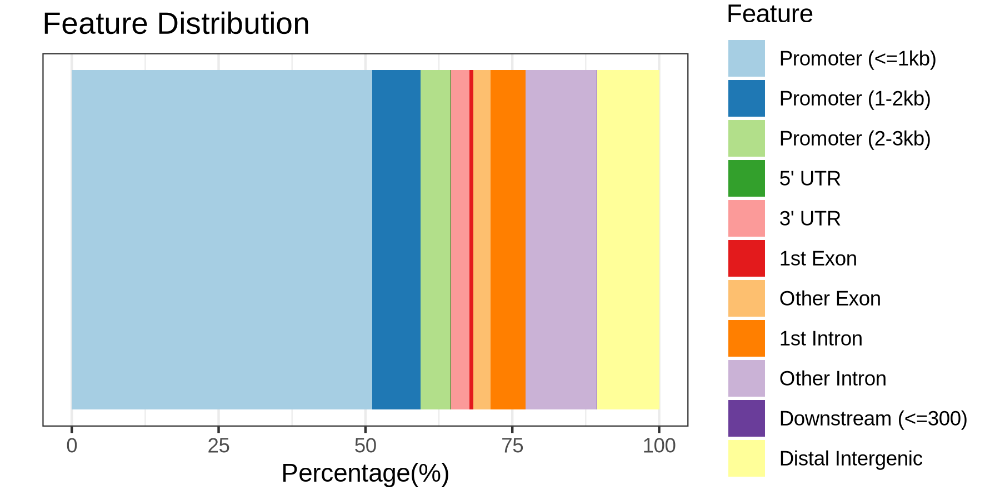

In [127]:
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 300)
plotAnnoBar(ann)


In [174]:
#library(chromPlot)
library(karyoploteR)

Loading required package: regioneR



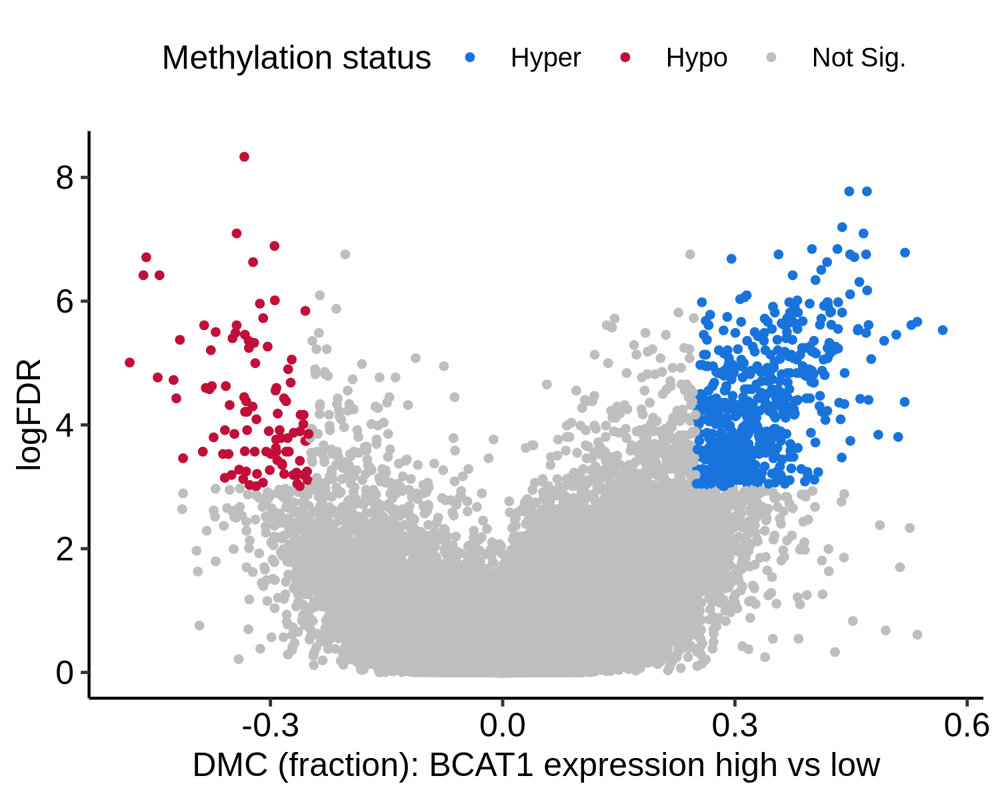

In [128]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
plotdat = copy(aml_met_cpg_diff )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat[, logFDR := -log(FDR, 10) ]
plotdat[, sig := 'Not Sig.'] 
plotdat[meth_diff > .25 & FDR < 0.001, sig := 'Hyper'] 
plotdat[meth_diff < -0.25 & FDR < 0.001, sig := 'Hypo'] 
ggplot(plotdat, aes(x = meth_diff, y = logFDR, color = sig)) + geom_point(size = 1) + 
theme_pubr() + scale_color_manual(values = c('#1874DC',  '#C10F3A', 'grey')) + xlab('DMC (fraction): BCAT1 expression high vs low') +
guides(color=guide_legend(title="Methylation status"))

[1] 42444    68

[1] 18183    68

Warning message:
“Removed 88 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 88 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 11 rows containing non-finite outside the scale range (`stat_bin()`).”


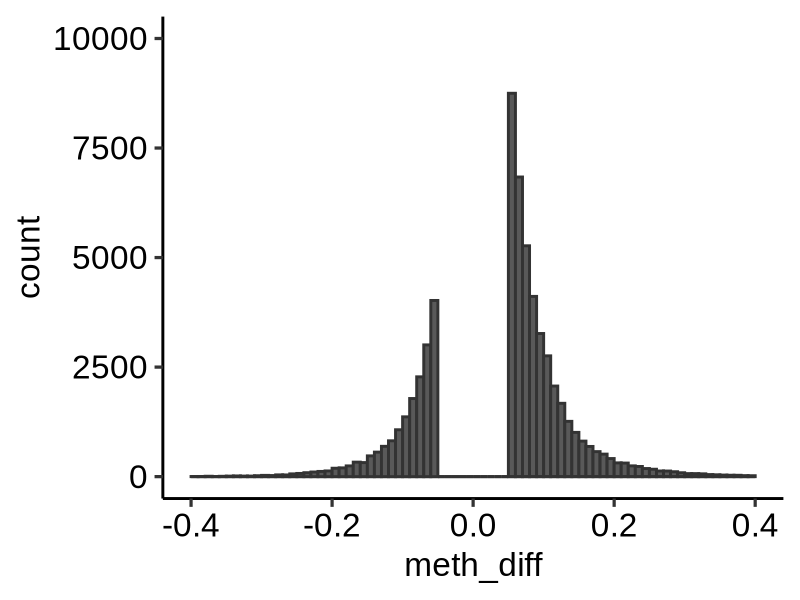

In [129]:
##### mar
cut = .05
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
plotdat = copy(aml_met_cpg_diff )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
plotdat1 = plotdat[ meth_diff > cut, ]
plotdat2 = plotdat[ meth_diff < -cut, ]
dim(plotdat1)
dim(plotdat2)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = meth_diff), binwidth = .01, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = meth_diff), binwidth = .01, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-0.4, 0.4) + ylim(0, 10000)
fname = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_DMP_Bcat_q4_q1.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
dat = rbind(plotdat1, plotdat2)
dat = dat[, c('meth_diff', 'rn')]
fwrite(dat, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_DMP_Bcat_q4_q1.xls', sep = '\t')
gg


In [174]:
head(aml_met_cpg_diff)

rn,mean.Q1,mean.Q4,mean.Q1.minus.mean.Q4,p.value.Q1.Q4,p.value.adj.Q1.Q4,status,meth_diff,FDR,logFDR,⋯,MASK_typeINextBaseSwitch,MASK_rmsk15,MASK_sub40_copy,MASK_sub35_copy,MASK_sub30_copy,MASK_sub25_copy,MASK_snp5_common,MASK_snp5_GMAF1p,MASK_extBase,MASK_general
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
cg00000029,0.5289976,0.4989434,0.0300541317,0.813603646,0.95973781,Not Significant,0.0300541317,0.95973781,0.01784739,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000108,0.9675394,0.9573850,0.0101544296,0.713292512,0.93293023,Not Significant,0.0101544296,0.93293023,0.03015083,⋯,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000109,0.9364907,0.9366137,-0.0001230105,0.847815631,0.96807690,Not Significant,-0.0001230105,0.96807690,0.01409014,⋯,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000165,0.3089880,0.4003944,-0.0914064367,0.207796815,0.67014576,Not Significant,-0.0914064367,0.67014576,0.17383072,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000236,0.6771189,0.8107313,-0.1336123986,0.002907675,0.09582468,Not Significant,-0.1336123986,0.09582468,1.01852261,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000289,0.8342639,0.8323212,0.0019427311,0.751255848,0.94417865,Not Significant,0.0019427311,0.94417865,0.02494582,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE


In [130]:
setkey(aml_met_cpg_diff, 'rn')

In [871]:
plotdat = copy(aml_met_cpg_diff[top_probes, ] )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
dim(plotdat)

plotdat = copy(aml_met_cpg_diff[bot_probes, ] )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
dim(plotdat)


[1] 5277   68

[1] 4682   68

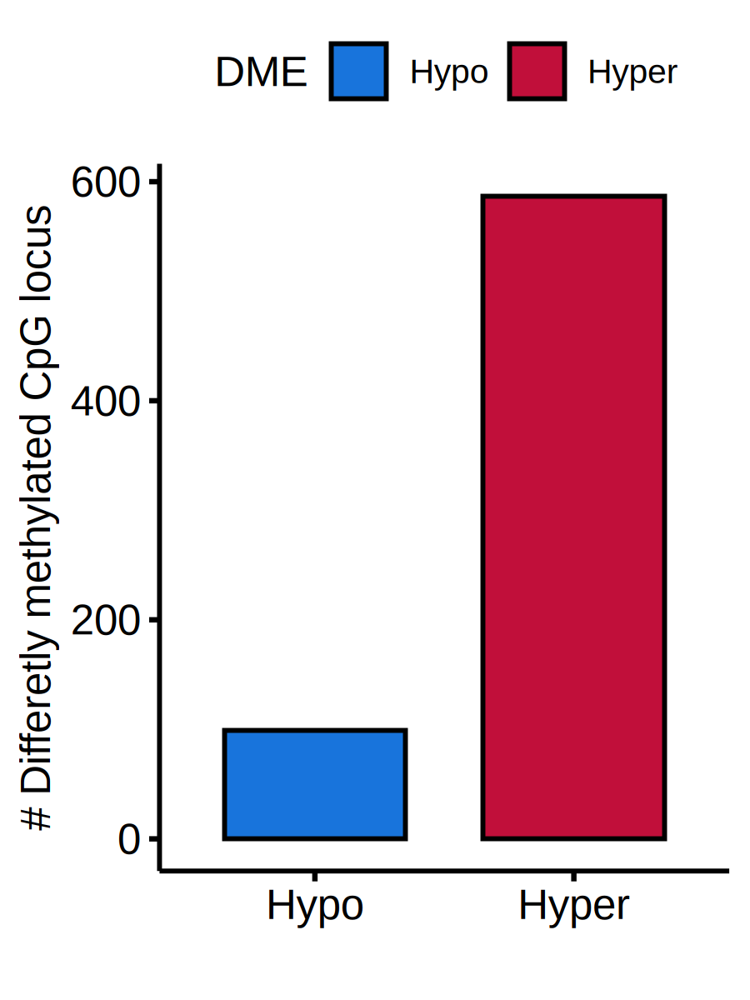

In [22]:
options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 300)
plotdat = as.data.table(table(tmp$status2), keep.rownames = T)
plotdat[grep('Hyper', V1), DME := 'Hypo' ]
plotdat[grep('Hypo', V1), DME := 'Hyper' ]
ggbarplot(plotdat, x = 'DME', y = 'N', fill = 'DME') + ylab('# Differetly methylated CpG locus') + xlab('') + scale_fill_manual(values = c('#1874DC', '#C10F3A'))


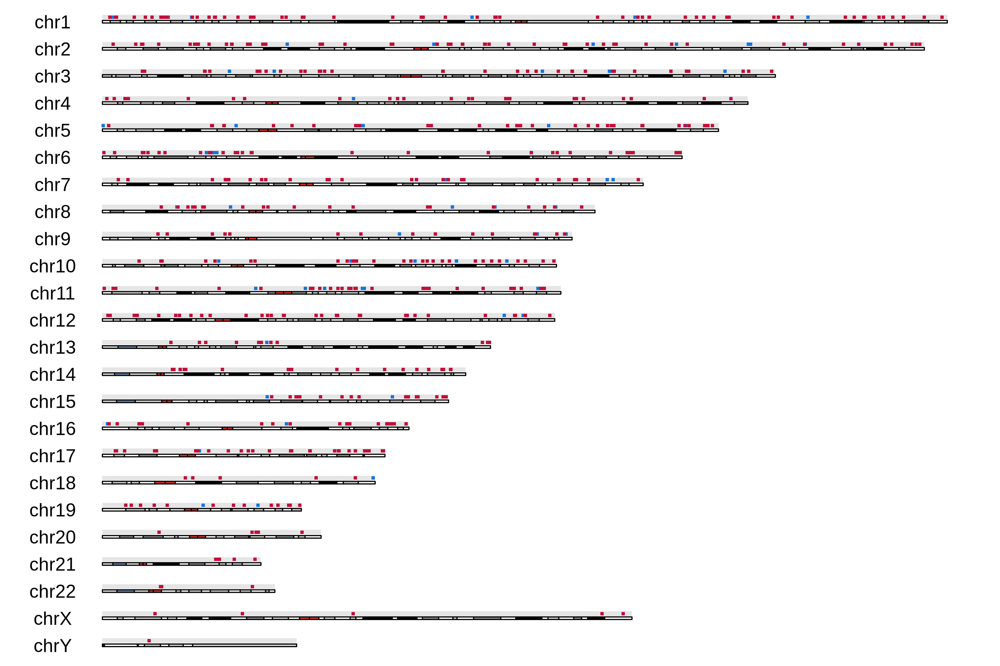

In [342]:
options(repr.plot.width = 9, repr.plot.height = 6, repr.plot.res = 300)
kp <- plotKaryotype(genome="hg38", plot.type=2, main="")
kpDataBackground(kp, data.panel = 1, r0=0, r1=0.45)
#kpAxis(kp, ymin=-1, ymax=1, r0=0.05, r1=0.4, col="gray50", cex=0.5)
tmp1 = tmp[grep('Hyper', status2), ]
tmp2 = tmp[grep('Hypo',  status2), ]
kpPoints(kp, chr=tmp1$seqnames, x=tmp1$start, y=0, ymin=-1, ymax=1, r0=0.05, r1=0.4, col='#1874DC', pch=".", cex=3)
kpPoints(kp, chr=tmp2$seqnames, x=tmp2$start, y=0, ymin=-1, ymax=1, r0=0.05, r1=0.4, col='#C10F3A', pch=".", cex=3)

In [39]:
probeid = 'cg03445287'
probeid = 'cg02901136'
plotdat = aml.met@assays@data[[1]][probeid, ]
plotdat = as.data.table(plotdat, keep.rownames = T)
plotdat[, patient := substr(rn , 1, 12) ]
setnames(plotdat, 2, probeid)
tmp = aml.met@colData
plotdat = as.data.table(merge(plotdat, tmp, by = 'patient') )
plotdat = plotdat[!is.na(bcat1_grp4), ]


Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


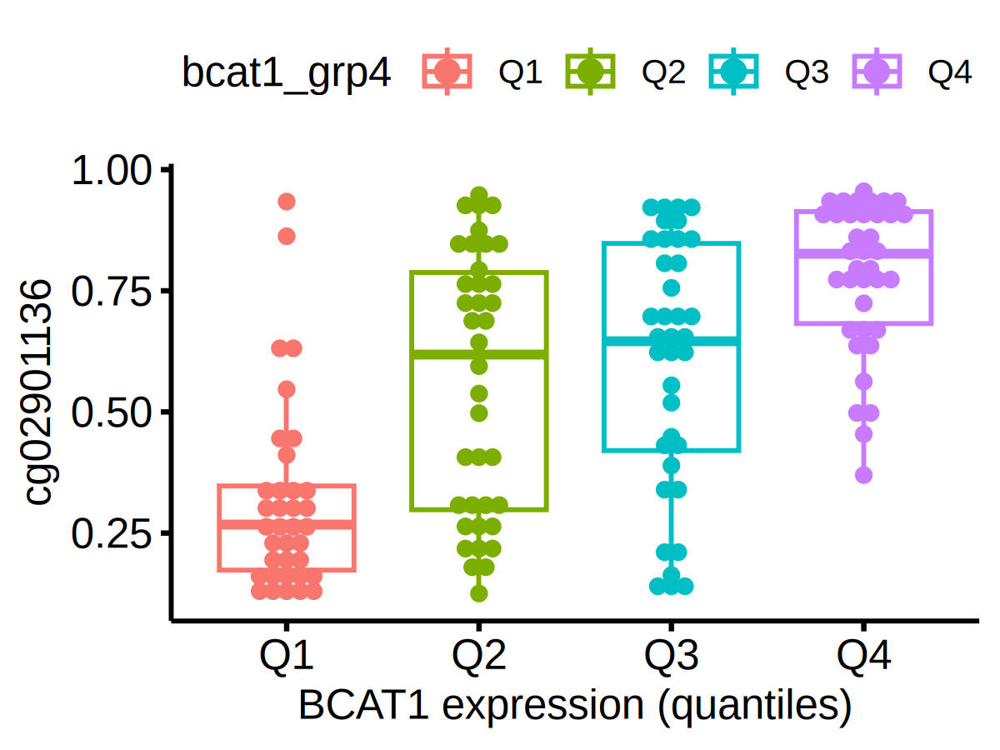

In [42]:
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 300)
ggboxplot(x = 'bcat1_grp4', y = probeid, color = 'bcat1_grp4', data = plotdat, outlier.shape = NA, add = 'dotplot') + xlab('BCAT1 expression (quantiles)')


In [291]:
head(aml_met_cpg_diff)

rn,mean.Q1,mean.Q4,mean.Q1.minus.mean.Q4,p.value.Q1.Q4,p.value.adj.Q1.Q4,status,meth_diff,logFDR,status2,⋯,MASK_typeINextBaseSwitch,MASK_rmsk15,MASK_sub40_copy,MASK_sub35_copy,MASK_sub30_copy,MASK_sub25_copy,MASK_snp5_common,MASK_snp5_GMAF1p,MASK_extBase,MASK_general
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
cg00000029,0.5289976,0.4989434,0.0300541317,0.813603646,0.95973781,Not Significant,0.0300541317,0.01784739,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000108,0.9675394,0.9573850,0.0101544296,0.713292512,0.93293023,Not Significant,0.0101544296,0.03015083,Not Sig.,⋯,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000109,0.9364907,0.9366137,-0.0001230105,0.847815631,0.96807690,Not Significant,-0.0001230105,0.01409014,Not Sig.,⋯,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000165,0.3089880,0.4003944,-0.0914064367,0.207796815,0.67014576,Not Significant,-0.0914064367,0.17383072,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000236,0.6771189,0.8107313,-0.1336123986,0.002907675,0.09582468,Not Significant,-0.1336123986,1.01852261,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000289,0.8342639,0.8323212,0.0019427311,0.751255848,0.94417865,Not Significant,0.0019427311,0.02494582,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE


# DMC q2 vs q3

In [920]:
aml_met_q23 = subset(aml.met, select = !is.na(aml.met$bcat1_grp4) & aml.met$bcat1_grp4 %in% c('Q2', 'Q3'))
aml_met_q23$bcat1_grp4

[1] Q3 Q2 Q2 Q2 Q3 Q2 Q2 Q3 Q3 Q2 Q3 Q3 Q2 Q2 Q3 Q3 Q3 Q2 Q3 Q2 Q2 Q2 Q3 Q3 Q2 Q2 Q3 Q3 Q3 Q2 Q3 Q2 Q3 Q2 Q3 Q3 Q2 Q2 Q2 Q2 Q3 Q2 Q2 Q3 Q3 Q3 Q3 Q3 Q2 Q2 Q2 Q2 Q2 Q3 Q2 Q3 Q2 Q2 Q2 Q3 Q3
[62] Q2 Q3 Q2 Q2 Q3 Q3 Q3 Q3 Q2 Q3 Q2 Q2 Q3 Q3
Levels: Q1 Q2 Q3 Q4

In [921]:
tmp = aml_met_q23@assays@data[[1]]
na_rows = apply(tmp, 1, function(xx){sum(is.na(xx))})
tmp = tmp[na_rows < 60, ]
is.na(tmp) = 0
aml_met_q23 = subset(aml_met_q23, subset = rownames(aml_met_q23@assays@data[[1]]) %in% rownames(tmp))
aml_met_q23


class: RangedSummarizedExperiment 
dim: 421029 75 
metadata(1): data_release
assays(1): ''
rownames(421029): cg21870274 cg08258224 ... cg08265308 cg14273923
rowData names(52): address_A address_B ... MASK_extBase MASK_general
colnames: NULL
colData names(65): barcode patient ... median_meth BCAT1

In [922]:
colnames(aml_met_q23) = aml_met_q23@colData$patient

In [923]:
aml_met_q23@colData$bcat1_grp4

[1] Q3 Q2 Q2 Q2 Q3 Q2 Q2 Q3 Q3 Q2 Q3 Q3 Q2 Q2 Q3 Q3 Q3 Q2 Q3 Q2 Q2 Q2 Q3 Q3 Q2 Q2 Q3 Q3 Q3 Q2 Q3 Q2 Q3 Q2 Q3 Q3 Q2 Q2 Q2 Q2 Q3 Q2 Q2 Q3 Q3 Q3 Q3 Q3 Q2 Q2 Q2 Q2 Q2 Q3 Q2 Q3 Q2 Q2 Q2 Q3 Q3
[62] Q2 Q3 Q2 Q2 Q3 Q3 Q3 Q3 Q2 Q3 Q2 Q2 Q3 Q3
Levels: Q1 Q2 Q3 Q4

In [924]:
# Volcano plot
aml_met_cpg_diff_q23 <- TCGAanalyze_DMC(
    data = aml_met_q23, 
    groupCol = "bcat1_grp4",
    group1 = "Q2",
    group2="Q3",
    p.cut = 10^-5,
    diffmean.cut = 0.25,
    legend = "State",
    plot.filename = "bcat1_low_vs_hi.png"
)


Group1:Q2

Group2:Q3

Calculating the p-values of each probe...



Completed after 25 m ============================================================================================================================================|100%                      ggg


Saving volcano plot as: bcat1_low_vs_hi.png

Saving file as: bcat1_low_vs_hi.png

Saving the results also in a csv file: ./DMR_results_bcat1.grp4_Q2_Q3_pcut_1e-05_meancut_0.25.csv



In [106]:
head(aml_met_cpg_diff_q23)

rn,mean.Q2,mean.Q3,mean.Q2.minus.mean.Q3,p.value.Q2.Q3,p.value.adj.Q2.Q3,status,meth_diff,logFDR,status2,⋯,MASK_typeINextBaseSwitch,MASK_rmsk15,MASK_sub40_copy,MASK_sub35_copy,MASK_sub30_copy,MASK_sub25_copy,MASK_snp5_common,MASK_snp5_GMAF1p,MASK_extBase,MASK_general
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,⋯,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
cg00000029,0.6549364,0.5693298,0.085606574,0.08704485,1,Not Significant,0.085606574,0,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000108,0.9661076,0.9676501,-0.001542466,0.61666846,1,Not Significant,-0.001542466,0,Not Sig.,⋯,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000109,0.9378101,0.9356581,0.002152033,0.40171001,1,Not Significant,0.002152033,0,Not Sig.,⋯,FALSE,TRUE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000165,0.2732899,0.3431101,-0.069820273,0.30634699,1,Not Significant,-0.069820273,0,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000236,0.8226689,0.8321934,-0.009524445,0.78821063,1,Not Significant,-0.009524445,0,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
cg00000289,0.8426688,0.8233930,0.019275765,0.40978392,1,Not Significant,0.019275765,0,Not Sig.,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE


In [46]:
aml_met_cpg_diff_q23 = as.data.table(aml_met_cpg_diff_q23[order(aml_met_cpg_diff_q23$`p.value.adj.Q2.Q3`), ], keep.rownames = T)
aml_met_cpg_diff_q23[, meth_diff := `mean.Q2.minus.mean.Q3` ]
aml_met_cpg_diff_q23[, logFDR := -log(x = `p.value.adj.Q2.Q3`, 10) ]
aml_met_cpg_diff_q23[, status2 :='Not Sig.' ]
aml_met_cpg_diff_q23[logFDR > 3 & meth_diff > 0.25, status2 :='Hyper in Q2' ]
aml_met_cpg_diff_q23[logFDR > 3 & meth_diff < -0.25, status2 :='Hypo in Q2' ]
head(aml_met_cpg_diff_q23)


rn,mean.Q2,mean.Q3,mean.Q2.minus.mean.Q3,p.value.Q2.Q3,p.value.adj.Q2.Q3,status,meth_diff,logFDR,status2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
cg21870274,0.8639170,0.8582920,0.005624981,0.7320433,1,Not Significant,0.005624981,0,Not Sig.
cg08258224,0.8594797,0.8475871,0.011892665,0.8372484,1,Not Significant,0.011892665,0,Not Sig.
cg16619049,0.6321307,0.5785318,0.053598875,0.4076741,1,Not Significant,0.053598875,0,Not Sig.
cg18147296,0.8346091,0.8240751,0.010534031,0.7963318,1,Not Significant,0.010534031,0,Not Sig.
cg13938959,0.5743506,0.5311163,0.043234337,0.4258762,1,Not Significant,0.043234337,0,Not Sig.
cg12445832,0.3754016,0.3026953,0.072706299,0.1040590,1,Not Significant,0.072706299,0,Not Sig.


In [50]:
aml_met_cpg_diff_q23 = merge(aml_met_cpg_diff_q23, as.data.table(as.data.frame(aml.met@rowRanges), keep.rownames = T), by = 'rn', all.x = T)
aml_met_cpg_diff_q23_gr = makeGRangesFromDataFrame(aml_met_cpg_diff_q23, keep.extra.columns = T)
ann_q23 = annotatePeak(peak = aml_met_cpg_diff_q23_gr, TxDb = txdb, annoDb = 'org.Hs.eg.db')
ann_q23_dt = as.data.table(as.data.frame(ann_q23@anno), keep.rownames = T)


>> preparing features information...		 2025-03-11 03:08:41 PM 
>> identifying nearest features...		 2025-03-11 03:08:41 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': *
  - in 'y': chr1_GL383518v1_alt, chr1_GL383519v1_alt, chr1_GL383520v2_alt, chr1_KI270759v1_alt, chr1_KI270760v1_alt, chr1_KI270761v1_alt, chr1_KI270762v1_alt, chr1_KI270763v1_alt, chr1_KI270764v1_alt, chr1_KI270765v1_alt, chr1_KI270766v1_alt, chr1_KI270892v1_alt, chr2_GL383521v1_alt, chr2_GL383522v1_alt, chr2_GL582966v2_alt, chr2_KI270767v1_alt, chr2_KI270768v1_alt, chr2_KI270769v1_alt, chr2_KI270770v1_alt, chr2_KI270771v1_alt, chr2_KI270772v1_alt, chr2_KI270773v1_alt, chr2_KI270774v1_alt, chr2_KI270775v1_alt, chr2_KI270776v1_alt, chr2_KI270893v1_alt, chr2_KI270894v1_alt, chr3_GL383526v1_alt, chr3_JH636055v2_alt, chr3_KI270777v1_alt, chr3_KI270778v1_alt, chr3_KI270779v1_alt, chr3_KI270780v1_alt, chr3_KI270781v1_alt, chr3_KI270782v1_alt, chr3_KI270783v1_alt, chr3_KI270784v1_alt, chr3_KI270895v1_alt, chr3_KI270924v1_alt, chr3_KI270934v1_alt, chr3_KI2709

>> calculating distance from peak to TSS...	 2025-03-11 03:08:48 PM 
>> assigning genomic annotation...		 2025-03-11 03:08:48 PM 


Warning message in .merge_two_Seqinfo_objects(x, y):
“Each of the 2 combined objects has sequence levels not in the other:
  - in 'x': *
  - in 'y': chr1_GL383518v1_alt, chr1_GL383519v1_alt, chr1_GL383520v2_alt, chr1_KI270759v1_alt, chr1_KI270760v1_alt, chr1_KI270761v1_alt, chr1_KI270762v1_alt, chr1_KI270763v1_alt, chr1_KI270764v1_alt, chr1_KI270765v1_alt, chr1_KI270766v1_alt, chr1_KI270892v1_alt, chr2_GL383521v1_alt, chr2_GL383522v1_alt, chr2_GL582966v2_alt, chr2_KI270767v1_alt, chr2_KI270768v1_alt, chr2_KI270769v1_alt, chr2_KI270770v1_alt, chr2_KI270771v1_alt, chr2_KI270772v1_alt, chr2_KI270773v1_alt, chr2_KI270774v1_alt, chr2_KI270775v1_alt, chr2_KI270776v1_alt, chr2_KI270893v1_alt, chr2_KI270894v1_alt, chr3_GL383526v1_alt, chr3_JH636055v2_alt, chr3_KI270777v1_alt, chr3_KI270778v1_alt, chr3_KI270779v1_alt, chr3_KI270780v1_alt, chr3_KI270781v1_alt, chr3_KI270782v1_alt, chr3_KI270783v1_alt, chr3_KI270784v1_alt, chr3_KI270895v1_alt, chr3_KI270924v1_alt, chr3_KI270934v1_alt, chr3_KI2709

>> adding gene annotation...			 2025-03-11 03:09:10 PM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2025-03-11 03:09:11 PM 
>> done...					 2025-03-11 03:09:11 PM 


[1] 18786   182

[1] 10908   182

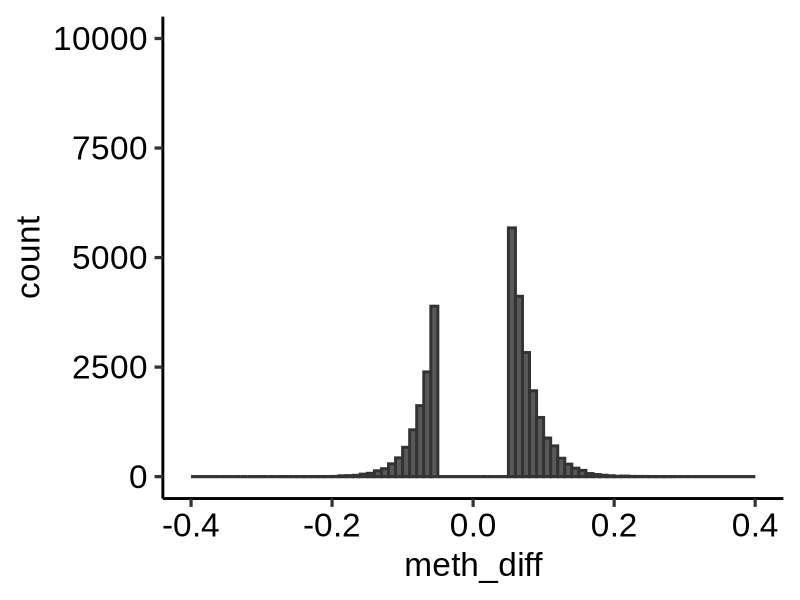

In [107]:
##### mar
cut = .05
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
plotdat = copy(aml_met_cpg_diff_q23 )
plotdat[, meth_diff := meth_diff ]
plotdat[, FDR := `p.value.adj.Q2.Q3` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
plotdat1 = plotdat[ meth_diff > cut, ]
plotdat2 = plotdat[ meth_diff < -cut, ]
dim(plotdat1)
dim(plotdat2)
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = meth_diff), binwidth = .01, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = meth_diff), binwidth = .01, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-0.4, 0.4) + ylim(0, 10000)
fname = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_DMP_Bcat_q3_q2.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
dat = rbind(plotdat1, plotdat2)
dat = dat[, c('meth_diff', 'rn')]
fwrite(dat, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/tcga_DMP_Bcat_q3_q2.xls', sep = '\t')
gg


In [52]:
table(aml_met_cpg_diff_q23$status2)


Not Sig. 
  421029 

## probe and cpg locations

In [772]:
cpg_dt = fread('/home/whu78/cpgIslandExt.txt') 
setnames(cpg_dt, 1, 'chr')
setnames(cpg_dt, 2, 'start')
setnames(cpg_dt, 3, 'end')
setnames(cpg_dt, 4, 'name')
head(cpg_dt) 
cpg_gr = makeGRangesFromDataFrame(cpg_dt, keep.extra.columns = T)
cpg_gr


chr,start,end,name,V5,V6,V7,V8,V9,V10
<chr>,<int>,<int>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
chr1,28735,29810,CpG: 116,1075,116,787,21.6,73.2,0.83
chr1,135124,135563,CpG: 30,439,30,295,13.7,67.2,0.64
chr1,327790,328229,CpG: 29,439,29,295,13.2,67.2,0.62
chr1,437151,438164,CpG: 84,1013,84,734,16.6,72.5,0.64
chr1,449273,450544,CpG: 99,1271,99,777,15.6,61.1,0.84
chr1,533219,534114,CpG: 94,895,94,570,21.0,63.7,1.04


GRanges object with 30344 ranges and 7 metadata columns:
          seqnames            ranges strand |        name        V5        V6        V7        V8        V9       V10
             <Rle>         <IRanges>  <Rle> | <character> <integer> <integer> <integer> <numeric> <numeric> <numeric>
      [1]     chr1       28735-29810      * |    CpG: 116      1075       116       787      21.6      73.2      0.83
      [2]     chr1     135124-135563      * |     CpG: 30       439        30       295      13.7      67.2      0.64
      [3]     chr1     327790-328229      * |     CpG: 29       439        29       295      13.2      67.2      0.62
      [4]     chr1     437151-438164      * |     CpG: 84      1013        84       734      16.6      72.5      0.64
      [5]     chr1     449273-450544      * |     CpG: 99      1271        99       777      15.6      61.1      0.84
      ...      ...               ...    ... .         ...       ...       ...       ...       ...       ...       ...

In [777]:
top_probes_gr = as.data.table(row_data[top_probes, c('chrm_A', 'beg_A')], keep.rownames = T)
setnames(top_probes_gr, c('probeid', 'chr', 'start'))
top_probes_gr[, end := start ]
top_probes_gr = makeGRangesFromDataFrame(top_probes_gr, keep.extra.columns = T)

ov = findOverlaps(cpg_gr, top_probes_gr)
cpg_ov = cpg_gr[queryHits(ov)] 
top_probes_ov = top_probes_gr[subjectHits(ov)] 

length(top_probes_ov) / length(top_probes)

[1] 0.02434978

In [775]:
bot_probes_gr = as.data.table(row_data[bot_probes, c('chrm_A', 'beg_A')], keep.rownames = T)
setnames(bot_probes_gr, c('probeid', 'chr', 'start'))
bot_probes_gr[, end := start ]
bot_probes_gr = makeGRangesFromDataFrame(bot_probes_gr, keep.extra.columns = T)

ov = findOverlaps(cpg_gr, bot_probes_gr)
cpg_ov = cpg_gr[queryHits(ov)] 
bot_probes_ov = bot_probes_gr[subjectHits(ov)] 

length(bot_probes_ov) / length(bot_probes)

GRanges object with 5119 ranges and 7 metadata columns:
         seqnames            ranges strand |        name        V5        V6        V7        V8        V9       V10
            <Rle>         <IRanges>  <Rle> | <character> <integer> <integer> <integer> <numeric> <numeric> <numeric>
     [1]     chr1     912869-913153      * |     CpG: 28       284        28       222      19.7      78.2      0.97
     [2]     chr1     975496-980305      * |    CpG: 351      4809       351      3126      14.6      65.0      0.69
     [3]     chr1     984206-984429      * |     CpG: 19       223        19       154      17.0      69.1      0.72
     [4]     chr1     999678-999911      * |     CpG: 20       233        20       167      17.2      71.7      0.67
     [5]     chr1   1011509-1013402      * |    CpG: 122      1893       122      1344      12.9      71.0      0.62
     ...      ...               ...    ... .         ...       ...       ...       ...       ...       ...       ...
  [5115]

GRanges object with 5119 ranges and 1 metadata column:
         seqnames    ranges strand |     probeid
            <Rle> <IRanges>  <Rle> | <character>
     [1]     chr1    912950      * |  cg11851804
     [2]     chr1    976627      * |  cg23635910
     [3]     chr1    984351      * |  cg16417258
     [4]     chr1    999711      * |  cg02397514
     [5]     chr1   1013196      * |  cg25610492
     ...      ...       ...    ... .         ...
  [5115]     chrX  41333237      * |  cg03102848
  [5116]     chrX  41333252      * |  cg09768249
  [5117]     chrX  41333620      * |  cg27042767
  [5118]     chrX  41333939      * |  cg11251991
  [5119]     chrX  41334025      * |  cg16117744
  -------
  seqinfo: 24 sequences from an unspecified genome; no seqlengths

[1] 0.03830526

In [776]:
int_probes_gr = as.data.table(row_data[int_probes, c('chrm_A', 'beg_A')], keep.rownames = T)
setnames(int_probes_gr, c('probeid', 'chr', 'start'))
int_probes_gr[, end := start ]
int_probes_gr = makeGRangesFromDataFrame(int_probes_gr, keep.extra.columns = T)

ov = findOverlaps(cpg_gr, int_probes_gr)
cpg_ov = cpg_gr[queryHits(ov)] 
int_probes_ov = int_probes_gr[subjectHits(ov)] 

length(int_probes_ov) / length(int_probes)

[1] 0.03093346

# combine DMC and DEG

In [175]:
head(deg_bcat1)
dim(deg_bcat1)

rn,logFC,logCPM,PValue,FDR,logFDR,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AC026310.2,3.764057,-0.06868897,7.344881e-50,2.838576e-45,44.54690,Up
BCAT1,3.918946,6.56555500,2.473737e-47,4.780126e-43,42.32056,Up
AC023796.2,3.797221,-1.61654828,2.578134e-40,3.321238e-36,35.47870,Up
RBPMS,2.442166,5.35733245,4.179731e-24,4.038351e-20,19.39380,Up
SRGN,-2.726758,11.09418539,1.381253e-23,1.067626e-19,18.97158,Dn
CLTCL1,-3.858870,6.03772039,2.310273e-22,1.488085e-18,17.82737,Dn


[1] 38647     7

In [210]:
##### mar
#tmp = ann_dt[abs(meth_diff) > .25 & logFDR > 3 & abs(distanceToTSS) < 3000, .(SYMBOL, distanceToTSS, meth_diff)]
tmp = ann_dt[abs(distanceToTSS) < 10000, .(SYMBOL, distanceToTSS, meth_diff, mean.Q1.minus.mean.Q4, meth_FDR, meth_logFDR, status2)]
tmp[, status2 := 'N.S.' ]
tmp[meth_logFDR > -log(0.05, 10) & meth_diff < 0, status2 := 'Hyper in Q4' ]
tmp[meth_logFDR > -log(0.05, 10) & meth_diff > 0, status2 := 'Hyper in Q1' ]
tmp[, n4 := nrow(.SD[status2 == 'Hyper in Q4', ]), by = 'SYMBOL' ]
tmp[, n1 := nrow(.SD[status2 == 'Hyper in Q1', ]), by = 'SYMBOL' ]
tmp[status2 == 'Hyper in Q4', nn := n4 ]
tmp[status2 == 'Hyper in Q1', nn := n1 ]
tmp[, status2 := factor(status2) ]
table(tmp$status2)
tmp = tmp[!duplicated(SYMBOL), ]
dim(tmp)

deg_dmc2 = merge(deg_bcat1, tmp, by.x = 'rn', by.y = 'SYMBOL')
deg_dmc2 = deg_dmc2[!duplicated(rn), ]
deg_dmc2[, meth_diff := - meth_diff ]
deg_dmc2[, sig := '' ]
deg_dmc2[logFDR > -log(0.05, 10) & logFC < 0, sig := 'Dn' ]
deg_dmc2[logFDR > -log(0.05, 10) & logFC > 0, sig := 'Up' ]
dim(deg_dmc2)
head(deg_dmc2[order(PValue), ])


Hyper in Q1 Hyper in Q4        N.S. 
       1367        4229      326088 

[1] 27193    10

[1] 19551    16

rn,logFC,logCPM,PValue,FDR,logFDR,sig,distanceToTSS,meth_diff,mean.Q1.minus.mean.Q4,meth_FDR,meth_logFDR,status2,n4,n1,nn
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<int>,<int>,<int>
BCAT1,3.918946,6.565555,2.473737e-47,4.780126e-43,42.32056,Up,15,0.007182848,-0.007182848,0.979859972,0.008835983,N.S.,0,1,NA
RBPMS,2.442166,5.357332,4.179731e-24,4.038351e-20,19.39380,Up,-1997,-0.009445071,0.009445071,0.840573504,0.075424304,N.S.,3,1,NA
SRGN,-2.726758,11.094185,1.381253e-23,1.067626e-19,18.97158,Dn,1993,0.184979944,-0.184979944,0.002587139,2.587180263,Hyper in Q4,3,0,3
CLTCL1,-3.858870,6.037720,2.310273e-22,1.488085e-18,17.82737,Dn,935,0.021284182,-0.021284182,0.043676697,1.359750208,Hyper in Q4,1,0,1
F3,-3.984679,2.926739,3.096993e-22,1.709850e-18,17.76704,Dn,464,0.275158431,-0.275158431,0.000270048,3.568559097,Hyper in Q4,5,0,5
SEPTIN11,1.371461,7.182797,2.475409e-21,1.195839e-17,16.92233,Up,279,0.001427946,-0.001427946,0.950734598,0.021940701,N.S.,0,2,NA


[1] 245  16


Hyper in Q1 Hyper in Q4        N.S. 
         38         101         106 

Warning message:
“ggrepel: 188 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


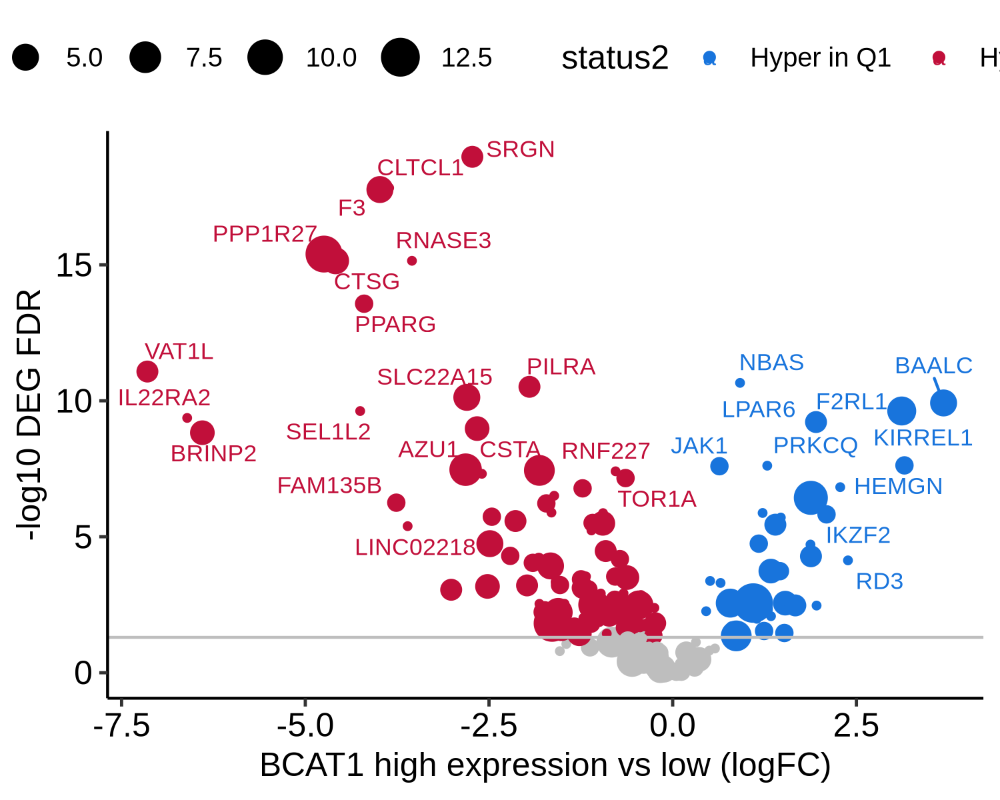

In [178]:
##### mar

# logFC > 0 : upregulated in Q4
# meth_diff > 0 : hypermethylated in Q4
# the different direction, logFC > 0 and meth_diff < 0, is what we need 
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
plotdat = deg_dmc2[status2 != 'N.S.', ]
plotdat = plotdat[n1 == 0 | n4 == 0, ]
plotdat = plotdat[n1 > 0 & logFC > 0 | n4 > 0 & logFC < 0, ]
dim(plotdat)
plotdat[logFDR < -log(0.05, 10), status2 := 'N.S.'] 
table(plotdat$status2)
gg = ggplot(plotdat, aes(x = logFC, y = logFDR, color = status2, label = rn, size = nn)) + geom_point() + 
theme_pubr() + scale_color_manual(values = c('#1874DC', '#C10F3A', 'grey')) +
xlab('BCAT1 high expression vs low (logFC)') + ylab('-log10 DEG FDR') + 
ggrepel::geom_text_repel(size = 3) + 
scale_fill_manual(c('N.S.' = 'grey', 'Hyper in Q4' = 'green', 'Hyper in Q1' = 'orange')) + 
geom_hline(yintercept = -log(0.05, 10), color = "grey", size = .5)
gg

Warning message:
“ggrepel: 663 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


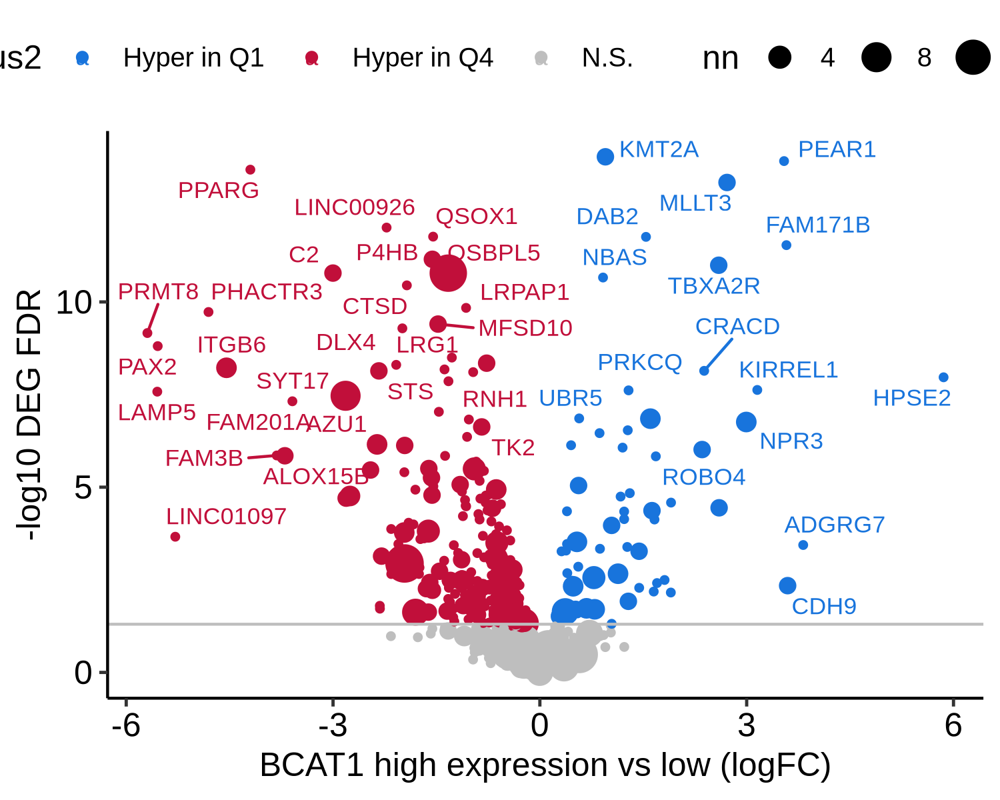

In [207]:
##### mar

options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)

plotdat = fread('~/WenhuoHu/plot/mar/dmc_with_DEG_TSS10k_mar11.xls')
#plotdat = deg_dmc2[status2 != 'N.S.', ]
#plotdat = plotdat[n1 == 0 | n4 == 0, ]
#plotdat = plotdat[n1 > 0 & logFC > 0 | n4 > 0 & logFC < 0, ]
#plotdat[logFDR < -log(0.05, 10), status2 := 'N.S.'] 
gg = ggplot(plotdat, aes(x = logFC, y = logFDR, color = status2, label = rn, size = nn)) + geom_point() + 
theme_pubr() + scale_color_manual(values = c('#1874DC', '#C10F3A', 'grey')) +
xlab('BCAT1 high expression vs low (logFC)') + ylab('-log10 DEG FDR') + 
ggrepel::geom_text_repel(size = 3) + 
scale_fill_manual(c('N.S.' = 'grey', 'Hyper in Q4' = 'green', 'Hyper in Q1' = 'orange')) + 
geom_hline(yintercept = -log(0.05, 10), color = "grey", size = .5)
#ggsave(gg, file = '~/WenhuoHu/plot/mar/dmc_with_DEG_TSS10k.pdf', width = 5, heigh = 4) 
gg
#fwrite(plotdat, file = '~/WenhuoHu/plot/mar/dmc_with_DEG_TSS10k.xls', sep = '\t')


[1] 245  16


Hyper in Q1 Hyper in Q4        N.S. 
         38         101         106 

Warning message:
“ggrepel: 217 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 188 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


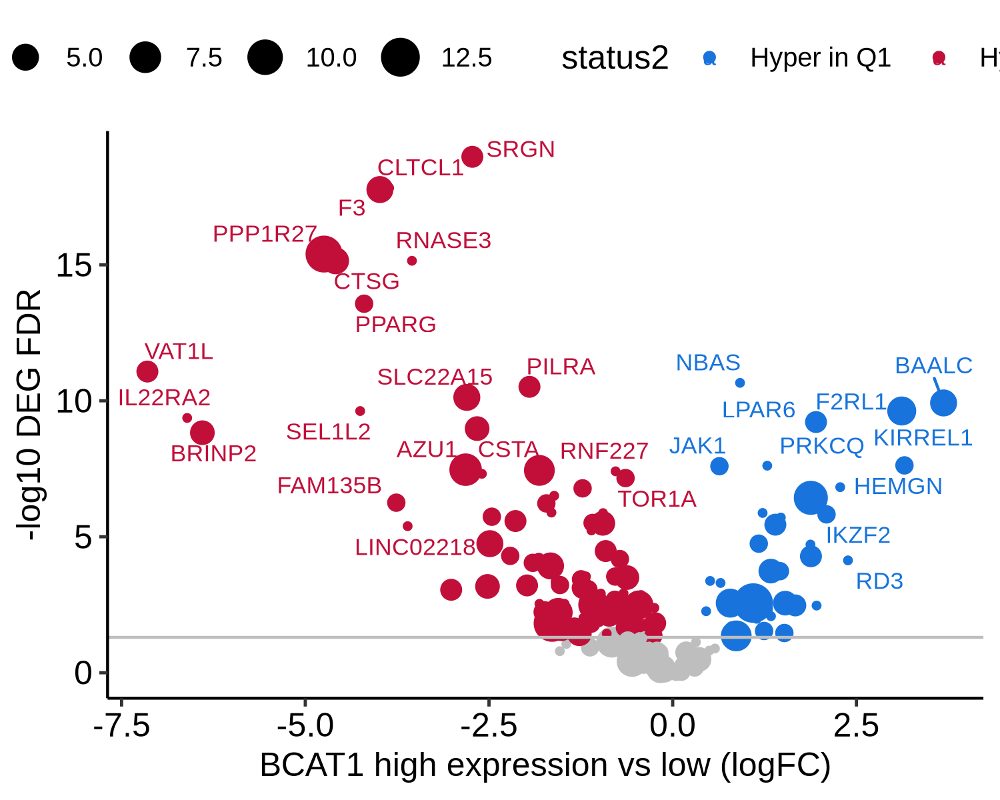

In [143]:
##### mar

# logFC > 0 : upregulated in Q4
# meth_diff > 0 : hypermethylated in Q4
# the different direction, logFC > 0 and meth_diff < 0, is what we need 
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
plotdat = deg_dmc2[status2 != 'N.S.', ]
plotdat = plotdat[n1 == 0 | n4 == 0, ]
plotdat = plotdat[n1 > 0 & logFC > 0 | n4 > 0 & logFC < 0, ]
dim(plotdat)
plotdat[logFDR < -log(0.05, 10), status2 := 'N.S.'] 
table(plotdat$status2)
gg = ggplot(plotdat, aes(x = logFC, y = logFDR, color = status2, label = rn, size = nn)) + geom_point() + 
theme_pubr() + scale_color_manual(values = c('#1874DC', '#C10F3A', 'grey')) +
xlab('BCAT1 high expression vs low (logFC)') + ylab('-log10 DEG FDR') + 
ggrepel::geom_text_repel(size = 3) + 
scale_fill_manual(c('N.S.' = 'grey', 'Hyper in Q4' = 'green', 'Hyper in Q1' = 'orange')) + 
geom_hline(yintercept = -log(0.05, 10), color = "grey", size = .5)
#ggsave(gg, file = '~/WenhuoHu/plot/mar/dmc_with_DEG_TSS10k.pdf', width = 5, heigh = 4) 
gg
#fwrite(plotdat, file = '~/WenhuoHu/plot/mar/dmc_with_DEG_TSS10k.xls', sep = '\t')


In [179]:
table(plotdat$status2) 


Hyper in Q1 Hyper in Q4        N.S. 
         38         101         106 

In [1006]:
table(plotdat$status2) 


Hyper in Q1 Hyper in Q4        N.S. 
         72         236         421 

## pathways

In [1009]:
gene_sel1 = plotdat[sig == 'Dn' & status2 == 'Hyper in Q4', rn ]
length(gene_sel1) 
gene_sel2 = plotdat[sig == 'Up' & status2 == 'Hyper in Q1', rn ]
length(gene_sel2) 


[1] 236

[1] 72

In [ ]:
pathwaysDF <- msigdbr("human", category="H")
pathways1 <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)
pathwaysDF <- msigdbr(species = "Homo sapiens", category = "C2", subcategory = "CP:KEGG")
pathways2 <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)

pathways = c(pathways1, pathways2)


In [1064]:
pathwaysDF <- msigdbr("human")
pathways <- split(as.character(pathwaysDF$gene_symbol), pathwaysDF$gs_name)


In [1066]:
res = enrichr_msigdb(gene_sel1, pathways)

In [1074]:
res = as.data.table(res)

In [1090]:
path = as.data.table(table(pathwaysDF[!duplicated(pathwaysDF$gs_name), 'gs_subcat']), keep.rownames = T)
setnames(path, 'N', 'n_pathways')
head(path)


gs_subcat,n_pathways
<chr>,<int>
,1238
CGN,427
CGP,3384
CM,431
CP,29
CP:BIOCARTA,292


In [1097]:
dat = as.data.table(table(res[P.Value < 0.05, gs_subcat]), keep.rownames = T)
dat = merge(dat, path, by.x = 'V1', by.y = 'gs_subcat') 
dat = dat[!is.na(V1), ]
dat = dat[V1 != '', ]
dat[, per := N / n_pathways ]
dat = dat[order(per, decreasing = T), ]
datatable(dat)

HTML widgets cannot be represented in plain text (need html)

In [1058]:
dim(dbs)

[1] 233   7

Pathway,Overlap,P.Value,gs_cat,gs_subcat
<chr>,<int>,<dbl>,<chr>,<chr>
AMUNDSON_DNA_DAMAGE_RESPONSE_TP53,4,3.079406e-05,C2,CGP
MULLIGHAN_MLL_SIGNATURE_1_UP,20,2.845418e-07,C2,CGP
MULLIGHAN_MLL_SIGNATURE_2_UP,21,3.774813e-07,C2,CGP


Warning message:
"Removed 1599 rows containing missing values or values outside the scale range (`geom_text_repel()`)."


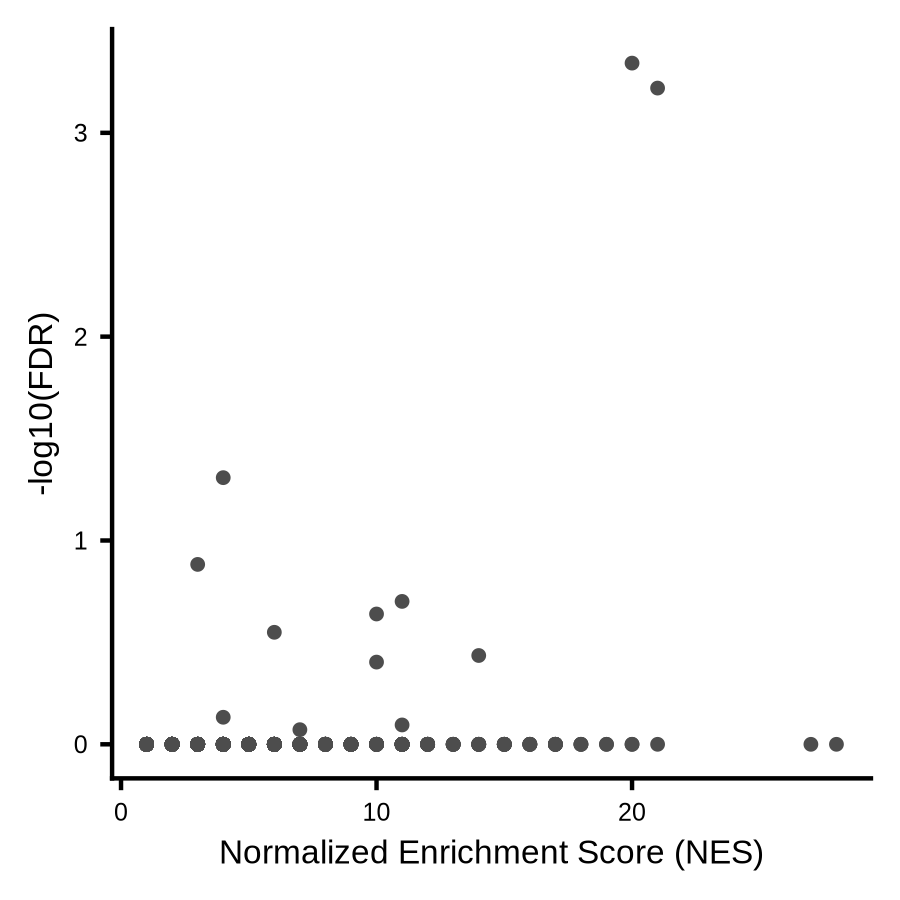

In [1104]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)
plotdat = res[gs_subcat == 'CGP', ][P.Value < 1,  ]
plotdat[, FDR := p.adjust(P.Value) ]
head(plotdat[FDR < 0.05, 1:5 ])
plotdat[, logFDR := -log(FDR, 10) ]
plotdat[logFDR > 10, lbl := Pathway ]
gg = ggplot(plotdat, aes(x = Overlap, y = logFDR)) +
geom_point(color = 'grey30', size = 1) +
geom_text_repel(aes(label = lbl),  size = 1,  box.padding = 0.2,   point.padding = 0.2,
                  max.overlaps = 10,  min.segment.length = 0.5, force = 1) +  
xlab('Normalized Enrichment Score (NES)') + ylab('-log10(FDR)') +
theme_cowplot() +
theme(axis.title.x = element_text(size = 8), 
        axis.title.y = element_text(size = 8),
        axis.text.x = element_text(size = 6),  # Reduce x-axis tick label size
        axis.text.y = element_text(size = 6),  # Reduce y-axis tick label size
        axis.ticks.length = unit(1, "mm"))  # Reduce tick mark size
#ggsave(gg, file = '~/WenhuoHu/plot/mar/tcga_bcat1_hi_vs_lo_gsea_CGN.pdf', width = 3, height = 3)
gg


In [ ]:
source('~/script/utils.r')

In [1107]:
res2 = enrichr_msigdb(gene_sel2)

In [1108]:
head(res2[, 1:5])

Pathway,Overlap,P.Value,gs_cat,gs_subcat
<chr>,<int>,<dbl>,<chr>,<chr>
AAAGGAT_MIR501,2,0.08953122,C3,MIR:MIR_Legacy
AAAGGGA_MIR204_MIR211,3,0.05345878,C3,MIR:MIR_Legacy
AAAYRNCTG_UNKNOWN,5,0.01536483,C3,TFT:TFT_Legacy
AACTTT_UNKNOWN,11,0.16732807,C3,TFT:TFT_Legacy
AAGCAAT_MIR137,2,0.20347259,C3,MIR:MIR_Legacy
AAGCACA_MIR218,1,1.00000000,C3,MIR:MIR_Legacy


Pathway,Overlap,P.Value,gs_cat,gs_subcat
<chr>,<int>,<dbl>,<chr>,<chr>
ALCALAY_AML_BY_NPM1_LOCALIZATION_DN,7,1.745693e-05,C2,CGP
DESERT_STEM_CELL_HEPATOCELLULAR_CARCINOMA_SUBCLASS_UP,8,2.521128e-06,C2,CGP
MULLIGHAN_MLL_SIGNATURE_1_DN,9,1.713291e-06,C2,CGP
MULLIGHAN_MLL_SIGNATURE_2_DN,12,3.395155e-09,C2,CGP


Warning message:
"Removed 939 rows containing missing values or values outside the scale range (`geom_text_repel()`)."


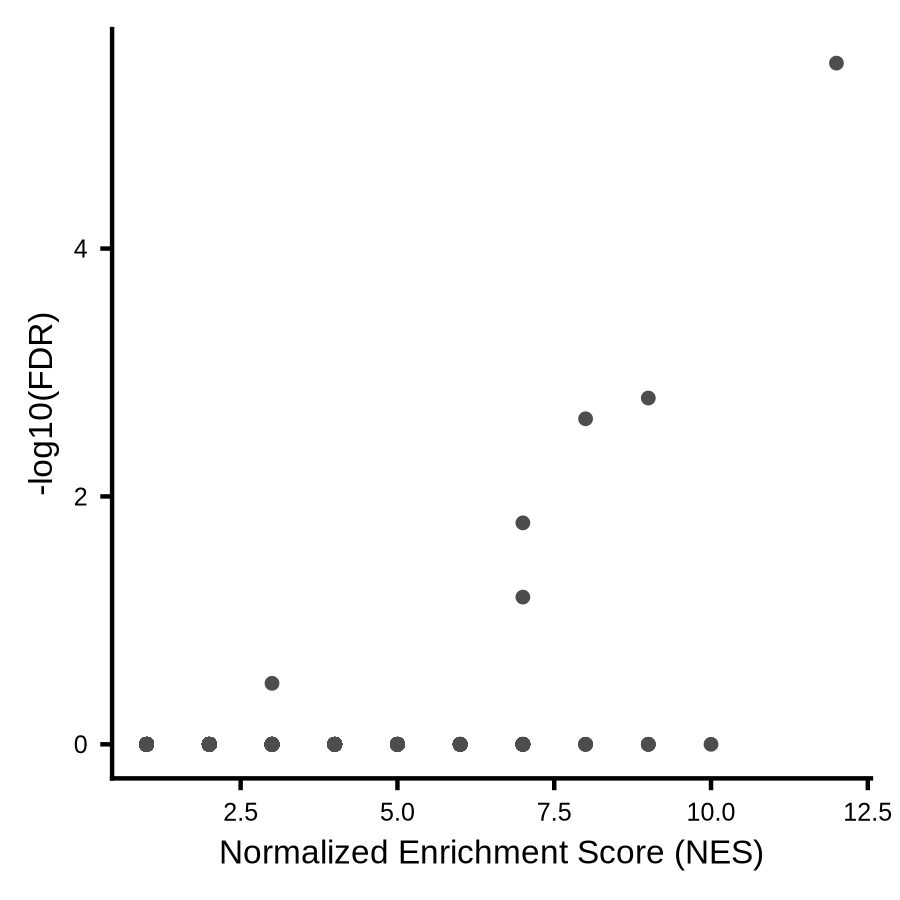

In [1110]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)
plotdat = res2[gs_subcat == 'CGP', ][P.Value < 1,  ]
plotdat[, FDR := p.adjust(P.Value) ]
head(plotdat[FDR < 0.05, 1:5 ])
plotdat[, logFDR := -log(FDR, 10) ]
plotdat[logFDR > 10, lbl := Pathway ]
gg = ggplot(plotdat, aes(x = Overlap, y = logFDR)) +
geom_point(color = 'grey30', size = 1) +
geom_text_repel(aes(label = lbl),  size = 1,  box.padding = 0.2,   point.padding = 0.2,
                  max.overlaps = 10,  min.segment.length = 0.5, force = 1) +  
xlab('Normalized Enrichment Score (NES)') + ylab('-log10(FDR)') +
theme_cowplot() +
theme(axis.title.x = element_text(size = 8), 
        axis.title.y = element_text(size = 8),
        axis.text.x = element_text(size = 6),  # Reduce x-axis tick label size
        axis.text.y = element_text(size = 6),  # Reduce y-axis tick label size
        axis.ticks.length = unit(1, "mm"))  # Reduce tick mark size
#ggsave(gg, file = '~/WenhuoHu/plot/mar/tcga_bcat1_hi_vs_lo_gsea_CGN.pdf', width = 3, height = 3)
gg


# DEG association with DMC 

In [214]:
# import the original results
dd = fread('data/dmc_with_DEG_TSS10k_mar11.xls')
head(dd) 

rn,logFC,logCPM,PValue,FDR,logFDR,sig,distanceToTSS,meth_diff,mean.Q1.minus.mean.Q4,meth_FDR,meth_logFDR,status2,n4,n1,nn
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<int>,<int>
ABCA11P,0.7950040,0.4509789,0.004611010,0.019765049,1.704102,Up,-6253,-0.11853637,0.11853637,0.000748733,3.125673,Hyper in Q1,0,3,3
ABCG2,1.4391842,0.7665062,0.000049700,0.000536312,3.270582,Up,-2148,-0.29496055,0.29496055,0.006363340,2.196315,Hyper in Q1,0,2,2
ABHD5,-0.5230308,5.1465349,0.001558341,0.008385575,2.076467,Dn,1732,0.03459806,-0.03459806,0.047122299,1.326774,Hyper in Q4,1,0,1
ABTB2,-0.7135228,4.2534788,0.002317764,0.011466139,1.940583,Dn,7996,0.27164387,-0.27164387,0.000011200,4.949103,Hyper in Q4,1,0,1
ACAD9,-0.1064523,5.3004213,0.264065415,0.421084239,0.375631,,-3190,0.09987318,-0.09987318,0.027009468,1.568484,N.S.,1,0,1
ADAMTS2,-2.7543098,5.1606418,0.000000752,0.000017300,4.762861,Dn,-4038,0.14786755,-0.14786755,0.000050500,4.296782,Hyper in Q4,3,0,3


In [268]:
table(dd$sig)


     Dn  Up 
421 236  72 

In [256]:
table(deg_bcat1$sig)


      Dn Not. Sig       Up 
    1888    34610     2149 

In [258]:
table(ann_dt$status2)


Hyper in Q1  Hypo in Q1    Not Sig. 
        599        1995      418482 

In [267]:
q1_hyper_gene = ann_dt[status2 == 'Hyper in Q1', SYMBOL]
q4_hyper_gene = ann_dt[status2 == 'Hypo in Q1', SYMBOL]
q1_hyper_q4up_gene = dd[rn %in% q1_hyper_gene & sig == 'Up', rn]
q4_hyper_q4dn_gene = dd[rn %in% q4_hyper_gene & sig == 'Dn', rn]
length(q1_hyper_q4up_gene)
length(q4_hyper_q4dn_gene)


[1] 11

[1] 51

In [262]:
head(q1_hyper_gene)

character(0)

## heatmap of these genes

[1] 308

pdf 
  2

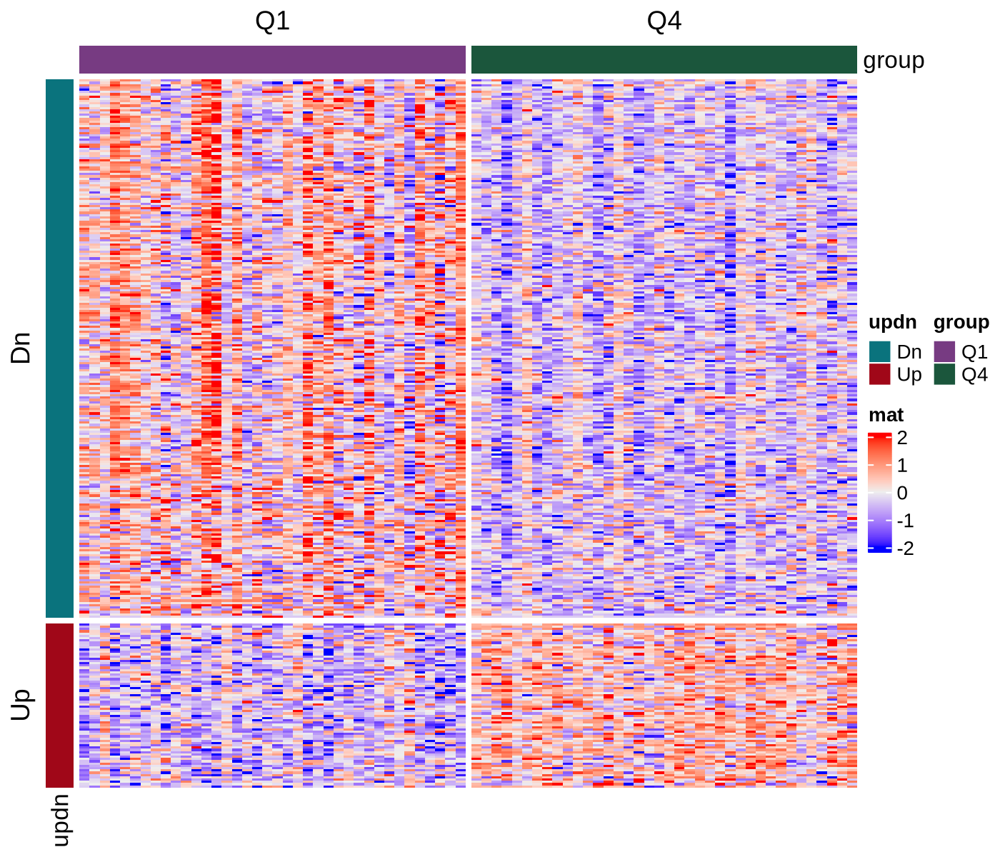

In [254]:
##### mar

ov = intersect(rownames(logcpm_bcat1), dd[sig %in% c('Up', 'Dn'), rn])
length(ov)
plotdat = logcpm_bcat1[ov, rownames(dsn_col)]

dsn_row = data.table(rn = rownames(plotdat))
dsn_row[rn %in% dd[sig == 'Up', rn], updn := 'Up' ]
dsn_row[rn %in% dd[sig == 'Dn', rn], updn := 'Dn' ]
dsn_row = data.frame(updn = dsn_row$updn, row.names = dsn_row$rn)

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'group', drop = F])
column_ra = rowAnnotation(df = dsn_row)

options(repr.plot.width = 7, repr.plot.height = 6, repr.plot.res = 200)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, row_split = dsn_row$updn, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        left_annotation = column_ra, show_row_dend = F, top_annotation = column_ha, column_split = factor(dsn_col$group, levels = c('Q1', 'Q4')))  

fname = '~/WenhuoHu/plot/mar/heatmap_DEG_BCAT1_high_vs_low_updn.pdf'
pdf(file = fname, width = 7, height = 6)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, row_split = dsn_row$updn, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        left_annotation = column_ra, show_row_dend = F, top_annotation = column_ha, column_split = factor(dsn_col$group, levels = c('Q1', 'Q4')))  
dev.off()


## probes related with these genes

In [222]:
tmp = merge(ann_dt, dd, by.x = 'SYMBOL', by.y = 'rn', all.x = T)


In [183]:
setnames(ann_dt, 7, 'ID')

In [184]:
ann_dt[ID %in% top_probes, probe_grp := 'top_probe' ]
ann_dt[ID %in% bot_probes, probe_grp := 'bot_probe' ]
ann_dt[ID %in% int_probes, probe_grp := 'int_probe' ]

In [224]:
tmp2 = tmp[!is.na(probe_grp) & SYMBOL %in% dd$rn, ]
table(tmp2$sig, tmp2$probe_grp)


    
     bot_probe int_probe top_probe
          3043       345      4735
  Dn      1883       243      2611
  Up       559        47       684

In [185]:
table(ann_dt$probe_grp)


bot_probe int_probe top_probe 
   133590     12807    159663 

In [255]:
c(1883, 243, 2611) / c(133590, 12807, 159663)

[1] 0.01409537 0.01897400 0.01635319

In [187]:
head(deg_bcat1)

rn,logFC,logCPM,PValue,FDR,logFDR,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AC026310.2,3.764057,-0.06868897,7.344881e-50,2.838576e-45,44.54690,Up
BCAT1,3.918946,6.56555500,2.473737e-47,4.780126e-43,42.32056,Up
AC023796.2,3.797221,-1.61654828,2.578134e-40,3.321238e-36,35.47870,Up
RBPMS,2.442166,5.35733245,4.179731e-24,4.038351e-20,19.39380,Up
SRGN,-2.726758,11.09418539,1.381253e-23,1.067626e-19,18.97158,Dn
CLTCL1,-3.858870,6.03772039,2.310273e-22,1.488085e-18,17.82737,Dn


In [189]:
setnames(ann_dt, 'FDR', 'meth_FDR')
setnames(ann_dt, 'logFDR', 'meth_logFDR')


In [190]:
colnames(ann_dt)


[1] "rn"                       "seqnames"                 "start"                    "end"                      "width"                    "strand"                  
 [7] "ID"                       "mean.Q1"                  "mean.Q4"                  "mean.Q1.minus.mean.Q4"    "p.value.Q1.Q4"            "p.value.adj.Q1.Q4"       
[13] "status"                   "meth_diff"                "meth_FDR"                 "meth_logFDR"              "status2"                  "address_A"               
[19] "address_B"                "channel"                  "designType"               "nextBase"                 "nextBaseRef"              "probeType"               
[25] "orientation"              "probeCpGcnt"              "context35"                "probeBeg"                 "probeEnd"                 "ProbeSeq_A"              
[31] "ProbeSeq_B"               "gene"                     "gene_HGNC"                "chrm_A"                   "beg_A"                    "flag_A"                  
[37] "mapQ_A"                   "cigar_A"                  "NM_A"                     "chrm_B"                   "beg_B"                    "flag_B"                  
[43] "mapQ_B"                   "cigar_B"                  "NM_B"                     "wDecoy_chrm_A"            "wDecoy_beg_A"             "wDecoy_flag_A"           
[49] "wDecoy_mapQ_A"            "wDecoy_cigar_A"           "wDecoy_NM_A"              "wDecoy_chrm_B"            "wDecoy_beg_B"             "wDecoy_flag_B"           
[55] "wDecoy_mapQ_B"            "wDecoy_cigar_B"           "wDecoy_NM_B"              "posMatch"                 "MASK_mapping"             "MASK_typeINextBaseSwitch"
[61] "MASK_rmsk15"              "MASK_sub40_copy"          "MASK_sub35_copy"          "MASK_sub30_copy"          "MASK_sub25_copy"          "MASK_snp5_common"        
[67] "MASK_snp5_GMAF1p"         "MASK_extBase"             "MASK_general"             "annotation"               "geneChr"                  "geneStart"               
[73] "geneEnd"                  "geneLength"               "geneStrand"               "geneId"                   "transcriptId"             "distanceToTSS"           
[79] "ENSEMBL"                  "SYMBOL"                   "GENENAME"                 "probe_grp"

In [193]:
head(deg_bcat1)
table(deg_bcat1$sig)

rn,logFC,logCPM,PValue,FDR,logFDR,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AC026310.2,3.764057,-0.06868897,7.344881e-50,2.838576e-45,44.54690,Up
BCAT1,3.918946,6.56555500,2.473737e-47,4.780126e-43,42.32056,Up
AC023796.2,3.797221,-1.61654828,2.578134e-40,3.321238e-36,35.47870,Up
RBPMS,2.442166,5.35733245,4.179731e-24,4.038351e-20,19.39380,Up
SRGN,-2.726758,11.09418539,1.381253e-23,1.067626e-19,18.97158,Dn
CLTCL1,-3.858870,6.03772039,2.310273e-22,1.488085e-18,17.82737,Dn



      Dn Not. Sig       Up 
    1888    34610     2149 

In [192]:
tmp = merge(ann_dt, deg_bcat1, by.x = 'SYMBOL', by.y = 'rn', all.x = T)


In [203]:
dim(tmp[!duplicated(SYMBOL), ])
dim(ann_dt[!duplicated(SYMBOL), ])

[1] 28834    88

[1] 28834    82

In [204]:
table(tmp[!is.na(probe_grp) & sig %in% c('Dn', 'Up'), sig]) 
table(tmp[!is.na(probe_grp) & sig %in% c('Dn', 'Up'), probe_grp])
table(tmp[!is.na(probe_grp) & sig %in% c('Dn', 'Up'), status], tmp[!is.na(probe_grp) & sig %in% c('Dn', 'Up'), probe_grp])



   Dn    Up 
13903 17910 


bot_probe int_probe top_probe 
    11953      1685     18175 

                       
                        bot_probe int_probe top_probe
  Hypermethylated in Q1         0         1         0
  Hypomethylated in Q1          0         3         0
  Not Significant           11953      1681     18175

In [200]:
table(ann_dt$probe_grp)


bot_probe int_probe top_probe 
   133590     12807    159663 

# DEG DMC histogram

In [881]:
ann_dt[, ann := annotation ]
ann_dt[grep('Promoter', annotation), ann := 'gene' ]
ann_dt[grep('Intron', annotation), ann := 'gene' ]
ann_dt[grep('Exon', annotation), ann := 'gene' ]
ann_dt[grep('UTR', annotation), ann := 'gene' ]
ann_dt[grep('Down', annotation), ann := 'gene' ]
ann_dt[grep('Distal', annotation), ann := 'distal' ]
table(ann_dt$ann)


distal   gene 
170472 250604 

In [873]:
head(deg_bcat1)

rn,logFC,logCPM,PValue,FDR,logFDR,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AC026310.2,-3.764057,-0.06868897,7.344881e-50,2.838576e-45,44.54690,Dn
BCAT1,-3.918946,6.56555500,2.473737e-47,4.780126e-43,42.32056,Dn
AC023796.2,-3.797221,-1.61654828,2.578134e-40,3.321238e-36,35.47870,Dn
RBPMS,-2.442166,5.35733245,4.179731e-24,4.038351e-20,19.39380,Dn
SRGN,2.726758,11.09418539,1.381253e-23,1.067626e-19,18.97158,Up
CLTCL1,3.858870,6.03772039,2.310273e-22,1.488085e-18,17.82737,Up


Warning message:
"Removed 3 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 3 rows containing non-finite outside the scale range (`stat_bin()`)."


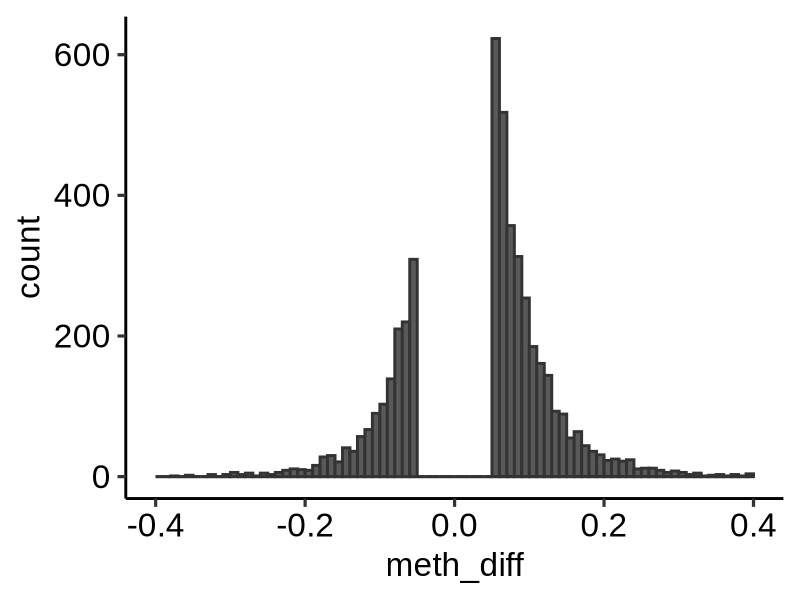

In [896]:
gene_sel = deg_bcat1[sig %in% c('Up', 'Dn'), rn] 
cut = .05
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
plotdat = copy(ann_dt[ann == 'gene' & SYMBOL %in% gene_sel, ] )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
plotdat1 = plotdat[ meth_diff > cut, ]
plotdat2 = plotdat[ meth_diff < -cut, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = meth_diff), binwidth = .01, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = meth_diff), binwidth = .01, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-0.4, 0.4)
fname = '~/WenhuoHu/plot/tcga_UpDnGene_DMP_KO_WT.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


Warning message:
"Removed 1 row containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 1 row containing non-finite outside the scale range (`stat_bin()`)."


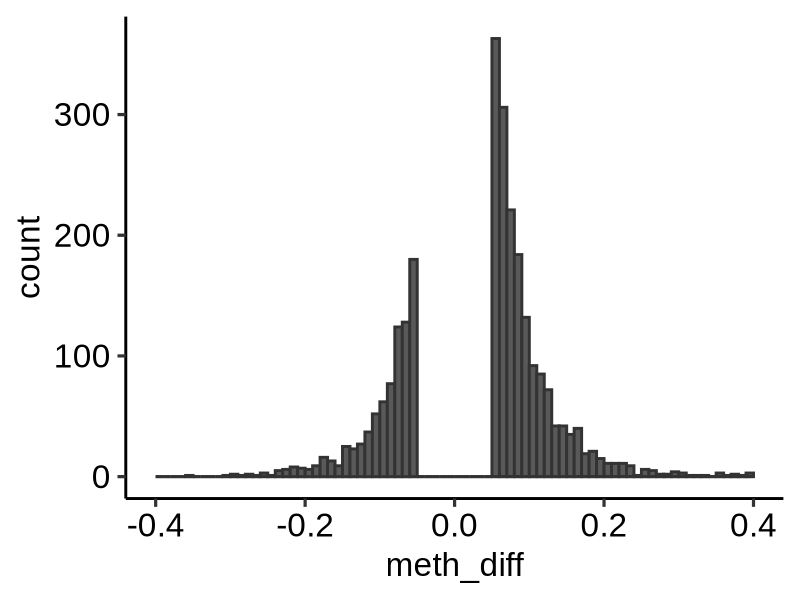

In [897]:
gene_sel = deg_bcat1[sig %in% c('Dn'), rn] 
cut = .05
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
plotdat = copy(ann_dt[ann == 'gene' & SYMBOL %in% gene_sel, ] )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
plotdat1 = plotdat[ meth_diff > cut, ]
plotdat2 = plotdat[ meth_diff < -cut, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = meth_diff), binwidth = .01, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = meth_diff), binwidth = .01, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-0.4, 0.4)
fname = '~/WenhuoHu/plot/tcga_DnGene_DMP_KO_WT.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


Warning message:
"Removed 2 rows containing non-finite outside the scale range (`stat_bin()`)."
Warning message:
"Removed 2 rows containing non-finite outside the scale range (`stat_bin()`)."


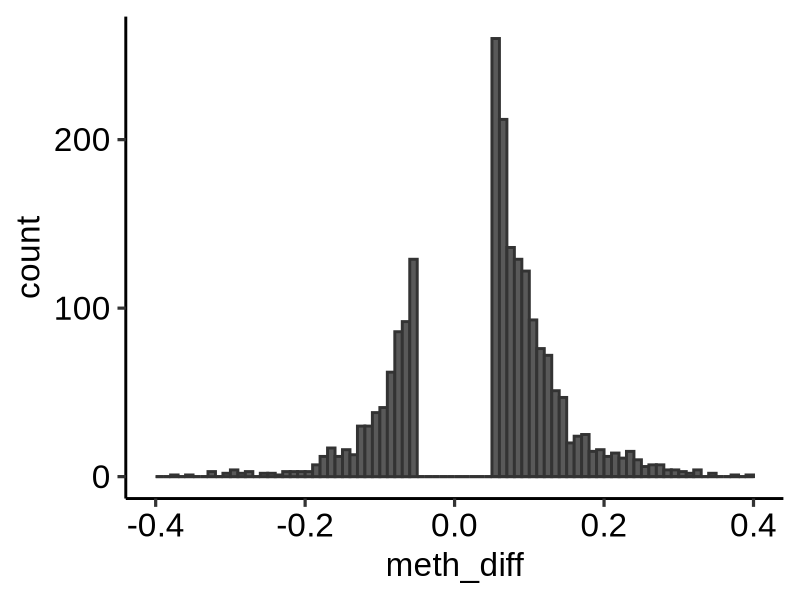

In [898]:
gene_sel = deg_bcat1[sig %in% c('Up'), rn] 
cut = .05
options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
plotdat = copy(ann_dt[ann == 'gene' & SYMBOL %in% gene_sel, ] )
plotdat[, meth_diff := - meth_diff ]
plotdat[, FDR := `p.value.adj.Q1.Q4` ]
plotdat = plotdat[abs(meth_diff) > .05, ]
plotdat1 = plotdat[ meth_diff > cut, ]
plotdat2 = plotdat[ meth_diff < -cut, ]
gg = ggplot() + 
geom_histogram(data = plotdat1, aes(x = meth_diff), binwidth = .01, boundary = cut, col = 'grey20') +
geom_histogram(data = plotdat2, aes(x = meth_diff), binwidth = .01, boundary = -cut, col = 'grey20') +
theme_pubr() + xlim(-0.4, 0.4)
fname = '~/WenhuoHu/plot/tcga_UpGene_DMP_q1_q4.pdf'
ggsave(gg, file = fname, width = 7, height = 3)
gg


In [883]:
dim(ann_dt[ann == 'gene' & SYMBOL %in% gene_sel, ])

[1] 28958    82

# survival analysis for this genes

In [445]:
library(glmnet)
library(survival)
library(survminer)


In [441]:
gene_list = c('ABHD5', 'ADGRE1', 'ADPRH', 'AIF1', 'APOBR', 'ARHGEF11', 'ARPC1A', 'ARTN', 'ASGR2', 'ATF6B', 'AZU1', 'BASP1', 'BICRA', 'C11orf24', 'C1orf127', 'C2CD2L', 'C3', 'C6orf136', 
  'CACNA2D4', 'CDKN2D', 'CFD', 'CLC', 'CNGA4', 'CNIH4', 'CNTROB', 'COMMD4', 'COMMD9', 'CPNE9', 'CRACR2B', 'CRTC2', 'CSNK1G2', 'CST6', 'CTSD', 'DCXR', 'EEPD1', 'EFCAB10', 'ELANE', 
  'EPB41L3', 'FAM201A', 'FBXO10', 'FCGBP', 'FLYWCH2', 'GAPDH', 'GM2A', 'GPS2', 'GPSM3', 'GPX4', 'HOXA-AS3', 'HOXA2', 'HOXA3', 'IMP3', 'IZUMO4', 'KAT8', 'KCNE1', 'KCNJ14', 'LAIR1', 
  'LILRA2', 'LILRA6', 'LINC00926', 'LINC02610', 'LY6G5C', 'MED25', 'MEI1', 'MFSD10', 'MIER2', 'MIR150', 'MIR3183', 'MPPED1', 'MRPL33', 'MT1E', 'MUC16', 'MYT1L', 'NELFE', 'NTNG1', 
  'OSBPL5', 'PER1', 'PGAP6', 'PHACTR3', 'PHKG2', 'PLPPR3', 'PNPLA2', 'PPARG', 'PPFIA4', 'PPFIBP2', 'PRKCD', 'PRSS3', 'PRSS57', 'PTPN18', 'PTPRE', 'RAB3D', 'RAB40C', 'RAB44', 'RASSF2', 
  'RFLNA', 'RNF10', 'RNH1', 'RNU6ATAC', 'RPL37', 'RXFP2', 'S100P', 'SLC16A3', 'SLC45A1', 'SNX27', 'SPATA20', 'SPON2', 'STAT6', 'SYT17', 'TATDN2', 'TECR', 'TESK1', 'TK2', 'TMEM170B', 
  'TMEM216', 'TRIM38', 'TRPM1', 'TSC22D4', 'UBE2I', 'USP44', 'WNT10B', 'ZBTB22', 'ZFR', 'ZNF503-AS2')

In [438]:
xx = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/share_data/tcgaAML_logcpm_clin_151_cases_from_GDC_wide.xls')
xx[, OS_STATUS := as.numeric(substr(OS_STATUS, 1, 1))]

In [454]:
head2(xx)
ov = intersect(gene_list, colnames(xx))
head(ov)
X <- as.matrix(xx[, ov, with = F])
head2(X)

sampleName,TSPAN6,TNMD,DPM1,SCYL3
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-AB-2805,-3.992524,-3.473114,4.802986,4.653374
TCGA-AB-2806,-3.171528,-3.171528,4.616453,4.641724
TCGA-AB-2808,-1.685588,-3.992524,4.452289,4.470339


[1] "ABHD5"    "ADGRE1"   "ADPRH"    "AIF1"     "APOBR"    "ARHGEF11"

ABHD5,ADGRE1,ADPRH,AIF1,APOBR
4.943644,4.9538193,2.152592,6.920186,6.503451
4.279794,0.1666001,4.315129,4.871532,4.923973
6.445079,4.7200746,3.991912,6.781422,6.157121


In [449]:
xx[, ov, with = F]

<0 x 0 matrix>

In [462]:
which(xx$OS_MONTHS == 0)

[1] 79

In [460]:
xx$OS_MONTHS

[1]  18.5  30.6 118.1   1.3   8.2  11.5   1.3  26.3  26.3   9.3  10.2  95.6   0.3  27.4  32.3   0.2   7.5  24.1  99.9   8.1   7.7  77.3  17.0  16.3   0.7  46.5   0.3   6.3   3.9   9.3
 [31]  45.8  52.7  95.5   7.7   3.1   5.3  10.0  19.2  10.2   0.6  69.0   1.2   2.3   5.5   5.2  27.1   4.5  22.6  43.4  32.7  35.2  27.7  59.0  41.4  12.2  20.5  29.7  11.0  47.2  24.8
 [61]   7.0  29.4  33.5  34.3   0.5  21.5  59.3   6.6   5.6   5.7   7.5  30.5  36.1  22.3   6.3  10.5   1.4  26.1   0.0  61.2   8.4  52.6  48.3   0.5  45.3  57.3   7.4  26.8  11.8   8.1
 [91]  26.0   7.9   2.4   4.0   4.6   7.1   0.1  42.1   4.6   6.6   1.6  13.8   8.0   9.9  36.9  55.4   0.2  43.5   4.2   2.4  24.4  18.1  32.6  40.3   1.9  16.4   5.7  15.4  53.9  11.3
[121]  28.4  10.7  25.8  20.5  34.0  30.0   0.8  47.0  47.5  44.4  11.2  71.3   6.6   6.3   0.8  42.1  88.3  56.3  83.5  73.6  73.0   1.0  83.3  67.7  76.2  46.8  75.8  27.0  19.0  81.9
[151]  86.6

In [481]:
plotdat = xx[OS_MONTHS > 0, ]
ov = intersect(gene_list, colnames(plotdat))
X <- scale(as.matrix(plotdat[, ov, with = F]))
y <- Surv(plotdat$OS_MONTHS, plotdat$OS_STATUS)

# Fit LASSO Cox model
lasso_fit <- cv.glmnet(X, y, family = "cox", alpha = 1, maxit = 500000)

# Get genes with nonzero coefficients
selected_genes = as.data.table(as.matrix(coef(lasso_fit, s = "lambda.min")), keep.rownames = T)
setnames(selected_genes, 2, 'coef')
selected_genes = selected_genes[coef != 0, rn]
selected_genes

print(selected_genes)


Warning message:
“from glmnet C++ code (error code -30070); Numerical error at 70th lambda value; solutions for larger values of lambda returned”


             rn           1
         <char>       <num>
  1:      ABHD5  0.00000000
  2:     ADGRE1  0.06296696
  3:      ADPRH  0.00000000
  4:       AIF1  0.00000000
  5:      APOBR  0.00000000
 ---                       
118:      USP44  0.00000000
119:     WNT10B  0.04345903
120:     ZBTB22 -0.05041720
121:        ZFR -0.23556765
122: ZNF503-AS2  0.00000000


In [577]:
plotdat = xx[OS_MONTHS > 0, ]

surv_object <- Surv(plotdat$OS_MONTHS, plotdat$OS_STATUS)

results <- data.frame(Gene = selected_genes, HR = NA, P_Value = NA)

for (gene in gene_list) {
  cox_model <- coxph(surv_object ~ plotdat[[gene]], data = plotdat)
  results[results$Gene == gene, "HR"] <- exp(coef(cox_model))  # Hazard Ratio
  results[results$Gene == gene, "P_Value"] <- summary(cox_model)$coefficients[,5] # p-value
}

# Display top significant genes
results <- results[order(results$P_Value), ]
print(results)


        Gene        HR      P_Value
10   CRACR2B 0.8101550 0.0004194757
16     KCNE1 1.1831399 0.0008961843
15      IMP3 2.1487657 0.0019091605
14  HOXA-AS3 1.0996046 0.0019560190
21      MEI1 1.5549967 0.0025197402
23      MT1E 1.1584896 0.0069816791
18 LINC00926 0.8161274 0.0074327694
1     ADGRE1 1.1545746 0.0097254460
5   C1orf127 1.1759753 0.0137641255
7        CFD 0.9096287 0.0204694939
25     PRSS3 0.7845995 0.0212668121
6     CDKN2D 1.2388748 0.0305397499
4   C11orf24 1.3756181 0.0367183350
2       AZU1 0.9357911 0.0374077349
20    LY6G5C 1.3783057 0.0375984595
3      BASP1 1.0967447 0.0442787721
12     EEPD1 0.7901554 0.0514387250
24     PHKG2 0.7324636 0.1029789162
29    TRIM38 1.2975354 0.1388277094
30    WNT10B 1.1259183 0.1398667769
26     RNF10 1.3450069 0.1510328469
8      CNGA4 1.1506349 0.1741353640
11      CST6 0.8740199 0.2049660677
19 LINC02610 0.9237851 0.2142005381
13     FCGBP 0.9366015 0.3004348517
28  TMEM170B 0.9316680 0.3178070521
17     LAIR1 0.9071237 0.464

In [499]:
multi_cox <- coxph(surv_object ~ ., data = plotdat[, c(selected_genes), with = F])
multi_cox <- coxph(surv_object ~ ., data = plotdat[, c(selected_genes), with = F])
summary(multi_cox)


Call:
coxph(formula = surv_object ~ ., data = plotdat[, c(selected_genes), 
    with = F])

  n= 150, number of events= 96 

               coef exp(coef) se(coef)      z Pr(>|z|)    
ADGRE1      0.10188   1.10725  0.09154  1.113 0.265696    
AZU1       -0.32670   0.72130  0.09486 -3.444 0.000573 ***
BASP1       0.17080   1.18625  0.09654  1.769 0.076858 .  
C11orf24    0.78188   2.18557  0.31577  2.476 0.013283 *  
C1orf127   -0.11108   0.89486  0.13830 -0.803 0.421863    
CDKN2D     -0.01446   0.98565  0.21791 -0.066 0.947098    
CFD         0.14878   1.16042  0.13309  1.118 0.263626    
CNGA4       0.40326   1.49669  0.15539  2.595 0.009453 ** 
CPNE9       0.64719   1.91016  0.19839  3.262 0.001105 ** 
CRACR2B    -0.03670   0.96396  0.10071 -0.364 0.715516    
CST6       -0.09493   0.90944  0.22829 -0.416 0.677536    
EEPD1      -0.40467   0.66720  0.18028 -2.245 0.024791 *  
FCGBP      -0.43175   0.64937  0.09245 -4.670 3.01e-06 ***
`HOXA-AS3`  0.08052   1.08386  0.05834  1.380 0.1

In [569]:
summary(multi_cox)
gene_sel = c('AZU1', 'EEPD1', 'FCGBP', 'SNX27', 'TMEM170B', 'ZFR') 

Call:
coxph(formula = surv_object ~ ., data = plotdat[, c(selected_genes), 
    with = F])

  n= 150, number of events= 96 

               coef exp(coef) se(coef)      z Pr(>|z|)    
ADGRE1      0.10188   1.10725  0.09154  1.113 0.265696    
AZU1       -0.32670   0.72130  0.09486 -3.444 0.000573 ***
BASP1       0.17080   1.18625  0.09654  1.769 0.076858 .  
C11orf24    0.78188   2.18557  0.31577  2.476 0.013283 *  
C1orf127   -0.11108   0.89486  0.13830 -0.803 0.421863    
CDKN2D     -0.01446   0.98565  0.21791 -0.066 0.947098    
CFD         0.14878   1.16042  0.13309  1.118 0.263626    
CNGA4       0.40326   1.49669  0.15539  2.595 0.009453 ** 
CPNE9       0.64719   1.91016  0.19839  3.262 0.001105 ** 
CRACR2B    -0.03670   0.96396  0.10071 -0.364 0.715516    
CST6       -0.09493   0.90944  0.22829 -0.416 0.677536    
EEPD1      -0.40467   0.66720  0.18028 -2.245 0.024791 *  
FCGBP      -0.43175   0.64937  0.09245 -4.670 3.01e-06 ***
`HOXA-AS3`  0.08052   1.08386  0.05834  1.380 0.1

In [504]:
library(GSVA)
library(GSEABase)


In [570]:
gene_sel
gene_set = list(signature = gene_sel, signature2 = c('AZU1', 'EEPD1', 'PRSS3'))
# 1 3 8 
# AZU1 EEPD1 PRSS3

[1] "AZU1"     "EEPD1"    "FCGBP"    "SNX27"    "TMEM170B" "ZFR"

In [571]:
dat = as.matrix(xx[, gene_sel, with = F])
rownames(dat) = xx$sampleName
dat = t(dat)
dat = scale(dat)
head(dat)
gsva_scores <- gsva(dat, gene_set, method = 'zscore')
head(gsva_scores)

,TCGA-AB-2805,TCGA-AB-2806,TCGA-AB-2808,TCGA-AB-2810,TCGA-AB-2811,TCGA-AB-2812,TCGA-AB-2813,TCGA-AB-2814,TCGA-AB-2815,TCGA-AB-2817,⋯,TCGA-AB-2998,TCGA-AB-2999,TCGA-AB-3000,TCGA-AB-3001,TCGA-AB-3002,TCGA-AB-3007,TCGA-AB-3008,TCGA-AB-3009,TCGA-AB-3011,TCGA-AB-3012
AZU1,-1.0292213,0.7478743,0.5812128,1.5660711,1.51086881,1.0743885,0.4022601,-1.1489030,0.7383494,0.8241926,⋯,1.21574466,1.50451525,0.6825254,1.4426723,0.8332555,1.707165747,-0.26149055,1.0333419,1.2634758,1.2875793
EEPD1,-0.1611003,-0.6041299,-0.4560350,-0.3592467,-0.42105429,-0.3759424,-0.3496939,0.5209965,-0.8372104,-0.9402474,⋯,-0.26401860,-0.38920924,-0.2997837,-0.3410751,-0.5738627,-0.595628716,0.08148892,-0.2211340,-0.5165975,-0.1630557
FCGBP,-1.3342552,-1.7628408,-1.8539657,-1.5226130,-1.50558084,-1.7856752,-1.8847706,-1.3524423,-1.6473279,-1.5611796,⋯,-1.78055512,-1.57038595,-1.8919781,-1.5554888,-1.7400225,-1.304053549,-1.77983566,-1.8434248,-1.5522184,-1.7691716
SNX27,0.8055645,0.4883345,0.5096736,0.1739623,0.03348735,0.3582648,0.5750679,0.6672569,0.6913073,0.5728309,⋯,0.35584789,0.19035482,0.4552856,0.1615128,0.1858723,0.025684940,0.53041539,0.2993661,0.4535042,0.1288675
TMEM170B,0.9230574,0.3528703,0.5254497,-0.1018475,-0.12431657,0.1178320,0.7745843,0.2876642,0.4729593,0.3770289,⋯,0.08918271,-0.02185048,0.3011255,-0.2500365,0.4525175,-0.005127373,0.23815912,0.1132730,-0.3035682,0.1237955
ZFR,0.7959549,0.7778916,0.6936645,0.2436738,0.50659555,0.6111323,0.4825522,1.0254277,0.5819222,0.7273746,⋯,0.38379847,0.28657560,0.7528254,0.5424153,0.8422400,0.171958950,1.19126279,0.6185777,0.6554040,0.3919849


Warning message:
“Calling gsva(expr=., gset.idx.list=., method=., ...) is deprecated; use a method-specific parameter object (see '?gsva').”


Estimating combined z-scores for 2 gene sets.
  |==================================================================================================================================================================================| 100%



,TCGA-AB-2805,TCGA-AB-2806,TCGA-AB-2808,TCGA-AB-2810,TCGA-AB-2811,TCGA-AB-2812,TCGA-AB-2813,TCGA-AB-2814,TCGA-AB-2815,TCGA-AB-2817,⋯,TCGA-AB-2998,TCGA-AB-2999,TCGA-AB-3000,TCGA-AB-3001,TCGA-AB-3002,TCGA-AB-3007,TCGA-AB-3008,TCGA-AB-3009,TCGA-AB-3011,TCGA-AB-3012
signature,1.1756371,0.02221350,0.1269368,-0.7859526,-0.7997174,-0.2441191,0.2113148,1.3672103,0.06167846,-0.05717371,⋯,-0.3701748,-0.7309012,0.09878166,-0.6186668,-0.2516021,-1.0840700,0.8415548,-0.2315698,-0.2816152,-0.574781
signature2,-0.6927435,-0.01547905,0.1457698,1.2432342,1.0627784,0.7620486,0.2077884,0.6376213,-0.51581348,-0.65531402,⋯,1.1263702,1.1241944,0.56728231,1.1696431,0.1258134,0.8725496,0.5153567,1.0513949,0.6368352,1.404512


In [572]:
xx2 = merge(xx, as.data.table(t(gsva_scores), keep.rownames = T), by.x = 'sampleName', by.y = 'rn')


In [575]:
tail2(xx2)

KRAS_mut,CBL_mut,IDH1_mut,IDH2_mut,signature,signature2
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
WT,WT,WT,WT,0.8415548,0.5153567
WT,WT,WT,WT,-0.2315698,1.0513949
WT,WT,WT,WT,-0.2816152,0.6368352
WT,WT,WT,WT,-0.5747810,1.4045120


In [ ]:
gene_sel = c('AZU1', 'EEPD1', 'FCGBP', 'SNX27', 'TMEM170B', 'ZFR') 

In [588]:
table(plotdat$karyotype)


Altered  Normal 
     82      60 

In [615]:
dim(plotdat)

[1]   150 59477

In [956]:
##### mar
gene = gene_sel[8]
gene = 'AZU1'
gene

pdf(file = paste0('~/WenhuoHu/plot/mar/tcga_aml_', gene, '.pdf'), width = 4, height = 3)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)

# Kaplan-Meier plot for a selected gene (example: ABHD5)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[DNMT3A_mut == 'WT' & TET2_mut == 'WT' & karyotype == 'Altered', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)

# Kaplan-Meier plot for a selected gene (example: ABHD5)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[karyotype == 'Normal', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)
dev.off()



[1] "AZU1"

png 
  2

In [957]:
gene = gene_sel[8]
gene = 'ITGB6'
gene

pdf(file = paste0('~/WenhuoHu/plot/mar/tcga_aml_', gene, '.pdf'), width = 4, height = 3)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)

# Kaplan-Meier plot for a selected gene (example: ABHD5)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[DNMT3A_mut == 'WT' & TET2_mut == 'WT' & karyotype == 'Altered', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)

# Kaplan-Meier plot for a selected gene (example: ABHD5)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[karyotype == 'Normal', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)
dev.off()



[1] "ITGB6"

png 
  2

[1] "ITGB6"

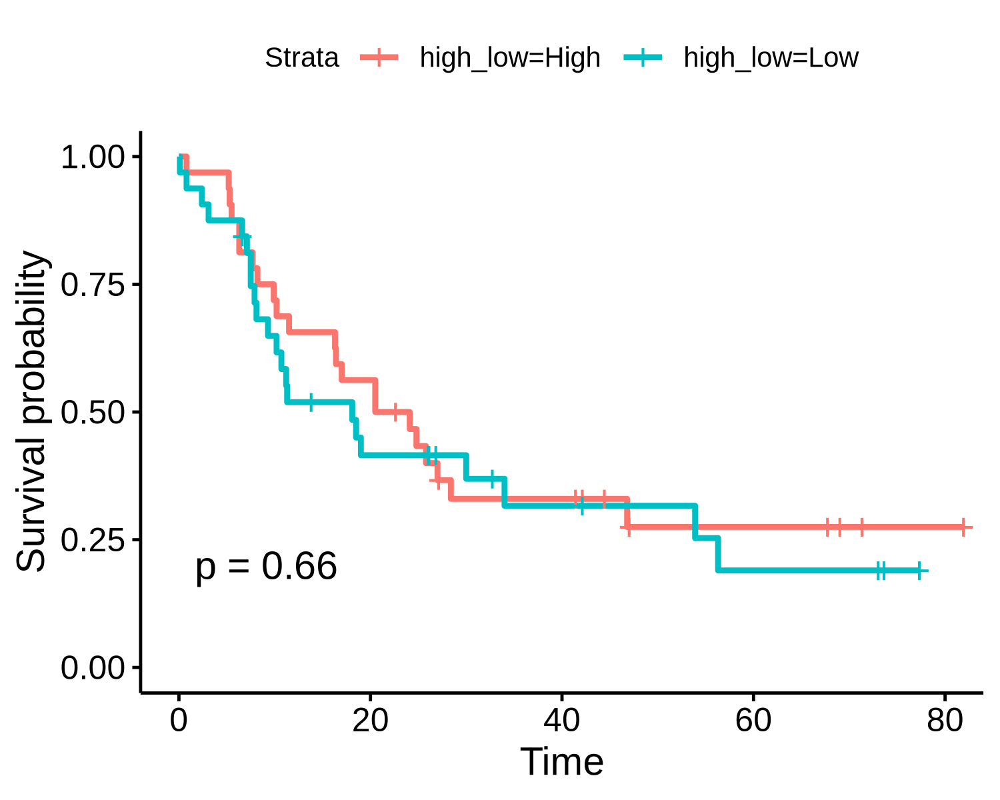

In [623]:
# Kaplan-Meier plot for a selected gene (example: ABHD5)
gene = gene_sel[8]
gene = 'ITGB6'
gene
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[karyotype == 'Normal', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)

# Plot KM curve
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)


[1] "BCAT1"

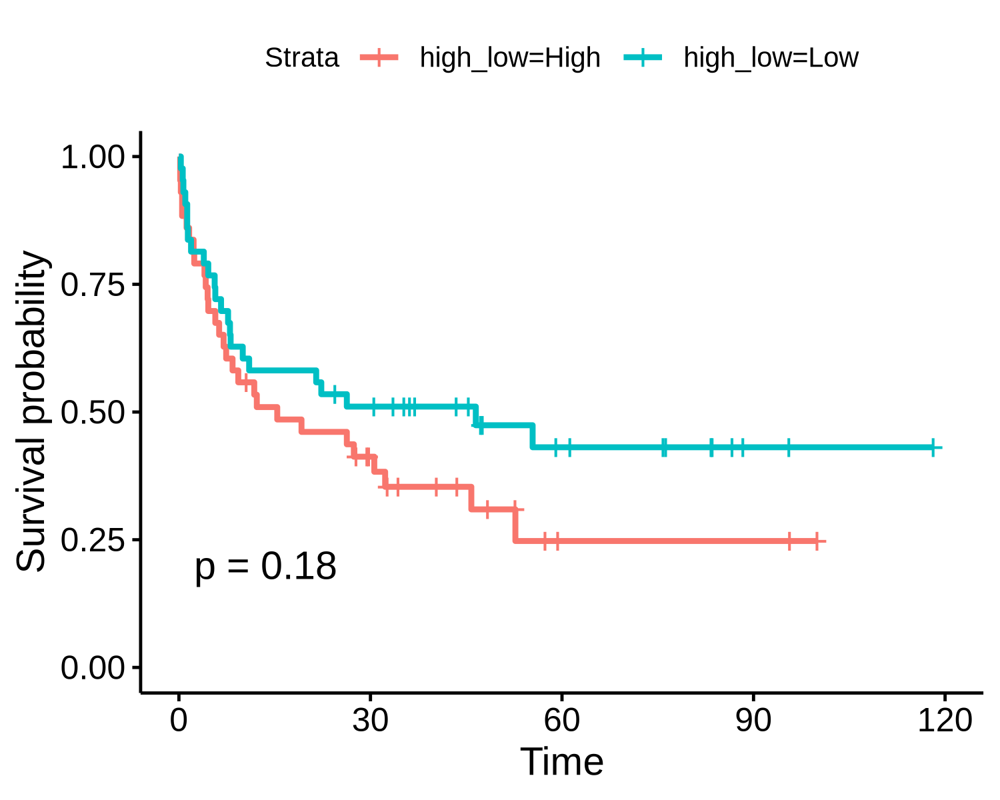

In [606]:
# Kaplan-Meier plot for a selected gene (example: ABHD5)
gene = gene_sel[8]
gene = 'BCAT1'
gene
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[karyotype == 'Altered', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)

# Plot KM curve
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)


[1] "HOXA3"

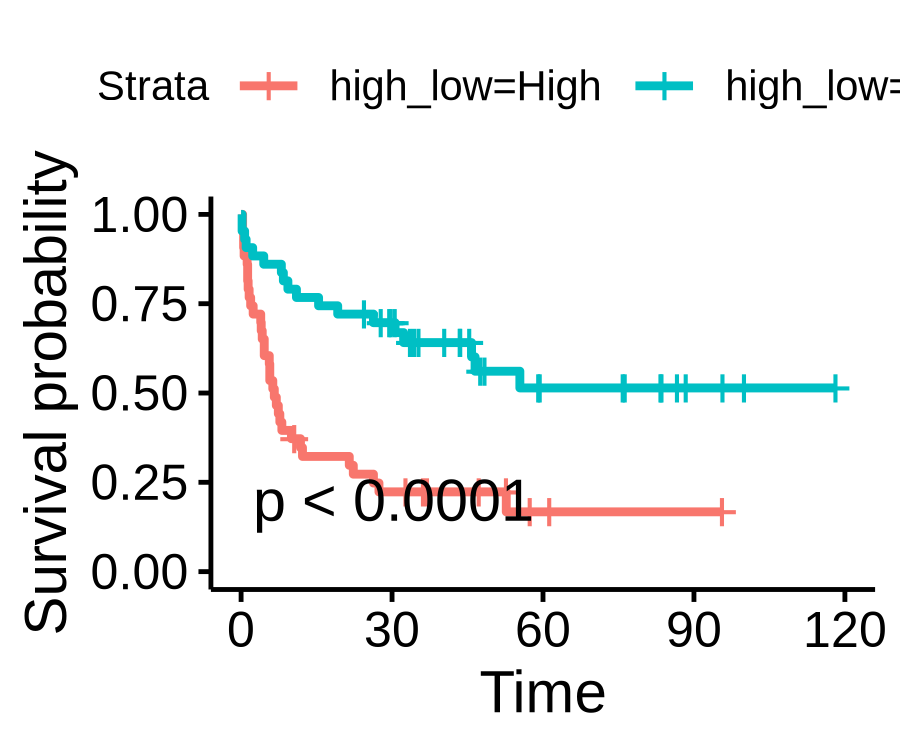

In [842]:
# Kaplan-Meier plot for a selected gene (example: ABHD5)
gene = gene_sel[8]
gene = 'HOXA3'
gene
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[karyotype == 'Altered', ]
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)

# Plot KM curve
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)


In [595]:
head(plotdat[, .(HOXA3, karyotype)])

HOXA3,karyotype
<dbl>,<chr>
-3.171528,Altered
-1.345345,Altered
5.384248,Altered
1.407839,Altered
4.889199,Altered
-1.509181,Altered


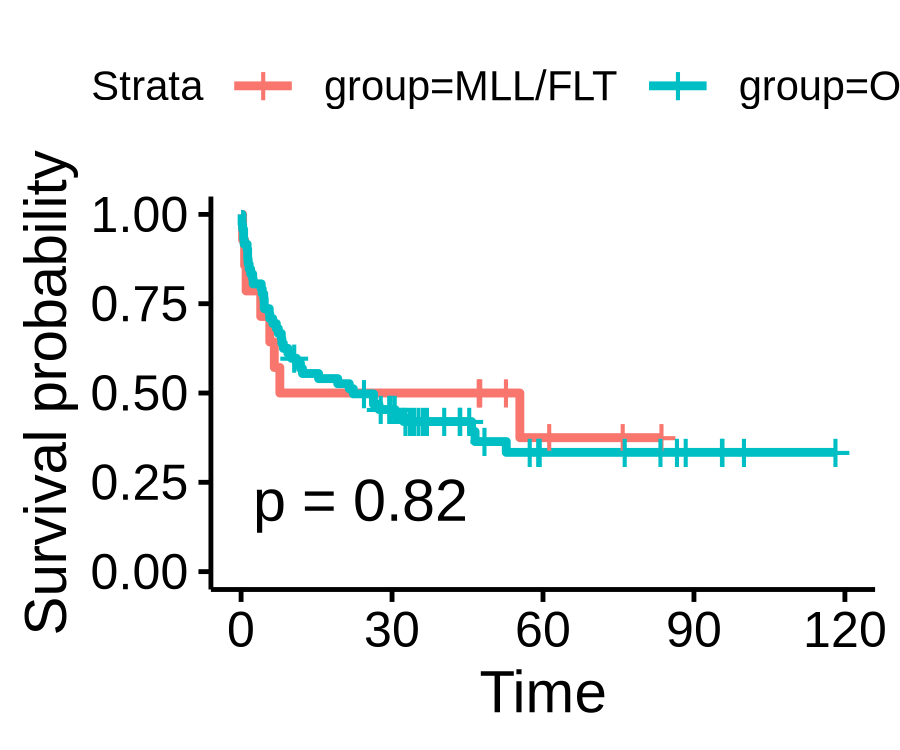

In [834]:
# Kaplan-Meier plot for a selected gene (example: ABHD5)
plotdat = xx2[OS_MONTHS > 0, ]
plotdat = plotdat[karyotype == 'Altered', ]
plotdat[, group := 'Others' ]
plotdat[MLL_re != 'WT' | FLT3ITD != 'WT', group := 'MLL/FLT' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ group, data = plotdat)

# Plot KM curve
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)


In [840]:
plotdat[MLL_re != 'WT' | FLT3ITD != 'WT', .(OS_MONTHS, OS_STATUS, group, MLL_re, FLT3ITD)]

OS_MONTHS,OS_STATUS,group,MLL_re,FLT3ITD
<dbl>,<dbl>,<chr>,<chr>,<chr>
7.7,1,MLL/FLT,MLL_re,WT
0.7,1,MLL/FLT,WT,FLT3ITD
0.3,1,MLL/FLT,MLL_re,WT
3.9,1,MLL/FLT,MLL_re,WT
47.2,0,MLL/FLT,MLL_re,WT
6.6,1,MLL/FLT,MLL_re,WT
5.7,1,MLL/FLT,WT,FLT3ITD
61.2,0,MLL/FLT,MLL_re,WT
52.6,0,MLL/FLT,WT,FLT3ITD


In [841]:
plotdat[FLT3ITD != 'WT', .(OS_MONTHS, OS_STATUS, group, MLL_re, FLT3ITD)]

OS_MONTHS,OS_STATUS,group,MLL_re,FLT3ITD
<dbl>,<dbl>,<chr>,<chr>,<chr>
0.7,1,MLL/FLT,WT,FLT3ITD
5.7,1,MLL/FLT,WT,FLT3ITD
52.6,0,MLL/FLT,WT,FLT3ITD
55.4,1,MLL/FLT,WT,FLT3ITD
47.5,0,MLL/FLT,WT,FLT3ITD
83.5,0,MLL/FLT,WT,FLT3ITD
1.0,1,MLL/FLT,WT,FLT3ITD
75.8,0,MLL/FLT,WT,FLT3ITD


In [835]:
table(plotdat$group)


MLL/FLT  Others 
     14      72 

[1]     6 59476

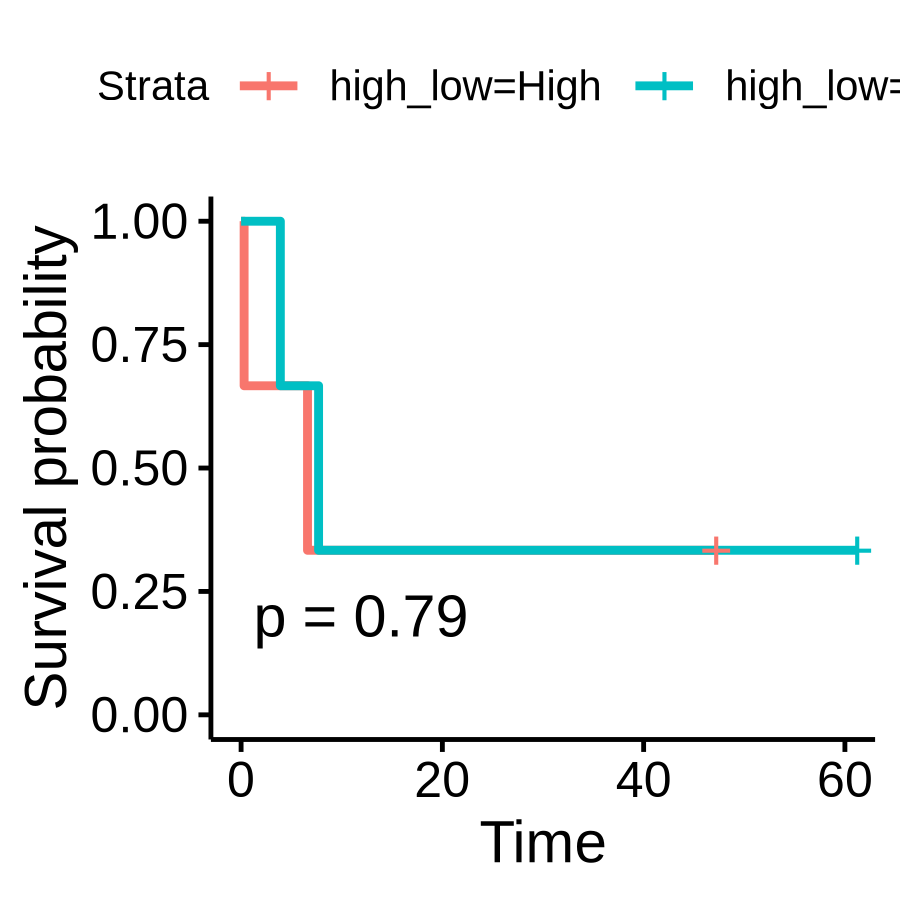

In [808]:
# Kaplan-Meier plot for a selected gene (example: ABHD5)
gene = 'HOXA3'
plotdat = xx2[OS_MONTHS > 0, ]
#plotdat = plotdat[karyotype == 'Altered', ]
plotdat = plotdat[MLL_re != 'WT', ]
dim(plotdat)
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)

# Plot KM curve
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)


[1]    16 59476

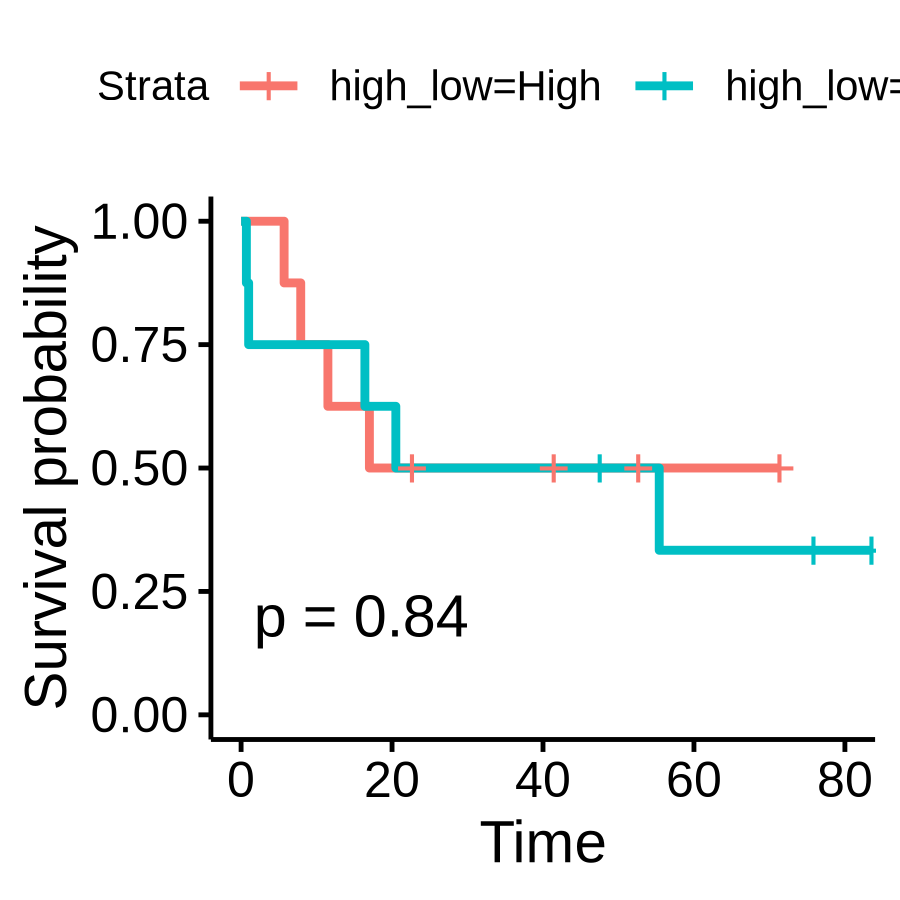

In [807]:
# Kaplan-Meier plot for a selected gene (example: ABHD5)
gene = 'HOXA3'
plotdat = xx2[OS_MONTHS > 0, ]
#plotdat = plotdat[karyotype == 'Altered', ]
plotdat = plotdat[FLT3ITD != 'WT', ]
dim(plotdat)
plotdat$high_low <- ifelse(plotdat[[gene]] > median(plotdat[[gene]]), "High", "Low")
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ high_low, data = plotdat)

# Plot KM curve
ggsurvplot(fit, data = plotdat, pval = TRUE, risk.table = F)


In [ ]:
xx$MLL_re
xx$FLT3ITD
xx$AML1ETO
PMLRARA + CBFBMYH11

GNB1_mut,KRAS_mut,CBL_mut,IDH1_mut,IDH2_mut,kk
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
WT,WT,WT,WT,WT,Normal
WT,WT,WT,WT,WT,Normal
WT,WT,WT,WT,WT,Normal
WT,WT,WT,WT,WT,PML-RARA


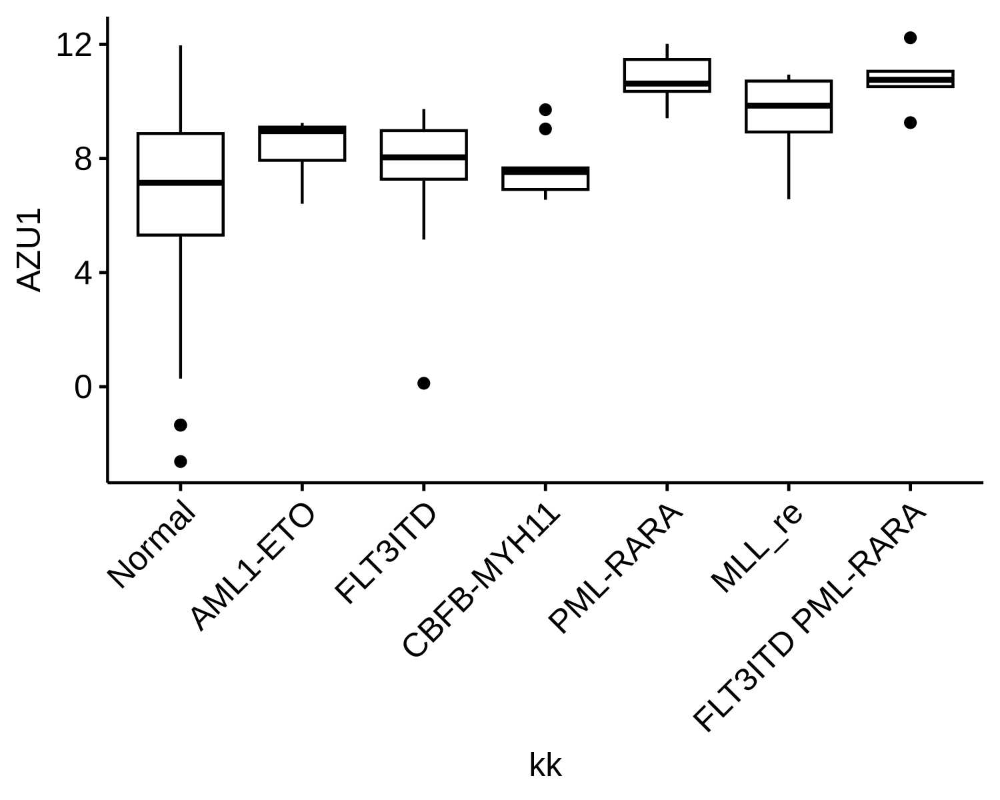

In [612]:
plotdat = xx[, .(MLL_re, FLT3ITD, AML1ETO, PMLRARA, CBFBMYH11)]
xx$kk = apply(plotdat, 1, function(xx){paste(setdiff(xx, 'WT'), collapse = ' ')})
xx[kk == '', kk := 'Normal']
ggboxplot(xx, x = 'kk', y = 'AZU1') + theme(axis.text.x = element_text(angle = 45, hjust = 1))
tail2(xx)

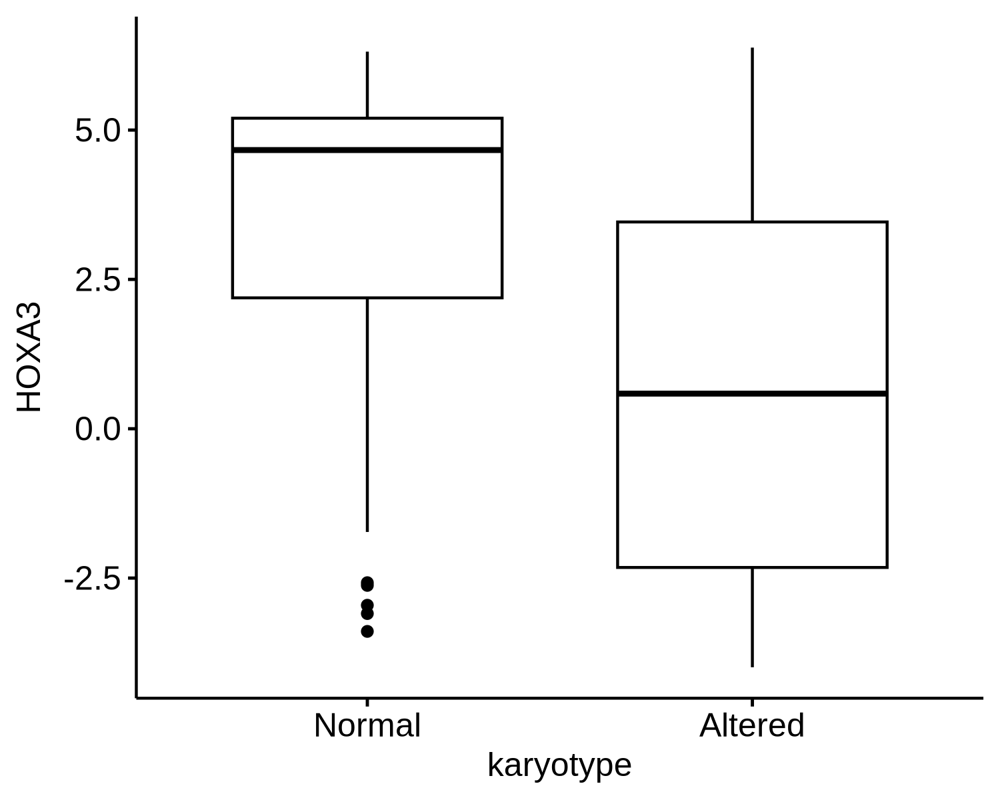

In [597]:
ggboxplot(xx, x = 'karyotype', y = 'HOXA3')

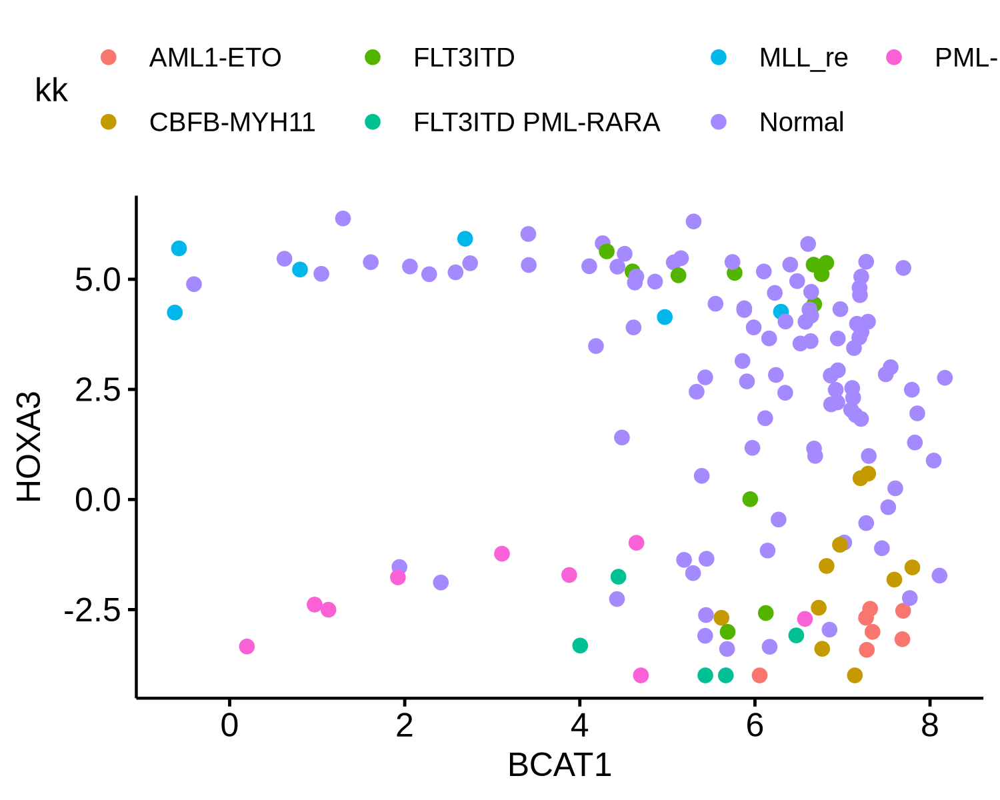

In [609]:
ggscatter(xx, x = 'BCAT1', y = 'HOXA3', color = 'kk')

# plot gene expression and methylation data together

In [632]:
library(Gviz)


In [663]:
beta_values <- assay(aml.met)


In [650]:
colnames(beta_values) = colData(aml.met)$barcode

In [660]:
na_count = apply(beta_values, 1, function(xx){sum(is.na(xx))})
beta_values_sel = beta_values[na_count < ncol(beta_values) / 2, ]
dim(beta_values)
dim(beta_values_sel)

[1] 485577    194

[1] 420182    194

In [661]:
head(beta_values_sel)

,TCGA-AB-2820-03A-01D-0741-05,TCGA-AB-2834-03A-01D-0741-05,TCGA-AB-2907-03A-01D-0742-05,TCGA-AB-2860-03A-01D-0741-05,TCGA-AB-2987-03A-01D-0742-05,TCGA-AB-2802-03A-01D-0741-05,TCGA-AB-2912-03A-01D-0741-05,TCGA-AB-2937-03A-01D-0742-05,TCGA-AB-3009-03A-01D-0741-05,TCGA-AB-2822-03A-01D-0741-05,⋯,TCGA-AB-2893-03A-01D-0742-05,TCGA-AB-2991-03A-01D-0741-05,TCGA-AB-2883-03A-01D-0742-05,TCGA-AB-2868-03A-01D-0741-05,TCGA-AB-2933-03A-01D-0742-05,TCGA-AB-2815-03A-01D-0741-05,TCGA-AB-2806-03A-01D-0741-05,TCGA-AB-2803-03A-01D-0741-05,TCGA-AB-2816-03A-01D-0742-05,TCGA-AB-2858-03A-01D-0741-05
cg21870274,0.9468636,0.8917181,0.7279987,0.7142758,0.6254675,0.9422213,0.9076475,0.9321413,0.9434045,0.8910656,⋯,0.8643214,0.7672789,0.6292331,0.6047219,0.9199514,0.8075438,0.9383901,0.9561515,0.7167662,0.7819337
cg08258224,0.9341366,0.8625047,0.8866142,0.8111682,0.7640439,0.7741067,0.8155077,0.9513121,0.9328338,0.9481954,⋯,0.8425006,0.5549990,0.9078151,0.8850148,0.8478841,0.6457341,0.7690907,0.9227901,0.8957913,0.8753022
cg16619049,0.1759337,0.5853813,0.3973959,0.6689342,0.4779156,0.7952200,0.2380224,0.2362806,0.9282960,0.5750057,⋯,0.1229066,0.7444135,0.2618014,0.6840850,0.2461930,0.6182981,0.1320708,0.9801954,0.8217208,0.3043563
cg18147296,0.8646709,0.8298466,0.8074146,0.8075105,0.6797458,0.6152393,0.8561870,0.8891721,0.8827631,0.8941376,⋯,0.8041969,0.8429980,0.8205765,0.8052135,0.8550889,0.8423599,0.8707798,0.8662713,0.9108702,0.8649698
cg13938959,0.5630350,0.4943619,0.7319818,0.4261075,0.3460068,0.5409752,0.2182752,0.5029939,0.5255058,0.5336407,⋯,0.8676097,0.5002222,0.4997751,0.7599573,0.6315971,0.4723376,0.1888177,0.8236412,0.5066883,0.3380445
cg12445832,0.4059090,0.1395645,0.2508933,0.2931942,0.2761562,0.4867122,0.1015120,0.4580122,0.1984021,0.4615292,⋯,0.4304769,0.3141716,0.2818025,0.5076546,0.4667413,0.3080670,0.1009109,0.6856354,0.4617594,0.2574826


In [707]:
tmp = as.data.table( colData(aml.met) )
q1_patient = tmp[bcat1_grp4 == 'Q1', patient]
q4_patient = tmp[bcat1_grp4 == 'Q4', patient]
q1_patient
q4_patient


[1] "TCGA-AB-3001" "TCGA-AB-2842" "TCGA-AB-2861" "TCGA-AB-2811" "TCGA-AB-2826" "TCGA-AB-2939" "TCGA-AB-2872" "TCGA-AB-2973" "TCGA-AB-2835" "TCGA-AB-2851" "TCGA-AB-2976" "TCGA-AB-2840"
[13] "TCGA-AB-2818" "TCGA-AB-3012" "TCGA-AB-2963" "TCGA-AB-2948" "TCGA-AB-2897" "TCGA-AB-2999" "TCGA-AB-2977" "TCGA-AB-2932" "TCGA-AB-2984" "TCGA-AB-2894" "TCGA-AB-2925" "TCGA-AB-2841"
[25] "TCGA-AB-3011" "TCGA-AB-2971" "TCGA-AB-2876" "TCGA-AB-2924" "TCGA-AB-2946" "TCGA-AB-2814" "TCGA-AB-2910" "TCGA-AB-2956" "TCGA-AB-2813" "TCGA-AB-2911" "TCGA-AB-2893" "TCGA-AB-2883"

[1] "TCGA-AB-2912" "TCGA-AB-2822" "TCGA-AB-2889" "TCGA-AB-2901" "TCGA-AB-2988" "TCGA-AB-2881" "TCGA-AB-2885" "TCGA-AB-2995" "TCGA-AB-2914" "TCGA-AB-2890" "TCGA-AB-2959" "TCGA-AB-2886"
[13] "TCGA-AB-2817" "TCGA-AB-2847" "TCGA-AB-2938" "TCGA-AB-2928" "TCGA-AB-2970" "TCGA-AB-2941" "TCGA-AB-2931" "TCGA-AB-2805" "TCGA-AB-2896" "TCGA-AB-2839" "TCGA-AB-2915" "TCGA-AB-2944"
[25] "TCGA-AB-2863" "TCGA-AB-2936" "TCGA-AB-2819" "TCGA-AB-2909" "TCGA-AB-2966" "TCGA-AB-2935" "TCGA-AB-2950" "TCGA-AB-2943" "TCGA-AB-2895" "TCGA-AB-2929" "TCGA-AB-2875" "TCGA-AB-2828"
[37] "TCGA-AB-2806"

In [ ]:
ann_dt$distanceToTSS

## plot AZU1

In [ ]:
##### mar

In [947]:
setnames(ann_dt, 7, 'probeid')
gene = 'AZU1'
ann_dt_gene = ann_dt[SYMBOL == 'AZU1', .(probeid, seqnames, start, end, meth_diff, distanceToTSS)]
ann_dt_gene = ann_dt_gene[abs(distanceToTSS) < 3000, ]
ann_dt_gene = ann_dt_gene[order(start), ]
ann_dt_gene[, probeid_lvl := factor(probeid, levels = ann_dt_gene$probeid) ]
ann_dt_gene[, .(seqnames, start, end, probeid, probeid_lvl)]

seqnames,start,end,probeid,probeid_lvl
<fct>,<int>,<int>,<chr>,<fct>
chr19,827429,827430,cg24101283,cg24101283
chr19,827431,827432,cg08025592,cg08025592
chr19,827715,827716,cg02147126,cg02147126
chr19,827739,827740,cg14663914,cg14663914
chr19,827776,827777,cg10752406,cg10752406
chr19,827821,827822,cg15610437,cg15610437
chr19,827843,827844,cg16643542,cg16643542
chr19,828170,828171,cg17823175,cg17823175


In [948]:
row_data = as.data.frame(rowData(aml.met))
row_data$probeid = rownames(row_data)
row_data_gene = row_data[ann_dt_gene$probeid, c('probeid', 'chrm_A', 'probeBeg', 'probeEnd')]
setnames(row_data_gene, c('probe', 'chr', 'start', 'end'))
row_data_gene

,probe,chr,start,end
,<chr>,<chr>,<int>,<dbl>
cg24101283,cg24101283,chr19,827430,827479
cg08025592,cg08025592,chr19,827432,827481
cg02147126,cg02147126,chr19,827716,827765
cg14663914,cg14663914,chr19,827690,827739
cg10752406,cg10752406,chr19,827776,827825
cg15610437,cg15610437,chr19,827822,827871
cg16643542,cg16643542,chr19,827843,827892
cg17823175,cg17823175,chr19,828171,828220


In [949]:
tmp = aml_exp_q14@assays@data$tpm_unstrand
rownames(tmp) = aml_exp_q14@rowRanges$gene_name
colnames(tmp) = aml_exp_q14@colData$patient

head(tmp)

,TCGA-AB-2847,TCGA-AB-2826,TCGA-AB-2818,TCGA-AB-2943,TCGA-AB-2928,TCGA-AB-2939,TCGA-AB-2959,TCGA-AB-2970,TCGA-AB-2935,TCGA-AB-2835,⋯,TCGA-AB-2910,TCGA-AB-2896,TCGA-AB-2912,TCGA-AB-2938,TCGA-AB-2973,TCGA-AB-2984,TCGA-AB-2890,TCGA-AB-2897,TCGA-AB-2885,TCGA-AB-2925
TSPAN6,0.7209,0.0000,0.1435,0.6311,0.6164,0.0725,0.1964,0.2024,1.1498,0.0847,⋯,0.1467,0.8482,0.0960,4.6936,0.0830,0.0173,0.6657,0.1228,4.2550,0.1076
TNMD,0.0692,0.0000,0.0000,0.0000,0.0000,0.0000,0.0862,0.0000,0.0000,0.0000,⋯,0.0000,0.0000,0.0000,0.2542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
DPM1,77.2942,55.0258,66.7135,60.8127,74.0228,59.4196,63.5850,68.8205,77.3615,70.5414,⋯,88.1921,84.1718,79.3036,45.6125,45.0458,69.5098,52.7452,48.7291,60.2443,53.1732
SCYL3,11.8915,9.0060,15.0414,20.8429,24.2994,14.3232,16.2538,15.6155,12.8666,5.8919,⋯,10.0525,13.2756,10.7266,10.2742,8.7875,2.8050,13.9472,6.2632,16.5422,7.4217
C1orf112,21.5152,5.9193,10.4341,16.5176,21.6503,12.6746,14.0493,13.4835,12.8016,8.9499,⋯,12.3281,12.4259,15.2491,12.0811,5.0263,3.6415,10.0316,5.8589,20.7512,7.7120
FGR,93.1199,404.1751,505.5796,79.0776,26.8689,89.0078,24.8003,116.8901,223.1892,564.9703,⋯,209.7009,87.2405,124.6410,45.8131,526.2364,1.5316,253.0851,26.5804,23.7126,300.8652


In [950]:
# Create tracks
beta_values_gene = beta_values_sel[as.character(row_data_gene$probe), ]
plotdat = as.data.table(melt(beta_values_gene) )
plotdat[, patient := substr(Var2, 1, 12) ]
plotdat = merge(plotdat, row_data_gene, by.x = 'Var1', by.y = 'probe', all.x = T)
plotdat[patient %in% q1_patient, group := 'Q1' ]
plotdat[patient %in% q4_patient, group := 'Q4' ]
plotdat = plotdat[!is.na(group), ]
plotdat[, Var1 := factor(Var1, levels = ann_dt_gene$probeid) ]
head(plotdat) 


Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(beta_values_gene). In the next version, this warning will become an error."


Var1,Var2,value,patient,chr,start,end,group
<fct>,<fct>,<dbl>,<chr>,<chr>,<int>,<dbl>,<chr>
cg02147126,TCGA-AB-2912-03A-01D-0741-05,0.3813482,TCGA-AB-2912,chr19,827716,827765,Q4
cg02147126,TCGA-AB-2822-03A-01D-0741-05,0.9029650,TCGA-AB-2822,chr19,827716,827765,Q4
cg02147126,TCGA-AB-3001-03A-01D-0741-05,0.2828648,TCGA-AB-3001,chr19,827716,827765,Q1
cg02147126,TCGA-AB-2842-03A-01D-0741-05,0.1450376,TCGA-AB-2842,chr19,827716,827765,Q1
cg02147126,TCGA-AB-2861-03A-01D-0741-05,0.1943708,TCGA-AB-2861,chr19,827716,827765,Q1
cg02147126,TCGA-AB-2889-03A-01D-0742-05,0.1411093,TCGA-AB-2889,chr19,827716,827765,Q4


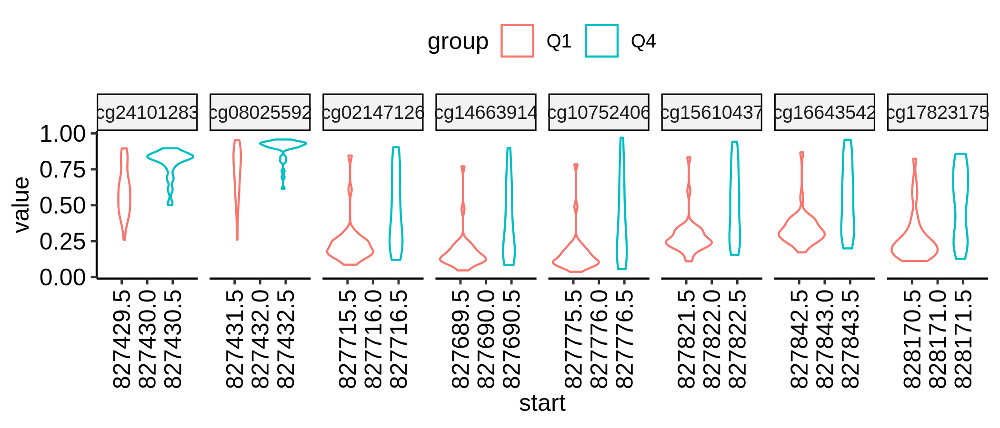

In [951]:
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 300)
gg = ggplot(plotdat, aes(x = start, y = value, col = group)) + geom_violin() +  theme_pubr() + facet_wrap(~Var1, scale = 'free_x', nrow = 1) + rotate_x_text(angle = 90)
ggsave(file = '~/WenhuoHu/plot/violin_azu1.pdf', width = 7, height = 3)
gg


In [814]:
logcpm_q14 = logcpm_fun(aml_exp_q14_mtx)

In [816]:
q1_patient

[1] "TCGA-AB-3001" "TCGA-AB-2842" "TCGA-AB-2861" "TCGA-AB-2811" "TCGA-AB-2826" "TCGA-AB-2939" "TCGA-AB-2872" "TCGA-AB-2973" "TCGA-AB-2835" "TCGA-AB-2851" "TCGA-AB-2976" "TCGA-AB-2840"
[13] "TCGA-AB-2818" "TCGA-AB-3012" "TCGA-AB-2963" "TCGA-AB-2948" "TCGA-AB-2897" "TCGA-AB-2999" "TCGA-AB-2977" "TCGA-AB-2932" "TCGA-AB-2984" "TCGA-AB-2894" "TCGA-AB-2925" "TCGA-AB-2841"
[25] "TCGA-AB-3011" "TCGA-AB-2971" "TCGA-AB-2876" "TCGA-AB-2924" "TCGA-AB-2946" "TCGA-AB-2814" "TCGA-AB-2910" "TCGA-AB-2956" "TCGA-AB-2813" "TCGA-AB-2911" "TCGA-AB-2893" "TCGA-AB-2883"

In [952]:
plotdat = melt(logcpm_q14[c('ITGB6', 'AZU1'), ])
plotdat = as.data.table(plotdat, keep.rownames = F)
plotdat[Var2 %in% q1_patient, group := 'Q1' ]
plotdat[Var2 %in% q4_patient, group := 'Q4' ]
plotdat = plotdat[!is.na(group), ]
plotdat[group == 'Q1', group2 := 'High' ]
plotdat[group == 'Q4', group2 := 'Low' ]
head(plotdat)

Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(logcpm_q14[c("ITGB6", "AZU1"), ]). In the next version, this warning will become an error."


Var1,Var2,value,group,group2
<fct>,<fct>,<dbl>,<chr>,<chr>
ITGB6,TCGA-AB-2847,-4.013316,Q4,Low
AZU1,TCGA-AB-2847,5.999506,Q4,Low
ITGB6,TCGA-AB-2826,-2.958484,Q1,High
AZU1,TCGA-AB-2826,9.244393,Q1,High
ITGB6,TCGA-AB-2818,-2.746592,Q1,High
AZU1,TCGA-AB-2818,9.802476,Q1,High


In [966]:
options(repr.plot.width = 3, repr.plot.height = 2.5, repr.plot.res = 300)
gg = ggboxplot(plotdat, x = 'group2', y = 'value', outlier.shape = NA) + facet_wrap(~ Var1, scale = 'free_y') + ylab('Gene expression\n(log CPM)') +
stat_compare_means(method = "t.test")  # Adds p-value for t-test

ggsave(gg, file = '~/WenhuoHu/plot/mar/two_gene_azu_itgb5.pdf', width = 4, height = 2)
gg

ERROR: Error in data[[x]]: subscript out of bounds


## plot ITGB6



In [790]:
colnames(ann_dt)

[1] "rn"                       "seqnames"                 "start"                    "end"                      "width"                    "strand"                  
 [7] "probeid"                  "mean.Q1"                  "mean.Q4"                  "mean.Q1.minus.mean.Q4"    "p.value.Q1.Q4"            "p.value.adj.Q1.Q4"       
[13] "status"                   "meth_diff"                "logFDR"                   "status2"                  "address_A"                "address_B"               
[19] "channel"                  "designType"               "nextBase"                 "nextBaseRef"              "probeType"                "orientation"             
[25] "probeCpGcnt"              "context35"                "probeBeg"                 "probeEnd"                 "ProbeSeq_A"               "ProbeSeq_B"              
[31] "gene"                     "gene_HGNC"                "chrm_A"                   "beg_A"                    "flag_A"                   "mapQ_A"                  
[37] "cigar_A"                  "NM_A"                     "chrm_B"                   "beg_B"                    "flag_B"                   "mapQ_B"                  
[43] "cigar_B"                  "NM_B"                     "wDecoy_chrm_A"            "wDecoy_beg_A"             "wDecoy_flag_A"            "wDecoy_mapQ_A"           
[49] "wDecoy_cigar_A"           "wDecoy_NM_A"              "wDecoy_chrm_B"            "wDecoy_beg_B"             "wDecoy_flag_B"            "wDecoy_mapQ_B"           
[55] "wDecoy_cigar_B"           "wDecoy_NM_B"              "posMatch"                 "MASK_mapping"             "MASK_typeINextBaseSwitch" "MASK_rmsk15"             
[61] "MASK_sub40_copy"          "MASK_sub35_copy"          "MASK_sub30_copy"          "MASK_sub25_copy"          "MASK_snp5_common"         "MASK_snp5_GMAF1p"        
[67] "MASK_extBase"             "MASK_general"             "FDR"                      "annotation"               "geneChr"                  "geneStart"               
[73] "geneEnd"                  "geneLength"               "geneStrand"               "geneId"                   "transcriptId"             "distanceToTSS"           
[79] "ENSEMBL"                  "SYMBOL"                   "GENENAME"

In [805]:
setnames(ann_dt, 7, 'probeid')
gene = 'ITGB6'
ann_dt_gene = ann_dt[SYMBOL == 'ITGB6', .(probeid, seqnames, start, end, meth_diff, distanceToTSS, SYMBOL, meth_diff, FDR)]
head(ann_dt_gene[, .(seqnames, start, end, probeid, SYMBOL)])
ann_dt_gene = ann_dt_gene[abs(distanceToTSS) < 10000, ]
ann_dt_gene = ann_dt_gene[order(start), ]
ann_dt_gene[, probeid_lvl := factor(probeid, levels = ann_dt_gene$probeid) ]
head(ann_dt_gene[, .(seqnames, start, end, probeid, probeid_lvl, SYMBOL, meth_diff, FDR, distanceToTSS)])
fwrite(ann_dt_gene[, .(seqnames, start, end, probeid, probeid_lvl, meth_diff, FDR)], file = '~/itgb_cpg.bed', sep = '\t')


seqnames,start,end,probeid,SYMBOL
<fct>,<int>,<int>,<chr>,<chr>
chr2,161136804,161136805,cg25058482,ITGB6
chr2,161136367,161136368,cg19914919,ITGB6
chr2,161123641,161123642,cg10663897,ITGB6
chr2,161030643,161030644,cg12341429,ITGB6
chr2,160993912,160993913,cg15635633,ITGB6
chr2,161160132,161160133,cg13701159,ITGB6


seqnames,start,end,probeid,probeid_lvl,SYMBOL,meth_diff,FDR,distanceToTSS
<fct>,<int>,<int>,<chr>,<fct>,<chr>,<dbl>,<dbl>,<dbl>
chr2,161063495,161063496,cg07617207,cg07617207,ITGB6,0.001985619,0.825394855,-6680
chr2,161123641,161123642,cg10663897,cg10663897,ITGB6,-0.069413773,0.019325966,4758
chr2,161136367,161136368,cg19914919,cg19914919,ITGB6,-0.246938823,0.009211471,-7968
chr2,161136804,161136805,cg25058482,cg25058482,ITGB6,-0.015585069,0.003382705,-8406


In [802]:
head(ann_dt$)

[1]  0.3337109 -0.4704986 -0.4475901 -0.4385272 -0.4660362  0.3436180

In [795]:
row_data = as.data.frame(rowData(aml.met))
row_data$probeid = rownames(row_data)
row_data_gene = row_data[ann_dt_gene$probeid, c('probeid', 'chrm_A', 'probeBeg', 'probeEnd')]
setnames(row_data_gene, c('probe', 'chr', 'start', 'end'))
row_data_gene

,probe,chr,start,end
,<chr>,<chr>,<int>,<dbl>
cg07617207,cg07617207,chr2,161063446,161063495
cg10663897,cg10663897,chr2,161123642,161123691
cg19914919,cg19914919,chr2,161136318,161136367
cg25058482,cg25058482,chr2,161136805,161136854


In [796]:
# Create tracks
beta_values_gene = beta_values_sel[as.character(row_data_gene$probe), ]
plotdat = as.data.table(melt(beta_values_gene) )
plotdat[, patient := substr(Var2, 1, 12) ]
plotdat = merge(plotdat, row_data_gene, by.x = 'Var1', by.y = 'probe', all.x = T)
plotdat[patient %in% q1_patient, group := 'Q1' ]
plotdat[patient %in% q4_patient, group := 'Q4' ]
plotdat = plotdat[!is.na(group), ]
plotdat[, Var1 := factor(Var1, levels = ann_dt_gene$probeid) ]
head(plotdat) 


Warning message:
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(beta_values_gene). In the next version, this warning will become an error."


Var1,Var2,value,patient,chr,start,end,group
<fct>,<fct>,<dbl>,<chr>,<chr>,<int>,<dbl>,<chr>
cg07617207,TCGA-AB-2912-03A-01D-0741-05,0.9581834,TCGA-AB-2912,chr2,161063446,161063495,Q4
cg07617207,TCGA-AB-2822-03A-01D-0741-05,0.9427049,TCGA-AB-2822,chr2,161063446,161063495,Q4
cg07617207,TCGA-AB-3001-03A-01D-0741-05,0.9132346,TCGA-AB-3001,chr2,161063446,161063495,Q1
cg07617207,TCGA-AB-2842-03A-01D-0741-05,0.9641499,TCGA-AB-2842,chr2,161063446,161063495,Q1
cg07617207,TCGA-AB-2861-03A-01D-0741-05,0.9308617,TCGA-AB-2861,chr2,161063446,161063495,Q1
cg07617207,TCGA-AB-2889-03A-01D-0742-05,0.9589360,TCGA-AB-2889,chr2,161063446,161063495,Q4


Warning message:
"Removed 3 rows containing non-finite outside the scale range (`stat_ydensity()`)."
Warning message:
"Removed 3 rows containing non-finite outside the scale range (`stat_ydensity()`)."


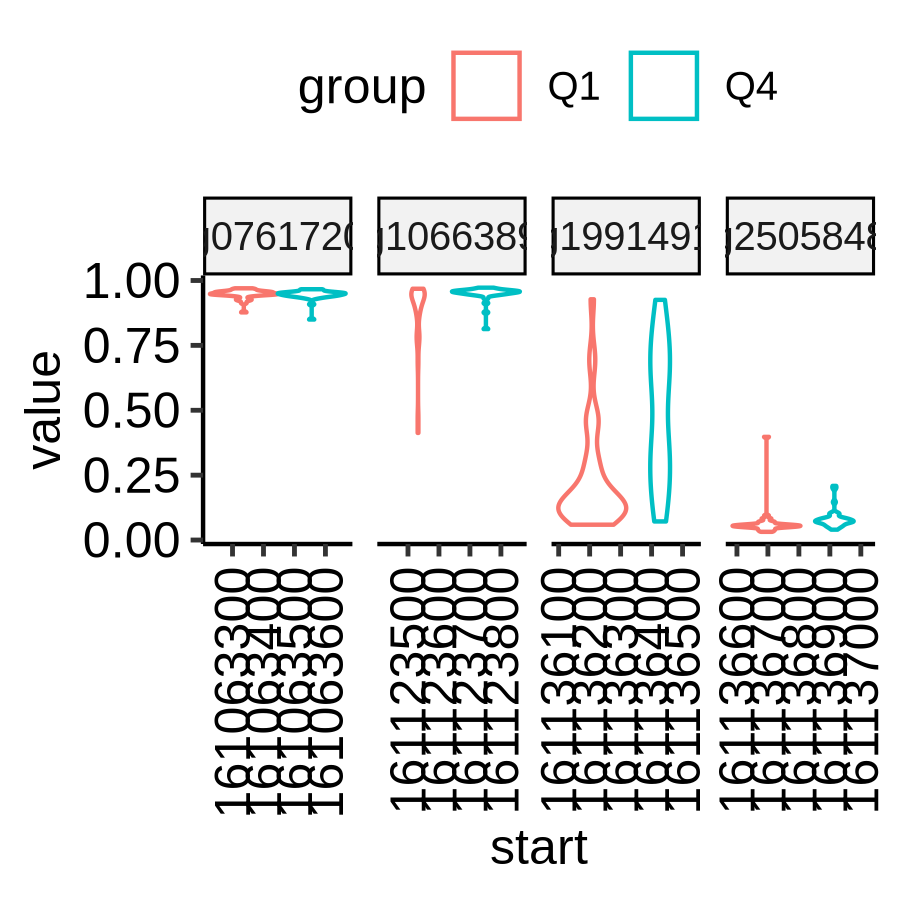

In [800]:
options(repr.plot.width = 3, repr.plot.height = 3, repr.plot.res = 300)
gg = ggplot(plotdat, aes(x = start, y = value, col = group)) + geom_violin() +  theme_pubr() + facet_wrap(~Var1, scale = 'free_x', nrow = 1) + rotate_x_text(angle = 90)
ggsave(file = '~/WenhuoHu/plot/violin_itgb6.pdf', width = 7, height = 3)
gg


# heatmap

In [95]:
##### mar

options(repr.plot.width = 10, repr.plot.height = 10, repr.plot.res = 200)

plotdat = logcpm_bcat1[rownames(logcpm_bcat1) %in% deg_dmc[sig %in% c('Dn'), rn], rownames(dsn_col)]
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'group', drop = F])
#column_ra = rowAnnotation(df = st_4_sel[, .(Model)]) 
# left_annotation = column_ra, 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ha, column_split = factor(dsn_col$group, levels = c('Q1', 'Q4')))  


pdf(file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/heatmap_DEG_BCAT1_high_vs_low.pdf', width = 10, height = 10)
column_ha = HeatmapAnnotation(df = dsn_col[, 'group', drop = F])
#column_ra = rowAnnotation(df = st_4_sel[, .(Model)]) 
# left_annotation = column_ra, 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ha, column_split = factor(dsn_col$group, levels = c('Q1', 'Q4')))  
dev.off()
fwrite(plotdat, file = '~/WenhuoHu/repos/bcat1_dna_methylation/plot/heatmap_DEG_BCAT1_high_vs_low.xls', sep = '\t')


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'table' in selecting a method for function '%in%': Object 'sig' not found amongst [rn, logFC, logCPM, PValue, FDR, distanceToTSS, meth_diff, nn]


# deprecated code

In [ ]:
enrich_go = enrichGO(deg_dmc[sig %in% c('Up'), rn], OrgDb = org.Hs.eg.db, keyType = 'SYMBOL', ont = 'CC', pAdjustMethod = "BH",
                pvalueCutoff = 0.01, qvalueCutoff = 0.05)
enrich_go

In [93]:
tmp = as.data.table(aml.exp@colData)
tmp[, idd := 1:nrow(tmp) ]
tmp = merge(tmp, mtx_tpm_t_clin_genetics[, .(rn, bcat1_grp4)], by.x = 'patient', by.y = 'rn', all.x = T)
tmp = tmp[order(idd), ]
tmp = relocate(tmp, 'barcode')
aml.exp@colData = DataFrame(tmp)
head2(aml.exp@colData)


DataFrame with 3 rows and 5 columns
                 barcode      patient           sample shortLetterCode             definition
             <character>  <character>      <character>     <character>            <character>
1 TCGA-AB-2987-03A-01T.. TCGA-AB-2987 TCGA-AB-2987-03A              TB Primary Blood Derive..
2 TCGA-AB-2857-03A-01T.. TCGA-AB-2857 TCGA-AB-2857-03A              TB Primary Blood Derive..
3 TCGA-AB-2847-03A-01T.. TCGA-AB-2847 TCGA-AB-2847-03A              TB Primary Blood Derive..

In [ ]:
aml.exp.aux <- subset(aml.exp,  select = colData(aml.exp)$bcat1_grp4 %in% c("Q1", "Q2"))  

idx  <- colData(aml.exp.aux)$bcat1_grp4 %in% c("Q1")
idx2 <- colData(aml.exp.aux)$bcat1_grp4 %in% c("Q1")

dataPrep <- TCGAanalyze_Preprocessing(
    object = aml.exp.aux, 
    cor.cut = 0.6
)

dataNorm <- TCGAanalyze_Normalization(
    tabDF = dataPrep,
    geneInfo = geneInfoHT,
    method = "gcContent"
)

dataFilt <- TCGAanalyze_Filtering(
    tabDF = dataNorm,
    qnt.cut = 0.25,
    method = 'quantile'
)

dataDEGs <- TCGAanalyze_DEA(
    mat1 = dataFilt[,idx],
    mat2 = dataFilt[,idx2],
    Cond1type = "CIMP-high",
    Cond2type = "CIMP-low",
    method = "glmLRT"
)

TCGAVisualize_volcano(
    x = dataDEGs$logFC,
    y = dataDEGs$FDR,
    filename = "case3/Case3_volcanoexp.png",
    x.cut = 3,
    y.cut = 10^-5,
    names = rownames(dataDEGs),
    color = c("black","red","darkgreen"),
    names.size = 2,
    xlab = " Gene expression fold change (Log2)",
    legend = "State",
    title = "Volcano plot (CIMP-high vs CIMP-low)",
    width = 10
)


In [6]:
tcga_methylation = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/data/tcga_aml_methylation_450.rds')


In [7]:
dim(tcga_methylation)

[1] 486427    194

# DMR analysis

# export 

In [ ]:
saveRDS(mtx_tpm_t_clin_genetics, file = 'mtx_tpm_t_clin_genetics_16Jul.rds')
saveRDS(aml.met, file = 'aml_met_15Jul.rds')
saveRDS(aml.exp, file = 'aml_exp_15Jul.rds')
saveRDS(aml_met_cpg_diff, file = 'aml_met_cpg_diff_17Jul.rds')
saveRDS(aml_met_cpg_diff_grp2, file = 'aml_met_cpg_diff_grp2.rds')

In [926]:
saveRDS(aml_met_cpg_diff_q23, file = 'aml_met_cpg_diff_q23.rds')

In [42]:
aml_met_cpg_diff_q23 = readRDS('aml_met_cpg_diff_q23.rds')

In [ ]:
saveRDS(aml_met_cpg_diff, file = 'aml_met_cpg_diff_Q4_Q1.rds')

In [794]:
saveRDS(met_assay, file = 'met_assay.rds')

In [792]:
saveRDS(bot_probes, file = 'bot_probes.rds')
saveRDS(int_probes, file = 'int_probes.rds')
saveRDS(top_probes, file = 'top_probes.rds')
saveRDS(ann_dt, file = 'ann_dt.rds')
saveRDS(deg_dmc, file = 'deg_dmc.rds')


In [252]:
saveRDS(deg_dmc, file = 'deg_dmc.rds')


In [134]:
deg_dmc = readRDS('deg_dmc.rds')

In [51]:
saveRDS(aml_met_cpg_diff_grp2, file = 'aml_met_cpg_diff_grp2.rds')


In [18]:
aml_met_cpg_diff_grp2 =  readRDS('aml_met_cpg_diff_grp2.rds')


In [17]:
mtx_tpm_t_clin_genetics = readRDS(file = 'mtx_tpm_t_clin_genetics_16Jul.rds')
aml.met = readRDS('aml_met_15Jul.rds')
aml.exp = readRDS('aml_exp_15Jul.rds')
aml_met_cpg_diff = readRDS(file = 'aml_met_cpg_diff_17Jul.rds')
aml_met_cpg_diff_grp2 = readRDS(file = 'aml_met_cpg_diff_grp2.rds')
bot_probes = readRDS(file = 'bot_probes.rds')
int_probes = readRDS(file = 'int_probes.rds')
top_probes = readRDS(file = 'top_probes.rds')



In [116]:
saveRDS(deg_bcat1, file = 'deg_bcat1.rds') # high bcat1 vs low bcat1

# back up code

In [ ]:
# Load the chain file for hg19 to hg38
chain_file <- "/home/whu78/script/ai/sei-manuscript/resources/hg19ToHg38.over.chain"
chain <- import.chain(chain_file)

int_probes_gr = as.data.table(IlluminaHumanMethylation450kprobe[int_probes, ])
int_probes_gr[, chr := paste0('chr', chr)]
head(int_probes_gr)

# Convert to GRanges object
gr_hg19 <- GRanges(
  seqnames = int_probes_gr$chr,
  ranges = IRanges(start = int_probes_gr$start, end = int_probes_gr$end)
)

# Lift over from hg19 to hg38
gr_hg38 <- liftOver(gr_hg19, chain)

# Extract and view the results
int_probes_gr <- as.data.table(as.data.frame(gr_hg38))
head(int_probes_gr)
fwrite(int_probes_gr[, .(seqnames, start, end)], file = 'int.bed', sep = '\t', col.names = F)


In [ ]:
design <- model.matrix(~ paper_Histologic.grade, data = clinical)
# fit the linear model 
fit <- lmFit(mval, design)
fit2 <- eBayes(fit)

# extracting significantly methylated probes
deff.meth = topTable(fit2, coef=ncol(design), sort.by="p",number = nrow(mval), adjust.method = "BY")
# Visualization
# plot the top 10 most significantly differentially methylated CpGs 
par(mfrow=c(2,5))
sapply(rownames(deff.meth)[1:10], function(cpg){
  plotCpg(bval, cpg=cpg, pheno=clinical$paper_Histologic.grade, ylab = "Beta values")
})


In [ ]:
myAnnotation <- cpg.annotate(object = mval, datatype = "array", 
                             what = "M", 
                             analysis.type = "differential", 
                             design = design, 
                             contrasts = FALSE, 
                             coef = "paper_Histologic.gradeHigh Grade", 
                             arraytype = "450K",
                             fdr = 0.001)
str(myAnnotation)

# DMR analysis
DMRs <- dmrcate(myAnnotation, lambda=1000, C=2)
results.ranges <- extractRanges(DMRs)
results.ranges

# visualization
dmr.table <- data.frame(results.ranges)

# setting up a variable for grouping and color

pal <- brewer.pal(8,"Dark2")
groups <- pal[1:length(unique(clinical$paper_Histologic.grade))]
names(groups) <- levels(factor(clinical$paper_Histologic.grade))

#setting up the genomic region 
gen <- "hg19"
# the index of the DMR that we will plot 
dmrIndex <- 2
# coordinates are stored under results.ranges[dmrIndex]

chrom <- as.character(seqnames(results.ranges[dmrIndex]))
start <- as.numeric(start(results.ranges[dmrIndex]))
end <- as.numeric(end(results.ranges[dmrIndex]))

# add 25% extra space to plot
minbase <- start - (0.25*(end-start))
maxbase <- end + (0.25*(end-start))


# defining CpG islands track
# download cpgislands for chromosome number 6 from ucsc
chr6.cpg <- read.csv("chr6-cpg.csv")

islandData <- GRanges(seqnames=Rle(chr6.cpg[,1]), 
                      ranges=IRanges(start=chr6.cpg[,2],
                                     end=chr6.cpg[,3]),
                      strand=Rle(strand(rep("*",nrow(chr6.cpg)))))

# DNAseI hypersensitive sites track
#downloaded from ucsc
chr6.dnase <- read.csv("chr6-dnase.csv")

dnaseData <- GRanges(seqnames=chr6.dnase[,1],
                     ranges=IRanges(start=chr6.dnase[,2], end=chr6.dnase[,3]),
                     strand=Rle(rep("*",nrow(chr6.dnase))),
                     data=chr6.dnase[,5])

#Setting up the ideogram, genome, and RefSeq tracks 

iTrack <- IdeogramTrack(genome = gen, chromosome = chrom, name=paste0(chrom))
gTrack <- GenomeAxisTrack(col="black", cex=1, name="", fontcolor="black")
rTrack <- UcscTrack(genome=gen, chromosome=chrom, track="NCBI RefSeq", 
                    from=minbase, to=maxbase, trackType="GeneRegionTrack", 
                    rstarts="exonStarts", rends="exonEnds", gene="name", 
                    symbol="name2", transcript="name", strand="strand", 
                    fill="darkblue",stacking="squish", name="RefSeq", 
                    showId=TRUE, geneSymbol=TRUE)

#Ensure that the methylation data is ordered by chromosome and base position.

ann450kOrd <- ann450k[order(ann450k$chr,ann450k$pos),]
bvalOrd <- bval[match(ann450kOrd$Name,rownames(bval)),]

#Create the data tracks:
# create genomic ranges object from methylation data
cpgData <- GRanges(seqnames=Rle(ann450kOrd$chr),
                   ranges=IRanges(start=ann450kOrd$pos, end=ann450kOrd$pos),
                   strand=Rle(rep("*",nrow(ann450kOrd))),
                   betas=bvalOrd)

# methylation data track
methTrack <- DataTrack(range=cpgData, 
                       groups=clinical$paper_Histologic.grade, # change this if your groups are different
                       genome = gen,
                       chromosome=chrom,
                       ylim=c(-0.05,1.05),
                       col=pal,
                       type=c("a","p"), 
                       name="DNA Meth.\n(beta value)",
                       background.panel="white", 
                       legend=TRUE, 
                       cex.title=0.8,
                       cex.axis=0.8, 
                       cex.legend=0.8)

# CpG island track
islandTrack <- AnnotationTrack(range=islandData, genome=gen, name="CpG Is.", 
                               chromosome=chrom,fill="darkgreen")

# DNaseI hypersensitive site data track
dnaseTrack <- DataTrack(range=dnaseData, genome=gen, name="DNAseI", 
                        type="gradient", chromosome=chrom)

# DMR position data track
dmrTrack <- AnnotationTrack(start=start, end=end, genome=gen, name="DMR", 
                            chromosome=chrom,fill="darkred")


# Set up the tracklist and indicate the relative sizes of the different tracks. 
# Finally, draw the plot using the plotTracks function
tracks <- list(iTrack, gTrack, methTrack, dmrTrack, islandTrack, dnaseTrack,
               rTrack)
sizes <- c(2,2,5,2,2,2,3) # set up the relative sizes of the tracks
# to save figure and scaling graphic device
tiff( filename = "dmr.tiff", width = 15, height = 10, units = "in", res = 400)
plotTracks(tracks, from=minbase, to=maxbase, showTitle=TRUE, add53=TRUE, 
           add35=TRUE, grid=TRUE, lty.grid=3, sizes = sizes, length(tracks))
dev.off()
